# MiniProyecto 1 Tratamiento de señales III
# *Realizado por:*
# * **Juan José Raad Abril --> CC 1004898991**
# * **Richard Alexander Velez --> CC 1007111510**

# Introducción: En esta entrega del MiniProyecto el fin es preprocesar las imagenes de nuestro dataset por tal razon realizamos el siguiente proceso:



1.   Elegir 100 imagenes por clase para reducir sesgos y tener una mayor eficiencia en el sistema
2.   Se agregó ruido sal y pimienta a todas las imagenes (500 imagenes, 100 por categoria).
3. Se aplicó el filtro de mediana a las 500 imagenes.
4. Se normalizaron las 500 imagenes para que el modelo las procese de mejor manera.
5. Se intentó hacer una ecualización de las imagenes pero se comprobó que no ayuda en este tipo de imagenes.
5. Se realizó una detección de bordes con Sobel para distinguir mucho mejor la separación de los bordes del hueso.
6. Se redimensionaron las imagenes a 224*224.



**Se suben las imagenes del dataset**

In [ ]:
from google.colab import files
files.upload()  # Sube kaggle.json


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"juanjoseraadabril","key":"6d24ab15a85a039b85284c4cfd1971bb"}'}

In [ ]:
  !mkdir -p ~/.kaggle
  !cp kaggle.json ~/.kaggle/
  !chmod 600 ~/.kaggle/kaggle.json


In [ ]:
  !kaggle datasets download -d hafiznouman786/annotated-dataset-for-knee-arthritis-detection
  !unzip annotated-dataset-for-knee-arthritis-detection.zip -d arthritis_dataset


Dataset URL: https://www.kaggle.com/datasets/hafiznouman786/annotated-dataset-for-knee-arthritis-detection
License(s): CC0-1.0
  0% 0.00/58.3M [00:00<?, ?B/s]
100% 58.3M/58.3M [00:00<00:00, 2.28GB/s]
Archive:  annotated-dataset-for-knee-arthritis-detection.zip
  inflating: arthritis_dataset/Training/0Normal/NormalG0 (1).png  
  inflating: arthritis_dataset/Training/0Normal/NormalG0 (10).png  
  inflating: arthritis_dataset/Training/0Normal/NormalG0 (100).png  
  inflating: arthritis_dataset/Training/0Normal/NormalG0 (101).png  
  inflating: arthritis_dataset/Training/0Normal/NormalG0 (102).png  
  inflating: arthritis_dataset/Training/0Normal/NormalG0 (103).png  
  inflating: arthritis_dataset/Training/0Normal/NormalG0 (104).png  
  inflating: arthritis_dataset/Training/0Normal/NormalG0 (105).png  
  inflating: arthritis_dataset/Training/0Normal/NormalG0 (106).png  
  inflating: arthritis_dataset/Training/0Normal/NormalG0 (107).png  
  inflating: arthritis_dataset/Training/0Normal/Norm

**Se listan las clases que se encuentran en el dataset (Paths)**

In [ ]:
  import os

  path = "arthritis_dataset"
  print("Contenido base:", os.listdir(path))

  train_path = os.path.join(path, "Training")
  print("Contenido de Training:", os.listdir(train_path))


Contenido base: ['Training']
Contenido de Training: ['1Doubtful', '0Normal', '3Moderate', '4Severe', '2Mild']


**Se eligen 100 imagenes por clase siguiendo la recomendación, en este caso las 100 primeras imagenes de cada clase separando estas en diccionarios diferentes.**

In [ ]:
import os
import cv2

# Ruta base del dataset
dataset_path = '/content/arthritis_dataset/Training'

# Categorías
categories = ['0Normal', '1Doubtful', '2Mild', '3Moderate', '4Severe']

# Diccionario para guardar las imágenes por clase
imagenes_0Normal = []
imagenes_1Doubtful = []
imagenes_2Mild = []
imagenes_3Moderate = []
imagenes_4Severe = []

# Diccionario auxiliar para referenciar los arreglos
clase_a_arreglo = {
    '0Normal': imagenes_0Normal,
    '1Doubtful': imagenes_1Doubtful,
    '2Mild': imagenes_2Mild,
    '3Moderate': imagenes_3Moderate,
    '4Severe': imagenes_4Severe
}

# Procesar cada categoría
for categoria in categories:
    ruta_categoria = os.path.join(dataset_path, categoria)
    archivos = sorted(os.listdir(ruta_categoria))[:100]  # Elegir las primeras 100 imágenes
    for archivo in archivos:
        ruta_imagen = os.path.join(ruta_categoria, archivo)
        imagen = cv2.imread(ruta_imagen)  # Cargar imagen
        if imagen is not None:
            clase_a_arreglo[categoria].append(imagen)

# Verificar la cantidad de imágenes cargadas
print("Imágenes por clase:")
for categoria, arreglo in clase_a_arreglo.items():
    print(f"{categoria}: {len(arreglo)} imágenes")


Imágenes por clase:
0Normal: 100 imágenes
1Doubtful: 100 imágenes
2Mild: 100 imágenes
3Moderate: 100 imágenes
4Severe: 100 imágenes


**Se muestran las primeras radiografias de cada categoria:**

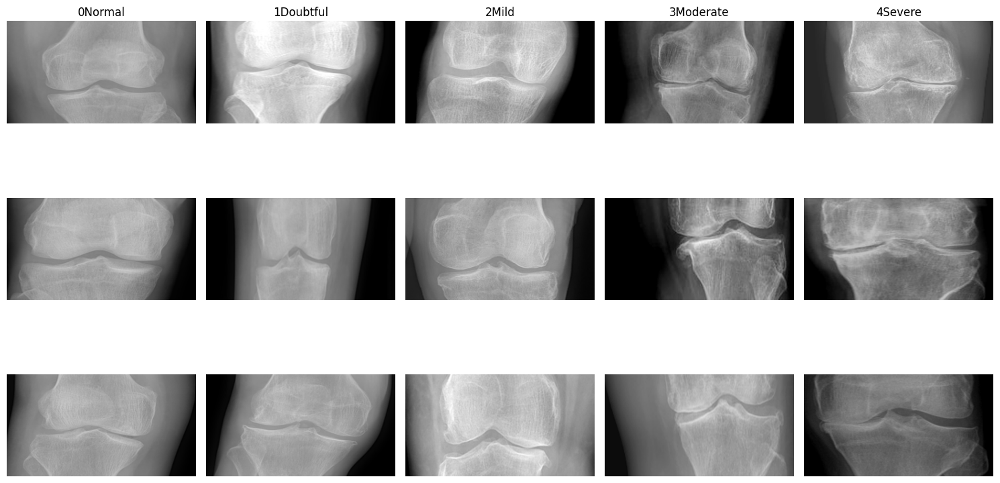

In [ ]:
import matplotlib.pyplot as plt

# Listas de clases y sus arreglos
nombres_clases = ['0Normal', '1Doubtful', '2Mild', '3Moderate', '4Severe']
arreglos_imagenes = [
    imagenes_0Normal,
    imagenes_1Doubtful,
    imagenes_2Mild,
    imagenes_3Moderate,
    imagenes_4Severe
]

# Mostrar las 3 primeras imágenes por clase (una por fila, por clase)
plt.figure(figsize=(15, 9))

for clase_idx in range(5):  # 5 clases
    for img_idx in range(3):  # 3 imágenes por clase
        imagen = arreglos_imagenes[clase_idx][img_idx]
        plt.subplot(3, 5, img_idx * 5 + clase_idx + 1)
        plt.imshow(imagen, cmap='gray')
        if img_idx == 0:
            plt.title(nombres_clases[clase_idx])
        plt.axis('off')

plt.tight_layout()
plt.show()


**Se agrega ruido sal y pimienta a todas las imagenes con el objetivo de simular un preprocesamiento más teóric, ya que en la practica las radiografias no salen con este ruido. Procedemos a mostrar una imagen de cada categoria con ruido sal y pimienta.**

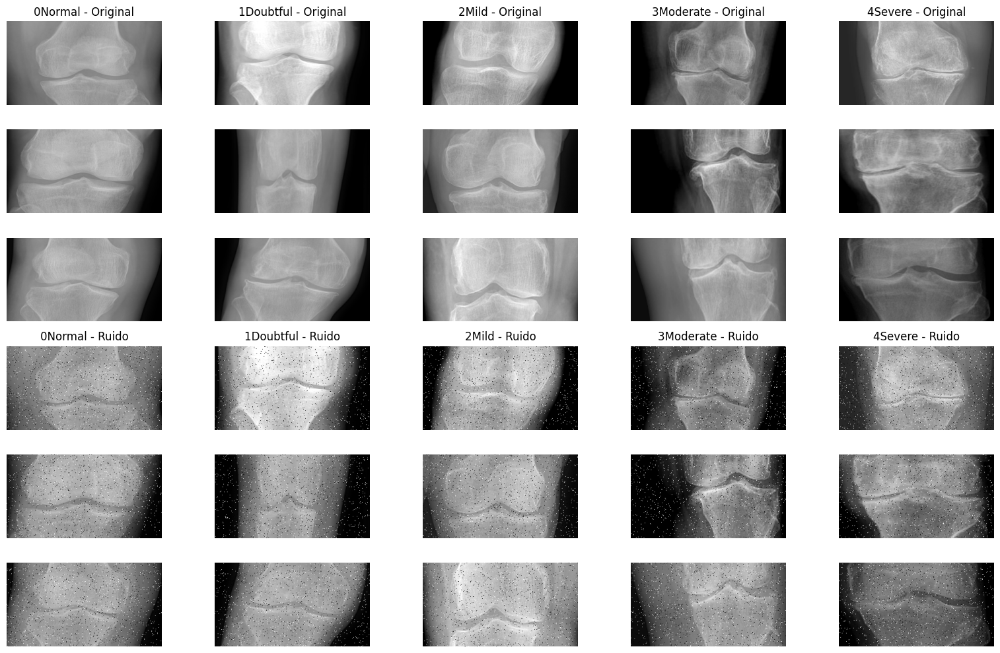

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def agregar_ruido_sal_pimienta(imagen, cantidad=0.02):
    imagen_ruidosa = imagen.copy()
    filas, columnas = imagen.shape[:2]
    num_pixeles = int(cantidad * filas * columnas)

    # Agregar sal (blancos)
    for _ in range(num_pixeles):
        i = np.random.randint(0, filas)
        j = np.random.randint(0, columnas)
        imagen_ruidosa[i, j] = 255 if len(imagen.shape) == 2 else [255, 255, 255]

    # Agregar pimienta (negros)
    for _ in range(num_pixeles):
        i = np.random.randint(0, filas)
        j = np.random.randint(0, columnas)
        imagen_ruidosa[i, j] = 0 if len(imagen.shape) == 2 else [0, 0, 0]

    return imagen_ruidosa

# Crear nuevas listas para imágenes con ruido
imagenes_ruido = {
    '0Normal': [],
    '1Doubtful': [],
    '2Mild': [],
    '3Moderate': [],
    '4Severe': []
}

# Agregar ruido a todas las imágenes
for categoria, imagenes in clase_a_arreglo.items():
    for imagen in imagenes:
        con_ruido = agregar_ruido_sal_pimienta(imagen, cantidad=0.02)
        imagenes_ruido[categoria].append(con_ruido)

# Mostrar las 3 primeras imágenes originales y con ruido
plt.figure(figsize=(16, 10))
for clase_idx, categoria in enumerate(categories):
    for img_idx in range(3):
        original = clase_a_arreglo[categoria][img_idx]
        con_ruido = imagenes_ruido[categoria][img_idx]

        # Fila de imágenes originales
        plt.subplot(6, 5, img_idx * 5 + clase_idx + 1)
        plt.imshow(original, cmap='gray')
        if img_idx == 0:
            plt.title(f'{categoria} - Original')
        plt.axis('off')

        # Fila de imágenes con ruido
        plt.subplot(6, 5, (img_idx + 3) * 5 + clase_idx + 1)
        plt.imshow(con_ruido, cmap='gray')
        if img_idx == 0:
            plt.title(f'{categoria} - Ruido')
        plt.axis('off')

plt.tight_layout()
plt.show()



**Se aplica un filtro de mediana a todas las imagenes con ruido sal y pimienta, ya que en el laboratorio se evidenció que este filtro funciona bien para este tipo de ruido. Por último se hace una comparacion entre las imagenes originales con ruido y filtradas.**

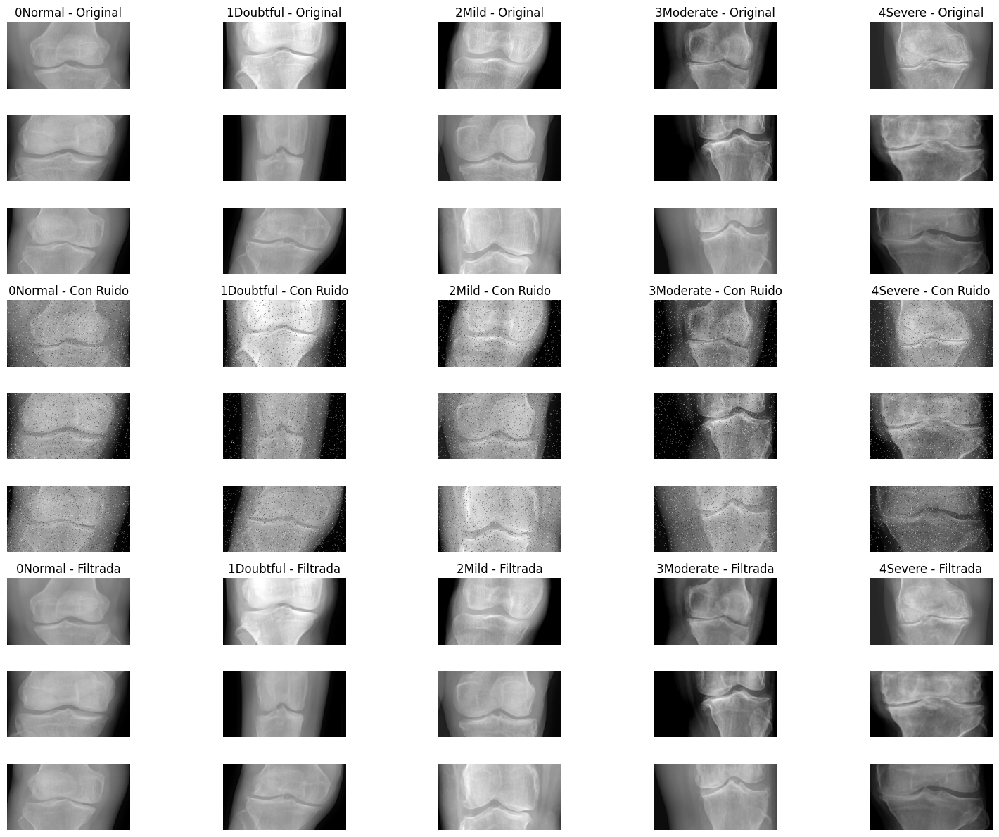

In [ ]:
import cv2
import matplotlib.pyplot as plt

# Aplicar filtro de mediana a todas las imágenes con ruido
imagenes_filtradas = {
    '0Normal': [],
    '1Doubtful': [],
    '2Mild': [],
    '3Moderate': [],
    '4Severe': []
}

for categoria in categories:
    for imagen in imagenes_ruido[categoria]:
        filtrada = cv2.medianBlur(imagen, ksize=3)
        imagenes_filtradas[categoria].append(filtrada)

# Mostrar las 3 primeras: Original - Ruido - Filtrada
plt.figure(figsize=(16, 12))

for clase_idx, categoria in enumerate(categories):
    for img_idx in range(3):
        original = clase_a_arreglo[categoria][img_idx]
        con_ruido = imagenes_ruido[categoria][img_idx]
        filtrada = imagenes_filtradas[categoria][img_idx]

        # Original
        plt.subplot(9, 5, img_idx * 5 + clase_idx + 1)
        plt.imshow(original, cmap='gray')
        if img_idx == 0:
            plt.title(f'{categoria} - Original')
        plt.axis('off')

        # Ruido
        plt.subplot(9, 5, (img_idx + 3) * 5 + clase_idx + 1)
        plt.imshow(con_ruido, cmap='gray')
        if img_idx == 0:
            plt.title(f'{categoria} - Con Ruido')
        plt.axis('off')

        # Filtrada
        plt.subplot(9, 5, (img_idx + 6) * 5 + clase_idx + 1)
        plt.imshow(filtrada, cmap='gray')
        if img_idx == 0:
            plt.title(f'{categoria} - Filtrada')
        plt.axis('off')

plt.tight_layout()
plt.show()



**Se normalizan (Normalización Min-Max a rango [0, 1]) todas las imagenes con el fin de que nuestro modelo de Machine Learning las procese correctamente.**

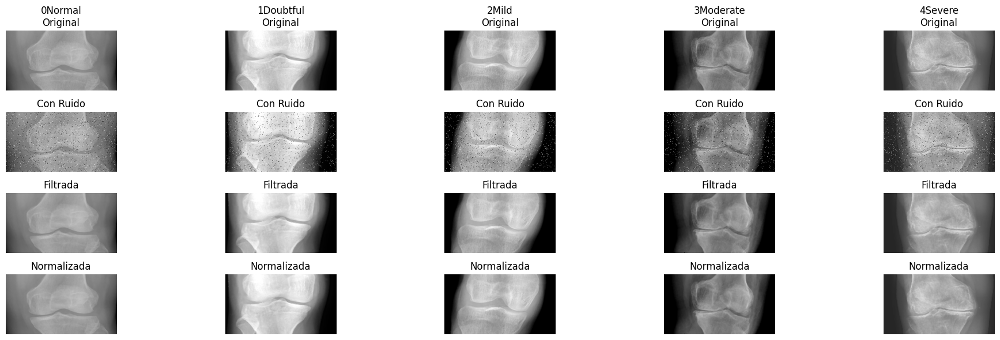

In [ ]:
# Normalizar imágenes filtradas (escala de grises de 0 a 1)
imagenes_normalizadas = {
    '0Normal': [],
    '1Doubtful': [],
    '2Mild': [],
    '3Moderate': [],
    '4Severe': []
}

for categoria in categories:
    for imagen in imagenes_filtradas[categoria]:
        normalizada = imagen.astype(np.float32) / 255.0  # Convertimos a float y normalizamos
        imagenes_normalizadas[categoria].append(normalizada)

# Mostrar Original - Con Ruido - Filtrada - Normalizada
plt.figure(figsize=(20, 6))

for i, categoria in enumerate(categories):
    original = clase_a_arreglo[categoria][0]
    con_ruido = imagenes_ruido[categoria][0]
    filtrada = imagenes_filtradas[categoria][0]
    normalizada = imagenes_normalizadas[categoria][0]

    # Original
    plt.subplot(4, 5, i + 1)
    plt.imshow(original, cmap='gray')
    plt.title(f'{categoria}\nOriginal')
    plt.axis('off')

    # Con ruido
    plt.subplot(4, 5, i + 6)
    plt.imshow(con_ruido, cmap='gray')
    plt.title('Con Ruido')
    plt.axis('off')

    # Filtrada
    plt.subplot(4, 5, i + 11)
    plt.imshow(filtrada, cmap='gray')
    plt.title('Filtrada')
    plt.axis('off')

    # Normalizada
    plt.subplot(4, 5, i + 16)
    plt.imshow(normalizada, cmap='gray')
    plt.title('Normalizada')
    plt.axis('off')

plt.tight_layout()
plt.show()


**Se busca hacer una ecualizacion de las imagenes con una funcionalidad de Python llamada CLAHE, pero se evidencia que el resultado de esta ecualizacion no es satisfactorio, ya que el color de los huesos se ve afectado, por ende se descarta la ecualizacion para nuestro preprocesamiento de las imagenes.**

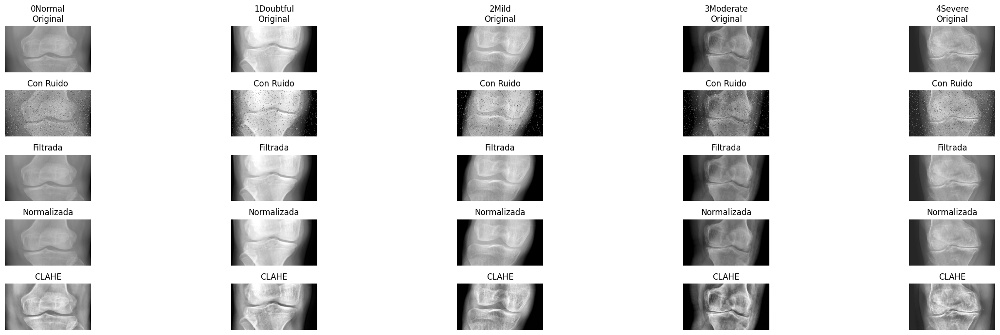

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Diccionario para guardar imágenes ecualizadas con CLAHE
imagenes_clahe = {
    '0Normal': [],
    '1Doubtful': [],
    '2Mild': [],
    '3Moderate': [],
    '4Severe': []
}

# Crear objeto CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))

# Aplicar CLAHE a las imágenes normalizadas
for categoria in categories:
    for imagen in imagenes_normalizadas[categoria]:
        # Convertir de [0,1] float32 a [0,255] uint8
        imagen_uint8 = (imagen * 255).astype(np.uint8)

        # Asegurar que es una imagen en escala de grises (2D)
        if imagen_uint8.ndim == 3:
            imagen_uint8 = cv2.cvtColor(imagen_uint8, cv2.COLOR_RGB2GRAY)

        # Aplicar CLAHE
        imagen_ecualizada = clahe.apply(imagen_uint8)
        imagenes_clahe[categoria].append(imagen_ecualizada)

# Mostrar: Original - Con Ruido - Filtrada - Normalizada - CLAHE
plt.figure(figsize=(25, 7))

for i, categoria in enumerate(categories):
    original = clase_a_arreglo[categoria][0]
    con_ruido = imagenes_ruido[categoria][0]
    filtrada = imagenes_filtradas[categoria][0]
    normalizada = imagenes_normalizadas[categoria][0]

    # Convertimos para visualización
    clahe_img = imagenes_clahe[categoria][0]

    # Original
    plt.subplot(5, 5, i + 1)
    plt.imshow(original, cmap='gray')
    plt.title(f'{categoria}\nOriginal')
    plt.axis('off')

    # Con Ruido
    plt.subplot(5, 5, i + 6)
    plt.imshow(con_ruido, cmap='gray')
    plt.title('Con Ruido')
    plt.axis('off')

    # Filtrada
    plt.subplot(5, 5, i + 11)
    plt.imshow(filtrada, cmap='gray')
    plt.title('Filtrada')
    plt.axis('off')

    # Normalizada
    plt.subplot(5, 5, i + 16)
    plt.imshow(normalizada, cmap='gray')
    plt.title('Normalizada')
    plt.axis('off')

    # Ecualizada CLAHE
    plt.subplot(5, 5, i + 21)
    plt.imshow(clahe_img, cmap='gray')
    plt.title('CLAHE')
    plt.axis('off')

plt.tight_layout()
plt.show()


**Se realizan otras ecualizacion con CLAHE pero aplicando diferentes enfoques y esto reafirma nuestra decisión de no utilizar ecualización.**

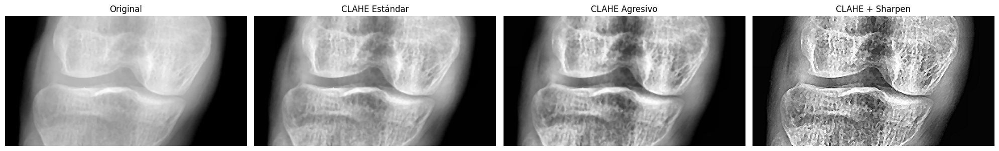

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Escoger una categoría para mostrar (puedes cambiarla)
categoria = '2Mild'
imagen_original = imagenes_filtradas[categoria][0]

# Asegurarse de que la imagen sea uint8
imagen_uint8 = (imagen_original.astype(np.float32) / 255.0 * 255).astype(np.uint8)

# Asegurar escala de grises (por si acaso)
if imagen_uint8.ndim == 3:
    imagen_uint8 = cv2.cvtColor(imagen_uint8, cv2.COLOR_RGB2GRAY)

# CLAHE estándar
clahe_std = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_img_std = clahe_std.apply(imagen_uint8)

# CLAHE más agresivo
clahe_agresivo = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8, 8))
clahe_img_agresivo = clahe_agresivo.apply(imagen_uint8)

# CLAHE + Realce de bordes
clahe_sharp = clahe_agresivo.apply(imagen_uint8)
kernel_sharpen = np.array([[0, -1, 0],
                           [-1, 5, -1],
                           [0, -1, 0]])
clahe_img_sharpened = cv2.filter2D(clahe_sharp, -1, kernel_sharpen)

# Mostrar resultados
plt.figure(figsize=(20, 4))

imagenes = [imagen_uint8, clahe_img_std, clahe_img_agresivo, clahe_img_sharpened]
titulos = ['Original', 'CLAHE Estándar', 'CLAHE Agresivo', 'CLAHE + Sharpen']

for i, (img, title) in enumerate(zip(imagenes, titulos)):
    plt.subplot(1, 4, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()


**Se realiza tambien la ecualizacion clásica y el gamma correction para observar si se logra notar alguna mejoria en los bordes del hueso pero esto no sucede, por ende no se aplica ninguno de estos procesos.**

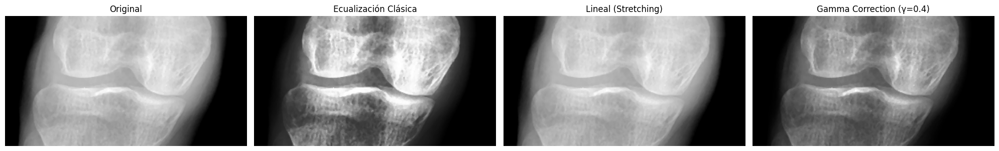

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Elegir imagen filtrada (una por categoría)
categoria = '2Mild'
imagen_original = imagenes_filtradas[categoria][0]

# Asegurar que esté en formato uint8 escala de grises
imagen_uint8 = (imagen_original.astype(np.float32) / 255.0 * 255).astype(np.uint8)
if imagen_uint8.ndim == 3:
    imagen_uint8 = cv2.cvtColor(imagen_uint8, cv2.COLOR_RGB2GRAY)

# 1. Ecualización global clásica (OpenCV)
ecualizada_clasica = cv2.equalizeHist(imagen_uint8)

# 2. Ecualización lineal (stretching)
def ecualizacion_lineal(img):
    min_val = np.min(img)
    max_val = np.max(img)
    estirada = ((img - min_val) / (max_val - min_val)) * 255
    return estirada.astype(np.uint8)

ecualizada_lineal = ecualizacion_lineal(imagen_uint8)

# 3. Gamma correction (brillo/contraste no lineal)
def gamma_correction(img, gamma=0.4):
    invGamma = 1.0 / gamma
    tabla = np.array([(i / 255.0) ** invGamma * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(img, tabla)

ecualizada_gamma = gamma_correction(imagen_uint8, gamma=0.4)

# Mostrar todas las imágenes
plt.figure(figsize=(20, 4))

imagenes = [
    imagen_uint8,
    ecualizada_clasica,
    ecualizada_lineal,
    ecualizada_gamma
]

titulos = [
    'Original',
    'Ecualización Clásica',
    'Lineal (Stretching)',
    'Gamma Correction (γ=0.4)'
]

for i, (img, title) in enumerate(zip(imagenes, titulos)):
    plt.subplot(1, 4, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(title)
    plt.axis('off')

plt.tight_layout()
plt.show()


**Se hace una detección de bordes por medio de sobel para de tal manera distinguir de mejor manera la separación de las fronteras del hueso lo cual sera fundamental para nuestra clasificación de los niveles de Artritis.**

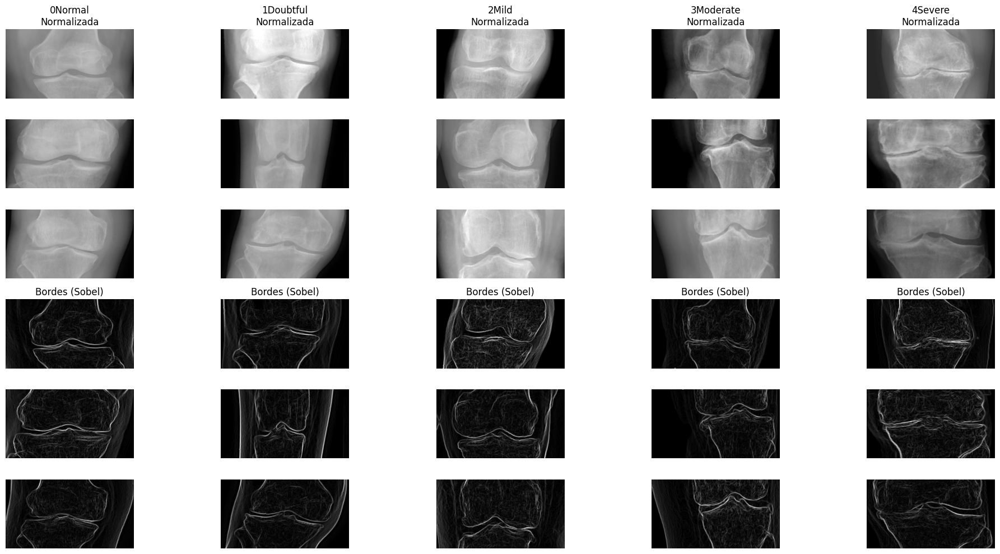

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Diccionario para guardar imágenes con Sobel
imagenes_bordes = {
    '0Normal': [],
    '1Doubtful': [],
    '2Mild': [],
    '3Moderate': [],
    '4Severe': []
}

# Aplicar Sobel a todas las imágenes normalizadas
for categoria in categories:
    for imagen_norm in imagenes_normalizadas[categoria]:
        img_float = imagen_norm.astype(np.float32)
        sobelx = cv2.Sobel(img_float, cv2.CV_64F, 1, 0, ksize=3)
        sobely = cv2.Sobel(img_float, cv2.CV_64F, 0, 1, ksize=3)
        sobel_total = np.sqrt(sobelx**2 + sobely**2)
        sobel_total = sobel_total / sobel_total.max()
        imagenes_bordes[categoria].append(sobel_total)

# Mostrar las 3 primeras imágenes por categoría
plt.figure(figsize=(20, 10))

for clase_idx, categoria in enumerate(categories):
    for img_idx in range(3):
        imagen_norm = imagenes_normalizadas[categoria][img_idx]
        imagen_sobel = imagenes_bordes[categoria][img_idx]

        # Imagen normalizada
        plt.subplot(6, 5, img_idx * 5 + clase_idx + 1)
        plt.imshow(imagen_norm, cmap='gray')
        if img_idx == 0:
            plt.title(f'{categoria}\nNormalizada')
        plt.axis('off')

        # Imagen con bordes Sobel
        plt.subplot(6, 5, (img_idx + 3) * 5 + clase_idx + 1)
        plt.imshow(imagen_sobel, cmap='gray')
        if img_idx == 0:
            plt.title('Bordes (Sobel)')
        plt.axis('off')

plt.tight_layout()
plt.show()




**Se busca verificar si todas las imagenes tienen las mismas dimensiones y no es el caso.**

In [ ]:
import os
import cv2

# Ruta base del dataset
dataset_path = '/content/arthritis_dataset/Training'

# Categorías
categories = ['0Normal', '1Doubtful', '2Mild', '3Moderate', '4Severe']

# Diccionario para guardar las imágenes por clase
imagenes_0Normal = []
imagenes_1Doubtful = []
imagenes_2Mild = []
imagenes_3Moderate = []
imagenes_4Severe = []

# Diccionario auxiliar para referenciar los arreglos
clase_a_arreglo = {
    '0Normal': imagenes_0Normal,
    '1Doubtful': imagenes_1Doubtful,
    '2Mild': imagenes_2Mild,
    '3Moderate': imagenes_3Moderate,
    '4Severe': imagenes_4Severe
}

# Procesar cada categoría
for categoria in categories:
    ruta_categoria = os.path.join(dataset_path, categoria)
    archivos = sorted(os.listdir(ruta_categoria))[:100]  # Elegir las primeras 100 imágenes
    for archivo in archivos:
        ruta_imagen = os.path.join(ruta_categoria, archivo)
        imagen = cv2.imread(ruta_imagen)  # Cargar imagen
        if imagen is not None:
            clase_a_arreglo[categoria].append(imagen)

# Verificar si todas las imágenes tienen la misma dimensión
dimension_referencia = None
todas_mismas = True

for categoria, arreglo in clase_a_arreglo.items():
    for imagen in arreglo:
        if dimension_referencia is None:
            dimension_referencia = imagen.shape  # Obtener la dimensión de la primera imagen
        elif imagen.shape != dimension_referencia:
            todas_mismas = False
            print(f"Las imágenes en la categoría {categoria} no tienen la misma dimensión.")
            break

if todas_mismas:
    print("Todas las imágenes tienen la misma dimensión.")
else:
    print("No todas las imágenes tienen la misma dimensión.")


Las imágenes en la categoría 3Moderate no tienen la misma dimensión.
No todas las imágenes tienen la misma dimensión.


**Por tal razon se procede a realizar un redimensionamiento de 300*160 para garantizar que todas las imagenes tengan las mismas dimensiones. Esto se hace para todas las imagenes y se almacenan.**

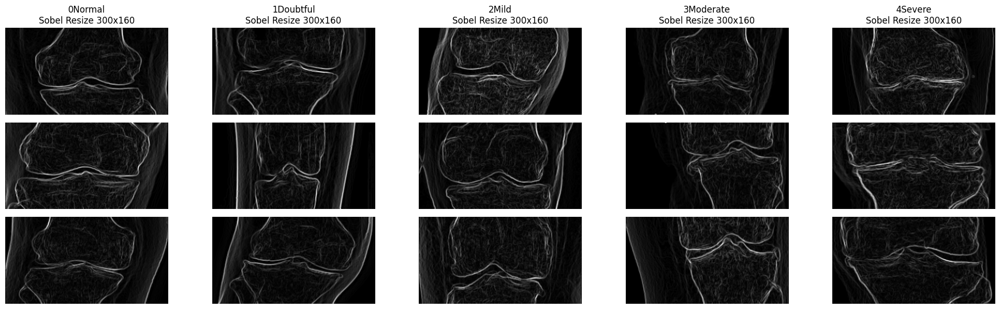

In [ ]:
import cv2

# Diccionario para las imágenes Sobel redimensionadas a 300x160
imagenes_sobel_resize = {
    '0Normal': [],
    '1Doubtful': [],
    '2Mild': [],
    '3Moderate': [],
    '4Severe': []
}

for categoria in categories:
    for img_sobel in imagenes_bordes[categoria]:
        img_resized = cv2.resize(img_sobel, (300, 160), interpolation=cv2.INTER_AREA)
        imagenes_sobel_resize[categoria].append(img_resized)


# Visualización de las 3 primeras imágenes redimensionadas con Sobel por categoría
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))

for clase_idx, categoria in enumerate(categories):
    for img_idx in range(3):
        imagen_resize = imagenes_sobel_resize[categoria][img_idx]

        plt.subplot(3, 5, img_idx * 5 + clase_idx + 1)
        plt.imshow(imagen_resize, cmap='gray')
        if img_idx == 0:
            plt.title(f'{categoria}\nSobel Resize 300x160')
        plt.axis('off')

plt.tight_layout()
plt.show()



Se realiza la resta entre la imagen original y la imagen procesada con Sobel para resaltar estructuras importantes (como bordes) y reducir detalles menos relevantes, lo que mejora el enfoque del análisis en patrones que pueden ser utiles para detectar la osteoartritis.

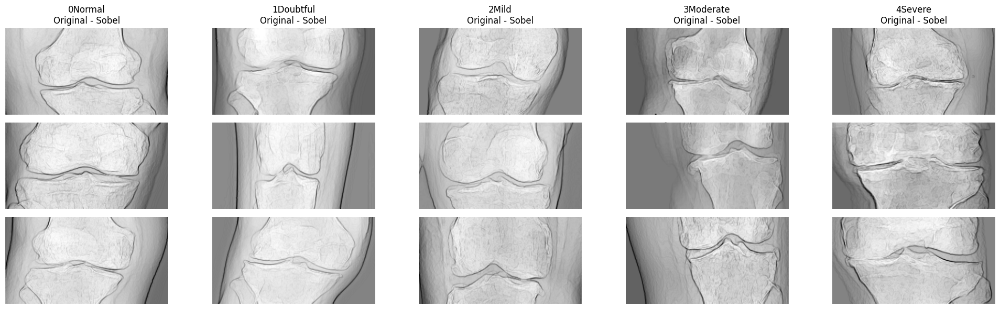

In [ ]:
import cv2
import numpy as np

# Diccionario para guardar imágenes originales redimensionadas
imagenes_normalizadas_resize = {
    '0Normal': [],
    '1Doubtful': [],
    '2Mild': [],
    '3Moderate': [],
    '4Severe': []
}

# Redimensionar imágenes normalizadas a 300x160
for categoria in categories:
    for img_norm in imagenes_normalizadas[categoria]:
        img_resize = cv2.resize(img_norm, (300, 160), interpolation=cv2.INTER_AREA)
        imagenes_normalizadas_resize[categoria].append(img_resize)

# Diccionario para la resta
imagenes_resta = {
    '0Normal': [],
    '1Doubtful': [],
    '2Mild': [],
    '3Moderate': [],
    '4Severe': []
}

# Hacer la resta (imagen original redimensionada - imagen Sobel redimensionada)
for categoria in categories:
    for i in range(len(imagenes_normalizadas_resize[categoria])):
        img_orig_resized = imagenes_normalizadas_resize[categoria][i]
        img_sobel_resized = imagenes_sobel_resize[categoria][i]

        # Asegurarse que ambas estén en float32 y rango [0,1]
        img_orig_resized = img_orig_resized.astype(np.float32)
        img_sobel_resized = img_sobel_resized.astype(np.float32)

        resta = img_orig_resized - img_sobel_resized

        # Opcional: normalizar la resta para visualizar o usar en modelo
        resta_norm = (resta - resta.min()) / (resta.max() - resta.min() + 1e-8)

        imagenes_resta[categoria].append(resta_norm)

# Visualizar algunas imágenes resultantes de la resta
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
for clase_idx, categoria in enumerate(categories):
    for img_idx in range(3):
        plt.subplot(3, 5, img_idx * 5 + clase_idx + 1)
        plt.imshow(imagenes_resta[categoria][img_idx], cmap='gray')
        if img_idx == 0:
            plt.title(f'{categoria}\nOriginal - Sobel')
        plt.axis('off')
plt.tight_layout()
plt.show()


Se realiza el recorte para centrarse específicamente en la región de la interlínea articular de la rodilla, ya que esta zona proporciona información crítica sobre el estado de la articulación y la presencia o severidad de osteoartritis, eliminando al mismo tiempo información irrelevante y mejorando la calidad del análisis posterior.


La interlínea articular (espacio entre fémur y tibia) es una de las principales áreas donde se manifiestan los signos de la osteoartritis, como:

- Reducción del espacio articular.

- Deformaciones óseas.

- Formación de osteofitos.

El recorte permite aislar esta región, eliminando partes irrelevantes (tejidos blandos, márgenes, fondo).

In [ ]:
# Inicializar diccionario para almacenar imágenes recortadas
imagenes_resta_recortadas = {categoria: [] for categoria in categories}

for categoria in categories:
    for img in imagenes_resta[categoria]:
        # Escalar y convertir a uint8
        img_uint8 = (img * 255).astype(np.uint8)

        # Convertir a escala de grises si tiene 3 canales
        if len(img_uint8.shape) == 3 and img_uint8.shape[2] == 3:
            img_gray = cv2.cvtColor(img_uint8, cv2.COLOR_BGR2GRAY)
        else:
            img_gray = img_uint8

        # 1. Umbral automático con OTSU
        _, thresh = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

        # 2. Contornos
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if contours:
            # 3. Contorno más grande
            largest_contour = max(contours, key=cv2.contourArea)
            x, y, w, h = cv2.boundingRect(largest_contour)

            # 4. Recorte sobre la imagen escalada (uint8)
            recorte = img_uint8[y:y+h, x:x+w]
        else:
            recorte = img_uint8

        imagenes_resta_recortadas[categoria].append(recorte)


In [ ]:
# Verificar dimensiones
dimensiones = set()

for categoria in imagenes_resta_recortadas:
    for img in imagenes_resta_recortadas[categoria]:
        dimensiones.add(img.shape)

# Mostrar resultados
if len(dimensiones) == 1:
    print(f" Todas las imágenes tienen la misma dimensión: {dimensiones.pop()}")
else:
    print(f" Las imágenes tienen diferentes dimensiones")



 Las imágenes tienen diferentes dimensiones


In [ ]:
import cv2

# Diccionario para guardar imágenes redimensionadas
imagenes_resta_recortadas_resize = {
    '0Normal': [],
    '1Doubtful': [],
    '2Mild': [],
    '3Moderate': [],
    '4Severe': []
}

# Redimensionar cada imagen de cada categoría
for categoria in imagenes_resta_recortadas:
    for img in imagenes_resta_recortadas[categoria]:
        img_resized = cv2.resize(img, (300, 160), interpolation=cv2.INTER_AREA)
        imagenes_resta_recortadas_resize[categoria].append(img_resized)

print(" Todas las imágenes fueron redimensionadas a 300x160.")


 Todas las imágenes fueron redimensionadas a 300x160.


Una vez recortadas las regiones de interés (interlínea articular), es fundamental que todas las imágenes tengan el mismo tamaño para garantizar la coherencia del análisis. Redimensionarlas a 300 píxeles de ancho por 160 de alto tiene varias finalidades:

- Los algoritmos de aprendizaje automático requieren que todas las muestras tengan la misma forma.

- Dimensiones inconsistentes podrían provocar errores durante el entrenamiento o afectar el rendimiento del modelo.

- Las características extraídas (por ejemplo, texturas, bordes, gradientes) provienen de la misma escala.

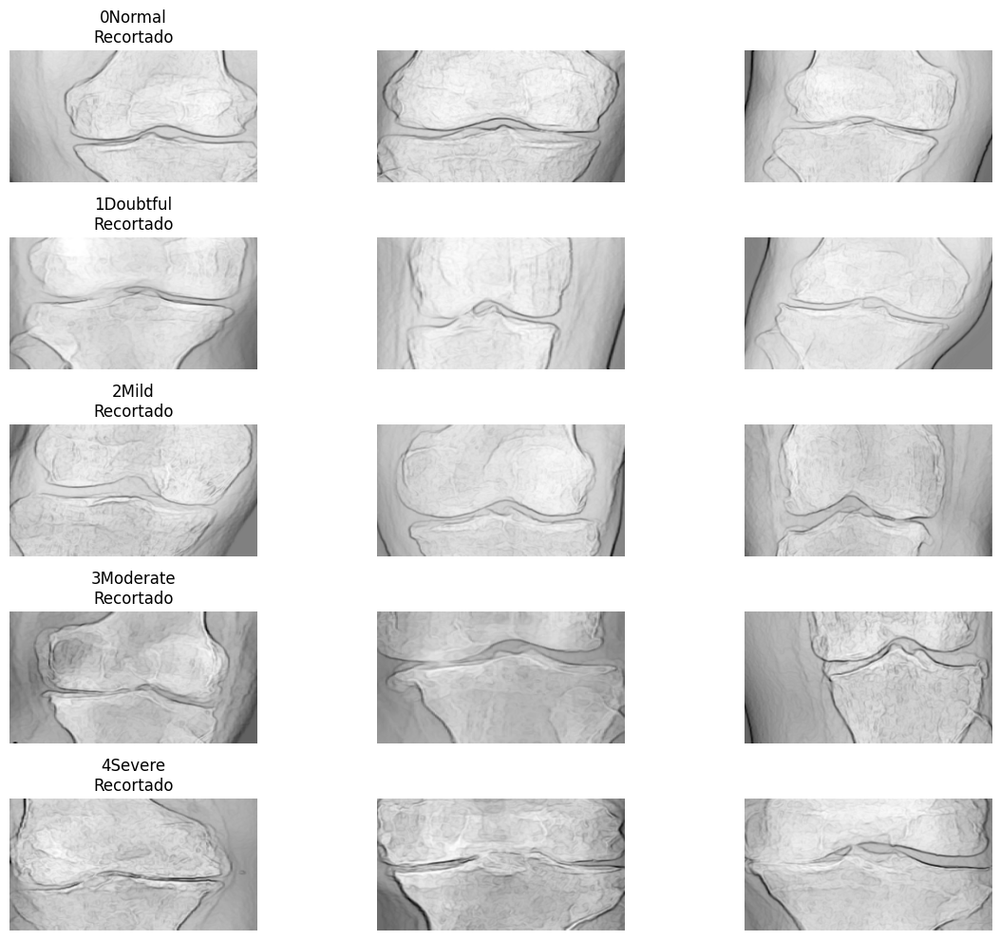

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))

for clase_idx, categoria in enumerate(categories):
    for img_idx in range(3):
        plt.subplot(5, 3, clase_idx * 3 + img_idx + 1)
        plt.imshow(imagenes_resta_recortadas_resize[categoria][img_idx], cmap='gray')
        if img_idx == 0:
            plt.title(f'{categoria}\nRecortado')
        plt.axis('off')

plt.tight_layout()
plt.show()


# Características:

### - Feature engineering

Una vez obtenidas las imágenes normalizadas de la región de interés (interlínea articular), se aplicaron técnicas de extracción de características como LBP y HOG para representar la textura y los bordes de forma robusta.
La combinación permite representar de forma más rica y discriminativa las características visuales que cambian con el progreso de la enfermedad,  ya que LBP se enfoca en texturas y HOG se enfoca en la estructura global y forma.

In [ ]:
from skimage.feature import hog, local_binary_pattern
import numpy as np
import pandas as pd

# Parámetros LBP
radius = 4
n_points = 8 * radius
METHOD = 'ror'

X_features = []
y_labels = []

for categoria in categories:
    for img in imagenes_resta_recortadas_resize[categoria]:
        # Convertir a float32
        img = np.array(img, dtype=np.float32)

        # Forzar a 2D escala de grises si tiene 3 canales
        if img.ndim == 3:
            if img.shape[2] == 1:
                img = img[:, :, 0]
            elif img.shape[2] == 3:
                img = np.dot(img[..., :3], [0.2989, 0.5870, 0.1140])  # RGB a gris
            else:
                raise ValueError(f"Forma inesperada: {img.shape}")

        # Verificación final
        if img.ndim != 2:
            raise ValueError(f"Imagen aún no es 2D: {img.shape}")

        # HOG
        hog_feat = hog(img,
                       orientations=9,
                       pixels_per_cell=(16, 16),
                       cells_per_block=(1, 1),
                       block_norm='L2-Hys',
                       visualize=False,
                       feature_vector=True)

        # LBP
        lbp = local_binary_pattern(img, n_points, radius, METHOD)
        hist, _ = np.histogram(lbp.ravel(),
                               bins=np.arange(0, n_points + 3),
                               range=(0, n_points + 2))
        hist = hist.astype("float")
        hist /= (hist.sum() + 1e-6)

        combined = np.concatenate([hog_feat, hist])
        X_features.append(combined)
        y_labels.append(categoria)

# Convertir a DataFrame
X_df = pd.DataFrame(X_features)
y_df = pd.Series(y_labels, name='label')
df_total = pd.concat([X_df, y_df], axis=1)

print(f"Total de muestras: {len(df_total)}")
print(f"Dimensiones del vector de características: {X_df.shape[1]}")
df_total.head()


/usr/local/lib/python3.11/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


Total de muestras: 500
Dimensiones del vector de características: 1654


,0,1,2,3,4,5,6,7,8,9,...,1645,1646,1647,1648,1649,1650,1651,1652,1653,label
0,0.398584,0.361982,0.202025,0.111899,0.367291,0.250421,0.376050,0.398584,0.398584,0.430117,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0Normal
1,0.387307,0.387307,0.263935,0.088020,0.322538,0.261776,0.387307,0.387307,0.387307,0.357028,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0Normal
2,0.807593,0.145049,0.007083,0.000000,0.006635,0.001484,0.007506,0.024070,0.570983,0.517893,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0Normal
3,0.397168,0.273533,0.127391,0.036358,0.396630,0.345462,0.397168,0.397168,0.397168,0.419677,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0Normal
4,0.529524,0.169315,0.010392,0.039795,0.077155,0.047672,0.346741,0.529524,0.529524,0.438204,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0Normal


/usr/local/lib/python3.11/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


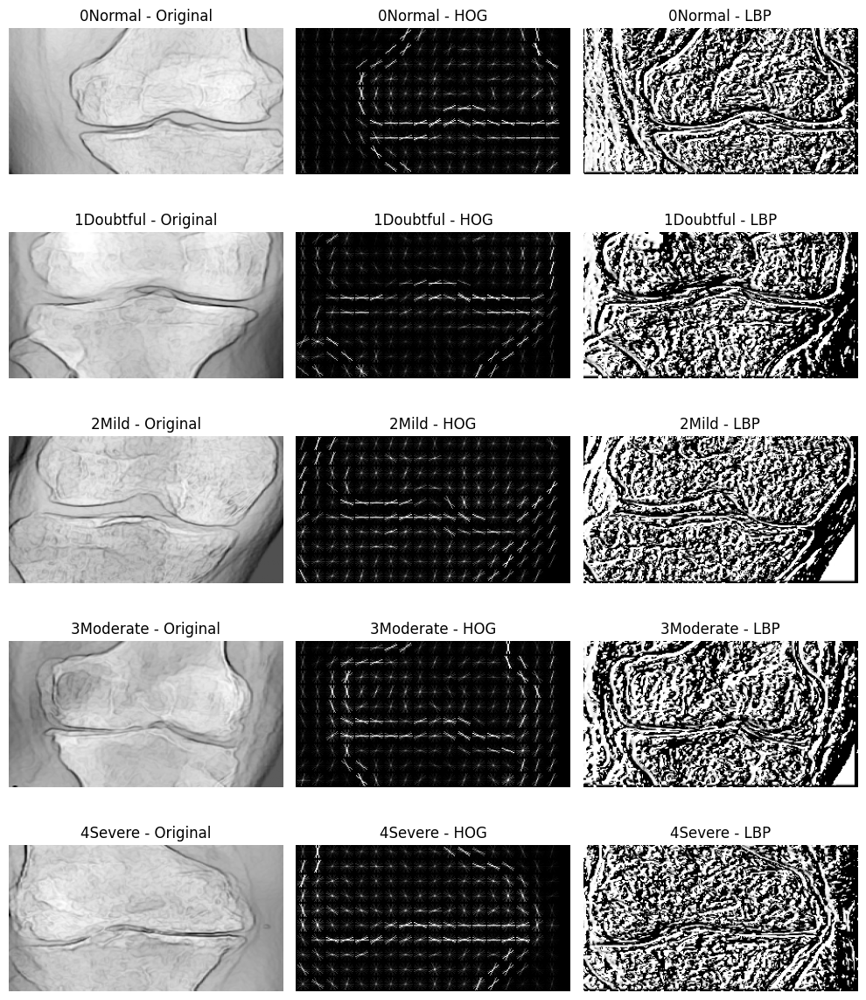

In [ ]:
import matplotlib.pyplot as plt
from skimage import exposure

# Visualización de resultados para una imagen por clase
fig, axes = plt.subplots(len(categories), 3, figsize=(10, 12))

for i, categoria in enumerate(categories):
    img = np.array(imagenes_resta_recortadas_resize[categoria][0], dtype=np.float32)

    # Convertir a escala de grises si es necesario
    if img.ndim == 3:
        if img.shape[2] == 1:
            img = img[:, :, 0]
        elif img.shape[2] == 3:
            img = np.dot(img[..., :3], [0.2989, 0.5870, 0.1140])
        else:
            raise ValueError(f"Forma inesperada: {img.shape}")

    # HOG con visualización
    hog_feat, hog_image = hog(img,
                              orientations=9,
                              pixels_per_cell=(16, 16),
                              cells_per_block=(1, 1),
                              block_norm='L2-Hys',
                              visualize=True,
                              feature_vector=True)
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    # LBP
    lbp = local_binary_pattern(img, n_points, radius, METHOD)

    # Mostrar Original
    axes[i, 0].imshow(img, cmap='gray')
    axes[i, 0].set_title(f"{categoria} - Original")
    axes[i, 0].axis('off')

    # Mostrar HOG
    axes[i, 1].imshow(hog_image_rescaled, cmap='gray')
    axes[i, 1].set_title(f"{categoria} - HOG")
    axes[i, 1].axis('off')

    # Mostrar LBP
    axes[i, 2].imshow(lbp, cmap='gray')
    axes[i, 2].set_title(f"{categoria} - LBP")
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()


### - Filter method

Antes de realizar una prueba parametrica, se decidió usar la prueba de normalidad Kolmogorov para poder decidir si usaremos pruebas parametricas o pruebas no parametricas.

Se tomo la decision de usar Kolmogorov ya que en nuestro caso se superaban las 50 muestras.

In [ ]:
from scipy import stats
import numpy as np
import pandas as pd

# Separar características y etiquetas
X_df = df_total.drop(columns=['label'])
y_df = df_total['label']

# Diccionario para guardar si la clase es normal o no
normalidad_por_clase = {}

# Analizar por cada clase
for clase in y_df.unique():
    X_clase = X_df[y_df == clase]
    resultados = []

    for col in X_clase.columns:
        data = X_clase[col].dropna()
        if data.std(ddof=1) == 0:
            # Si la desviación estándar es cero, no se puede estandarizar ni hacer prueba
            resultados.append(False)
            continue

        # Z-normalización
        standardized = (data - data.mean()) / data.std(ddof=1)
        stat, p_value = stats.kstest(standardized, 'norm')

        resultados.append(p_value > 0.05)  # True si se acepta normalidad

    # Consideramos normal si más del 50% de las características lo son
    es_normal = np.mean(resultados) > 0.5
    normalidad_por_clase[clase] = es_normal

# Mostrar resultados
for clase, es_normal in normalidad_por_clase.items():
    estado = "Distribución normal" if es_normal else "Distribución no normal"
    print(f"Clase {clase}: {estado}")


Clase 0Normal: Distribución no normal
Clase 1Doubtful: Distribución no normal
Clase 2Mild: Distribución no normal
Clase 3Moderate: Distribución no normal
Clase 4Severe: Distribución no normal


Luego de ver que ninguna de las clases sigue una distribución normal, aplicamos la prueba NO parametrica: Kruskal-Wallis que funciona como un ANOVA pero para distribuciones NO normales.

In [ ]:
from scipy import stats
import numpy as np
import pandas as pd

# Suponiendo que df_total ya está definido y contiene las características + columna 'label'
X_df = df_total.drop(columns=['label'])
y_df = df_total['label']

# Dividir los datos por clase para Kruskal
data_by_class = [X_df[y_df == clase] for clase in y_df.unique()]

kruskal_results_stat = []
kruskal_results_pvalue = []
features_validas = []

for feature in X_df.columns:
    feature_values = [grupo[feature].values for grupo in data_by_class]

    # Validar que no todos los valores sean idénticos (evitar error en Kruskal)
    todos_valores = np.concatenate(feature_values)
    if np.all(todos_valores == todos_valores[0]):
        continue  # saltar esta característica

    try:
        stat, pvalue = stats.kruskal(*feature_values)
        kruskal_results_stat.append(stat)
        kruskal_results_pvalue.append(pvalue)
        features_validas.append(feature)
    except ValueError as e:
        print(f"Error en la característica {feature}: {e}")
        continue

# Crear DataFrame con resultados de Kruskal
kruskal_df = pd.DataFrame({
    'Feature': features_validas,
    'Statistic': kruskal_results_stat,
    'P-value': kruskal_results_pvalue
})

print(kruskal_df.head())
print(f"\nCaracterísticas con diferencias significativas (p < 0.05): {(kruskal_df['P-value'] < 0.05).sum()} / {len(kruskal_df)}")

# Filtrar características significativas
features_significativas = kruskal_df.loc[kruskal_df['P-value'] < 0.05, 'Feature'].tolist()

# Crear DataFrame con características filtradas + etiqueta
df_filtrado = df_total[features_significativas + ['label']].copy()

print(f"DataFrame filtrado listo para SFFS con {df_filtrado.shape[1]-1} características y {df_filtrado.shape[0]} muestras.")
print(df_filtrado.head())


   Feature  Statistic   P-value
0        0  28.251336  0.000011
1        1   4.965610  0.290844
2        2  20.337645  0.000428
3        3  28.318888  0.000011
4        4  18.898289  0.000823

Características con diferencias significativas (p < 0.05): 880 / 1621
DataFrame filtrado listo para SFFS con 880 características y 500 muestras.
          0         2         3         4         5         7         8  \
0  0.398584  0.202025  0.111899  0.367291  0.250421  0.398584  0.398584   
1  0.387307  0.263935  0.088020  0.322538  0.261776  0.387307  0.387307   
2  0.807593  0.007083  0.000000  0.006635  0.001484  0.024070  0.570983   
3  0.397168  0.127391  0.036358  0.396630  0.345462  0.397168  0.397168   
4  0.529524  0.010392  0.039795  0.077155  0.047672  0.529524  0.529524   

          9        11        12  ...      1606      1607      1609      1610  \
0  0.430117  0.277076  0.266610  ...  0.322451  0.391011  0.191526  0.207291   
1  0.357028  0.357028  0.353305  ...  0.166599  0.1

Se aplico Kruskal-Wallis con el fin de evaluar si al menos uno de los grupos difiere significativamente de los otros en términos de la variable estudiada, sin asumir que los datos siguen una distribución normal.

Como resultado de este filtrado, el número de características se redujo de 1621 a 844, lo que representa una reducción significativa en la dimensionalidad del conjunto de datos. Esta selección contribuye a simplificar el modelo, mejorar su interpretabilidad y reducir el riesgo de sobreajuste, al tiempo que mantiene las variables más informativas para distinguir entre los grupos estudiados.

### -Wrapper method
El objetivo es identificar un subconjunto óptimo de variables que maximicen el rendimiento del modelo, evitando la redundancia y el ruido, y reduciendo la complejidad computacional.
SFFS permite agregar y eliminar características de manera dinámica en cada iteración, lo que ayuda a evitar quedarse atrapado en óptimos locales subóptimos.

Para nuestro proyecto decidimos buscar la mejor combinacion de 100 caracteristicas de las 844 caracteristicas que obtuvimos anteriormente.

In [ ]:
pip install mlxtend

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
import numpy as np
import joblib
import os

# Suponemos que df_filtrado ya existe y contiene las características filtradas + 'label'

# 1. Preparar datos desde df_filtrado
X = df_filtrado.drop(columns=['label']).values
y = df_filtrado['label'].values

print(f"Datos listos para SFFS: {X.shape[0]} muestras, {X.shape[1]} características")

# 2. Dividir datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# 3. Clasificador
clf = SVC(kernel='linear', random_state=42)

# 4. Configurar SFFS
max_features = min(100, X_train.shape[1])

sffs = SFS(
    clf,
    k_features=max_features,
    forward=True,
    floating=True,
    scoring='accuracy',
    cv=3,
    n_jobs=-1,
    verbose=2
)

print(f"Ejecutando SFFS con límite de {max_features} características...")

# 5. Ajustar SFFS
sffs = sffs.fit(X_train, y_train)

print(f"Mejor subconjunto de características índices: {sffs.k_feature_idx_}")
print(f"Exactitud con características seleccionadas (CV): {sffs.k_score_:.4f}")

# 6. Obtener nombres de columnas seleccionadas
cols_all = df_filtrado.drop(columns=['label']).columns
cols_seleccionadas = [cols_all[i] for i in sffs.k_feature_idx_]

# 7. Crear DataFrame final con las características seleccionadas + etiqueta
df_sffs = df_filtrado[cols_seleccionadas].copy()
df_sffs['label'] = df_filtrado['label']

print(f"DataFrame tras SFFS con {df_sffs.shape[1]-1} características seleccionadas:")
print(df_sffs.head())

# 8. Guardar resultados
output_dir = "./SFFS_results"
os.makedirs(output_dir, exist_ok=True)

np.save(os.path.join(output_dir, "selected_features_idx.npy"), np.array(sffs.k_feature_idx_))
joblib.dump(sffs, os.path.join(output_dir, "sffs_selector.joblib"))

print(" SFFS completado y guardado localmente.")


Datos listos para SFFS: 500 muestras, 880 características
Ejecutando SFFS con límite de 100 características...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done 880 out of 880 | elapsed:   15.1s finished

[2025-07-12 22:30:24] Features: 1/100 -- score: 0.27997231885684354[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 879 out of 879 | elapsed:   10.7s finished

[2025-07-12 22:30:35] Features: 2/100 -- score: 0.34242322223469124[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 878 out of 878 | elapsed:   10.8s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    0.0s finished

[2025-07-12 22:30:46] Features: 3/100 -- score: 0.37996109677178014[Parallel(n_jobs=-1)]:

Mejor subconjunto de características índices: (6, 13, 17, 28, 33, 35, 37, 40, 41, 43, 44, 46, 47, 52, 56, 62, 64, 75, 81, 85, 106, 107, 109, 115, 119, 120, 124, 125, 126, 128, 129, 131, 135, 138, 141, 142, 163, 164, 177, 190, 191, 192, 196, 197, 201, 202, 203, 221, 227, 259, 264, 272, 273, 274, 275, 277, 281, 284, 313, 355, 373, 398, 416, 445, 465, 468, 544, 546, 556, 559, 584, 591, 592, 595, 597, 617, 632, 666, 669, 673, 686, 687, 713, 714, 731, 752, 753, 754, 755, 758, 759, 761, 816, 821, 831, 832, 833, 834, 835, 879)
Exactitud con características seleccionadas (CV): 0.5900
DataFrame tras SFFS con 100 características seleccionadas:
          8        21        26        45        51        54        57  \
0  0.398584  0.135374  0.538658  0.436389  0.097722  0.351559  0.351559   
1  0.387307  0.277477  0.083632  0.333333  0.333333  0.293281  0.357605   
2  0.570983  0.103419  0.473180  0.656719  0.031491  0.333333  0.333333   
3  0.397168  0.280566  0.169501  0.335725  0.335725  0.510

[Parallel(n_jobs=-1)]: Done  99 out of  99 | elapsed:    1.9s finished

[2025-07-12 23:07:06] Features: 100/100 -- score: 0.5899637152582949

In [ ]:
df_sffs.head()


,8,21,26,45,51,54,57,60,61,74,...,1405,1503,1512,1528,1529,1539,1548,1549,1620,label
0,0.398584,0.135374,0.538658,0.436389,0.097722,0.351559,0.351559,0.351559,0.294298,0.492070,...,0.284007,0.402603,0.129390,0.546139,0.207390,0.333333,0.342577,0.342577,1.0,0Normal
1,0.387307,0.277477,0.083632,0.333333,0.333333,0.293281,0.357605,0.357605,0.357605,0.352352,...,0.371884,0.344328,0.339182,0.398064,0.398064,0.364915,0.337722,0.337722,1.0,0Normal
2,0.570983,0.103419,0.473180,0.656719,0.031491,0.333333,0.333333,0.333333,0.333333,0.333333,...,0.491191,0.370439,0.336759,0.333333,0.333333,0.333578,0.351460,0.351460,1.0,0Normal
3,0.397168,0.280566,0.169501,0.335725,0.335725,0.510261,0.174437,0.353602,0.232586,0.339936,...,0.405032,0.697989,0.596037,0.567461,0.567461,0.333333,0.580988,0.580988,1.0,0Normal
4,0.529524,0.352180,0.230197,0.534842,0.107354,0.349632,0.349632,0.292670,0.349632,0.253489,...,0.362309,0.340283,0.339272,0.348984,0.348984,0.342004,0.368447,0.368447,1.0,0Normal


### - Feature extraction


In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import pandas as pd
import numpy as np

# 1. Separar características y etiquetas
X = df_sffs.drop(columns=['label']).values
y = df_sffs['label'].values

# 2. Escalar características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Aplicar LDA con 4 componentes
lda = LinearDiscriminantAnalysis(n_components=4)
X_lda = lda.fit_transform(X_scaled, y)

# 4. Crear DataFrame con resultados de LDA
df_lda = pd.DataFrame(X_lda, columns=['LD1', 'LD2', 'LD3', 'LD4'])
df_lda['label'] = y

# 5. Mostrar resumen
print(f"Dimensiones originales (SFFS): {X.shape}")
print(f"Dimensiones reducidas (LDA): {X_lda.shape}")
print("Primeras filas del DataFrame resultante con LDA:")
df_lda.head()


Dimensiones originales (SFFS): (500, 100)
Dimensiones reducidas (LDA): (500, 4)
Primeras filas del DataFrame resultante con LDA:


,LD1,LD2,LD3,LD4,label
0,2.007409,0.363117,-0.091473,1.508504,0Normal
1,-0.632312,0.835206,-0.509567,-0.286034,0Normal
2,-0.308714,-0.461143,1.676290,0.474063,0Normal
3,-2.699546,0.921729,0.287468,-0.979392,0Normal
4,-2.882535,-0.098670,-0.009623,-0.538632,0Normal


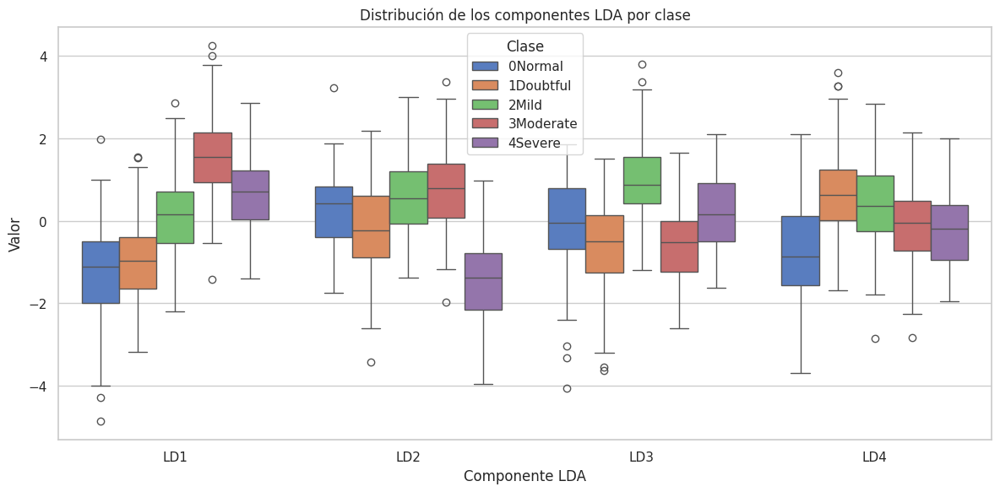

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Asumimos que tu DataFrame LDA se llama df_lda y tiene las columnas: LD1, LD2, LD3, LD4, label

# Convertir a formato largo para seaborn
df_lda_melt = df_lda.melt(id_vars='label', var_name='Componente LDA', value_name='Valor')

# Graficar boxplots
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_lda_melt, x='Componente LDA', y='Valor', hue='label')
plt.title('Distribución de los componentes LDA por clase')
plt.legend(title='Clase')
plt.tight_layout()
plt.show()


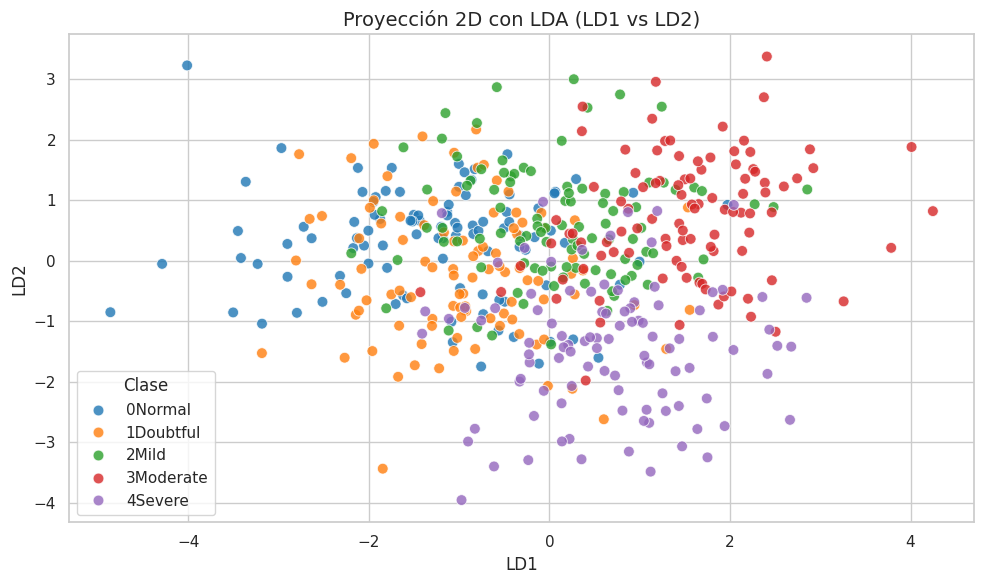

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Estilo de gráficos
sns.set(style="whitegrid", palette="muted")

# Tamaño del gráfico
plt.figure(figsize=(10, 6))

# Mapa de colores por clase
sns.scatterplot(
    x='LD1', y='LD2',
    hue='label',
    palette='tab10',  # Puedes cambiar a "Set1", "husl", etc. si prefieres
    data=df_lda,
    alpha=0.8,
    s=60
)

plt.title("Proyección 2D con LDA (LD1 vs LD2)", fontsize=14)
plt.xlabel("LD1")
plt.ylabel("LD2")
plt.legend(title="Clase")
plt.tight_layout()
plt.show()


<ipython-input-116-8eab20381746>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', len(labels))


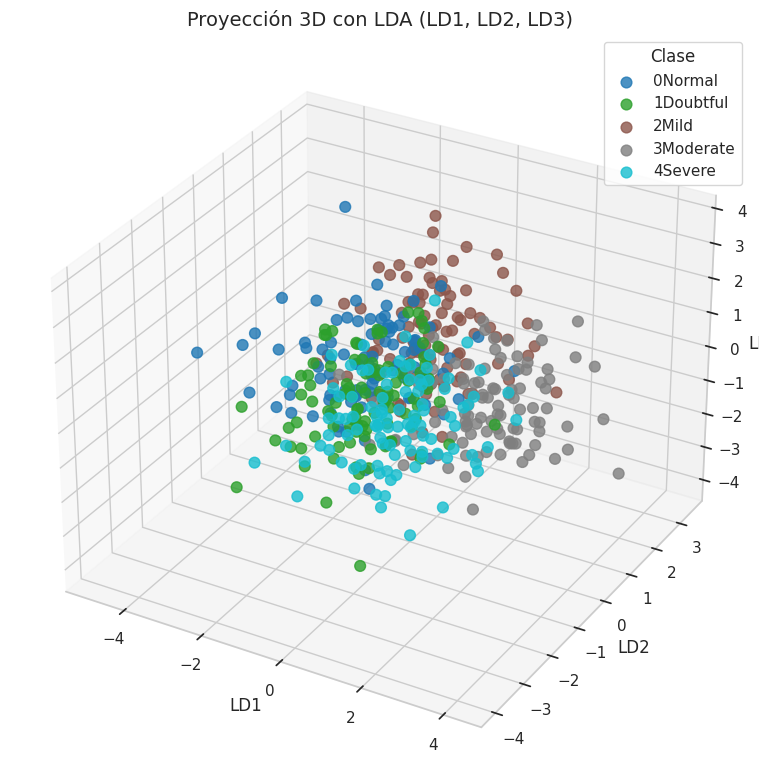

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Crear figura
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Convertir etiquetas a colores únicos
labels = df_lda['label'].unique()
colors = plt.cm.get_cmap('tab10', len(labels))

# Dibujar cada clase
for idx, label in enumerate(labels):
    subset = df_lda[df_lda['label'] == label]
    ax.scatter(
        subset['LD1'],
        subset['LD2'],
        subset['LD3'],
        label=str(label),
        color=colors(idx),
        s=60,
        alpha=0.8
    )

# Etiquetas
ax.set_title('Proyección 3D con LDA (LD1, LD2, LD3)', fontsize=14)
ax.set_xlabel('LD1')
ax.set_ylabel('LD2')
ax.set_zlabel('LD3')
ax.legend(title="Clase")

plt.tight_layout()
plt.show()


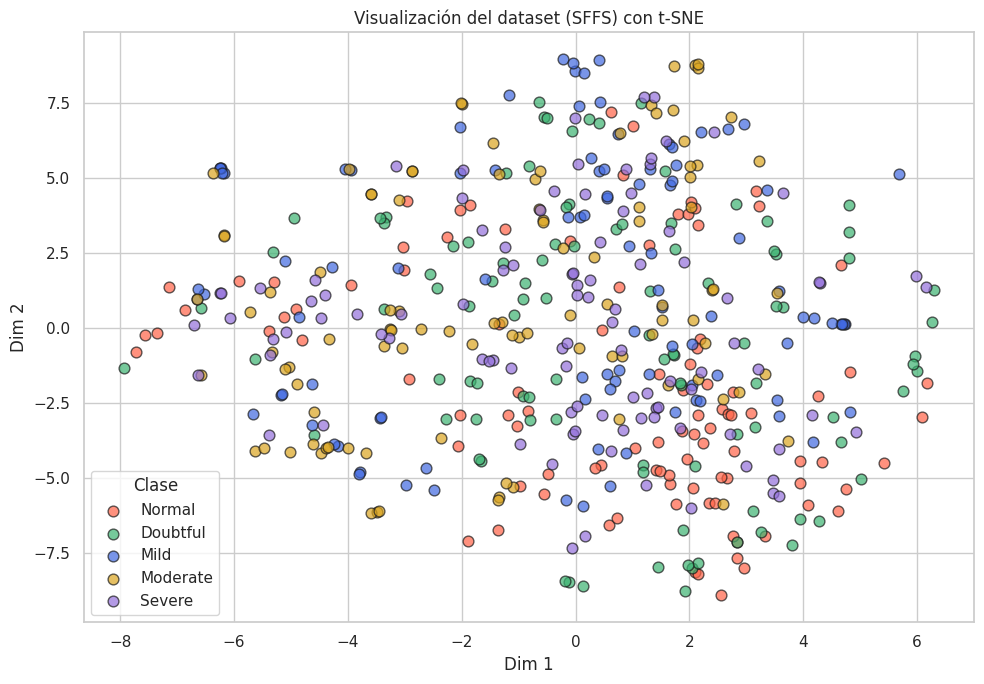

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# 1. Separar características y etiquetas
X_sffs = df_sffs.drop(columns=['label']).values
y_sffs = df_sffs['label'].values

# 2. Aplicar t-SNE
tsne = TSNE(n_components=2, perplexity=100, learning_rate=100, random_state=42)
X_tsne = tsne.fit_transform(X_sffs)

# 3. Visualización
plt.figure(figsize=(10, 7))
labels_unicos = sorted(np.unique(y_sffs))
colores = ['tomato', 'mediumseagreen', 'royalblue', 'goldenrod', 'mediumpurple']
nombres_clases = ['Normal', 'Doubtful', 'Mild', 'Moderate', 'Severe']

for label, color, name in zip(labels_unicos, colores, nombres_clases):
    plt.scatter(X_tsne[y_sffs == label, 0], X_tsne[y_sffs == label, 1],
                label=name, alpha=0.7, edgecolors='k', s=60, color=color)

plt.xlabel("Dim 1")
plt.ylabel("Dim 2")
plt.title("Visualización del dataset (SFFS) con t-SNE")
plt.legend(title="Clase")
plt.grid(True)
plt.tight_layout()
plt.show()


# Prueba sin LBP

In [ ]:
from skimage.feature import hog
import numpy as np
import pandas as pd

X_features = []
y_labels = []

for categoria in categories:
    for img in imagenes_resta_recortadas_resize[categoria]:
        # Convertir a float32
        img = np.array(img, dtype=np.float32)

        # Forzar a 2D escala de grises si tiene 3 canales
        if img.ndim == 3:
            if img.shape[2] == 1:
                img = img[:, :, 0]
            elif img.shape[2] == 3:
                img = np.dot(img[..., :3], [0.2989, 0.5870, 0.1140])  # RGB a gris
            else:
                raise ValueError(f"Forma inesperada: {img.shape}")

        # Verificación final
        if img.ndim != 2:
            raise ValueError(f"Imagen aún no es 2D: {img.shape}")

        # Extraer solo características HOG
        hog_feat = hog(img,
                       orientations=9,
                       pixels_per_cell=(16, 16),
                       cells_per_block=(1, 1),
                       block_norm='L2-Hys',
                       visualize=False,
                       feature_vector=True)

        X_features.append(hog_feat)
        y_labels.append(categoria)

# Convertir a DataFrame
X_df = pd.DataFrame(X_features)
y_df = pd.Series(y_labels, name='label')
df_total = pd.concat([X_df, y_df], axis=1)

print(f"Total de muestras: {len(df_total)}")
print(f"Dimensiones del vector de características (solo HOG): {X_df.shape[1]}")
df_total.head()


Total de muestras: 500
Dimensiones del vector de características (solo HOG): 1620


,0,1,2,3,4,5,6,7,8,9,...,1611,1612,1613,1614,1615,1616,1617,1618,1619,label
0,0.398584,0.361982,0.202025,0.111899,0.367291,0.250421,0.376050,0.398584,0.398584,0.430117,...,0.432509,0.432509,0.432509,0.432509,0.300863,0.239710,0.230161,0.118066,0.191964,0Normal
1,0.387307,0.387307,0.263935,0.088020,0.322538,0.261776,0.387307,0.387307,0.387307,0.357028,...,0.528612,0.528612,0.487180,0.184771,0.081468,0.040178,0.118790,0.259764,0.282516,0Normal
2,0.807593,0.145049,0.007083,0.000000,0.006635,0.001484,0.007506,0.024070,0.570983,0.517893,...,0.703388,0.703388,0.062380,0.007763,0.011847,0.008985,0.010606,0.011980,0.077857,0Normal
3,0.397168,0.273533,0.127391,0.036358,0.396630,0.345462,0.397168,0.397168,0.397168,0.419677,...,0.349715,0.319827,0.319031,0.249254,0.349715,0.349715,0.349715,0.349715,0.349715,0Normal
4,0.529524,0.169315,0.010392,0.039795,0.077155,0.047672,0.346741,0.529524,0.529524,0.438204,...,0.407769,0.407769,0.243261,0.232003,0.183964,0.147570,0.407769,0.407769,0.407769,0Normal


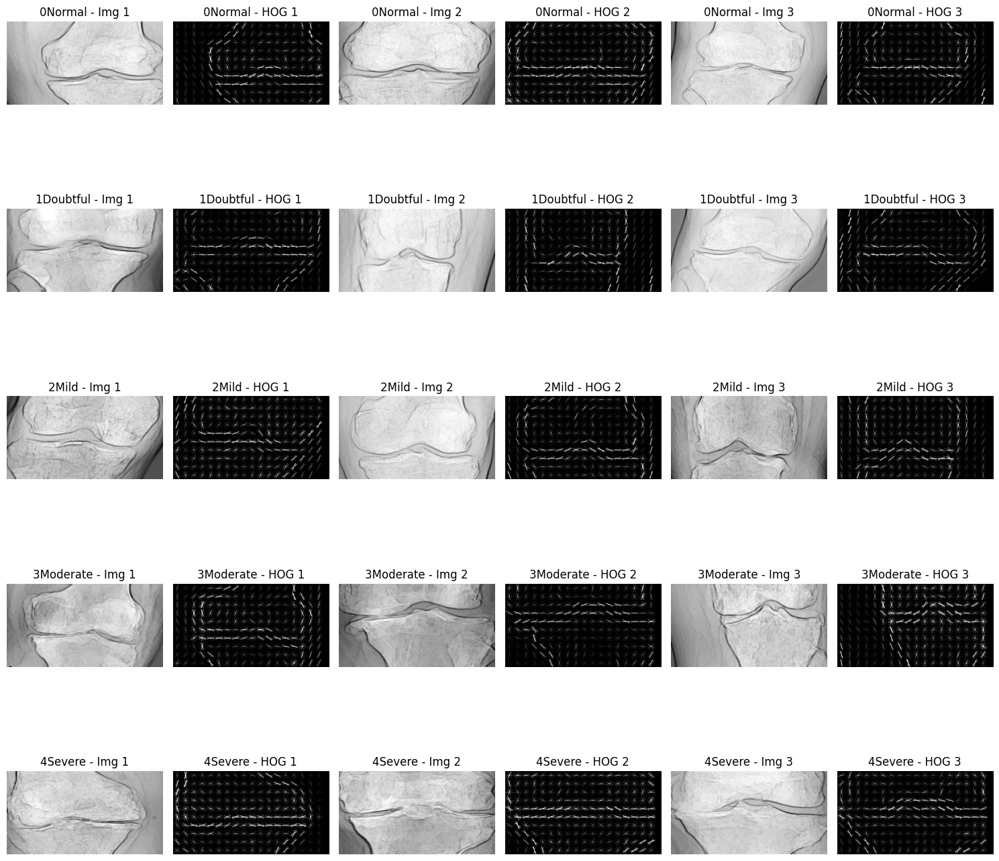

In [ ]:
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure
import numpy as np

# Visualizar las 3 primeras imágenes con su correspondiente HOG por clase
fig, axes = plt.subplots(len(categories), 6, figsize=(15, 3 * len(categories)))

for i, categoria in enumerate(categories):
    for j in range(3):
        img = np.array(imagenes_resta_recortadas_resize[categoria][j], dtype=np.float32)

        # Convertir a escala de grises si tiene 3 canales
        if img.ndim == 3:
            if img.shape[2] == 1:
                img = img[:, :, 0]
            elif img.shape[2] == 3:
                img = np.dot(img[..., :3], [0.2989, 0.5870, 0.1140])
            else:
                raise ValueError(f"Forma inesperada: {img.shape}")

        # Calcular HOG y su imagen
        hog_feat, hog_image = hog(img,
                                  orientations=9,
                                  pixels_per_cell=(16, 16),
                                  cells_per_block=(1, 1),
                                  block_norm='L2-Hys',
                                  visualize=True,
                                  feature_vector=True)

        hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

        # Mostrar imagen original
        ax_orig = axes[i, j * 2]
        ax_orig.imshow(img, cmap='gray')
        ax_orig.set_title(f"{categoria} - Img {j+1}")
        ax_orig.axis('off')

        # Mostrar HOG
        ax_hog = axes[i, j * 2 + 1]
        ax_hog.imshow(hog_image_rescaled, cmap='gray')
        ax_hog.set_title(f"{categoria} - HOG {j+1}")
        ax_hog.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
from scipy import stats
import numpy as np
import pandas as pd

# Separar características y etiquetas
X_df = df_total.drop(columns=['label'])
y_df = df_total['label']

# Diccionario para guardar si la clase es normal o no
normalidad_por_clase = {}

# Analizar por cada clase
for clase in y_df.unique():
    X_clase = X_df[y_df == clase]
    resultados = []

    for col in X_clase.columns:
        data = X_clase[col].dropna()
        if data.std(ddof=1) == 0:
            # Si la desviación estándar es cero, no se puede estandarizar ni hacer prueba
            resultados.append(False)
            continue

        # Z-normalización
        standardized = (data - data.mean()) / data.std(ddof=1)
        stat, p_value = stats.kstest(standardized, 'norm')

        resultados.append(p_value > 0.05)  # True si se acepta normalidad

    # Consideramos normal si más del 50% de las características lo son
    es_normal = np.mean(resultados) > 0.5
    normalidad_por_clase[clase] = es_normal

# Mostrar resultados
for clase, es_normal in normalidad_por_clase.items():
    estado = "Distribución normal" if es_normal else "Distribución no normal"
    print(f"Clase {clase}: {estado}")


Clase 0Normal: Distribución no normal
Clase 1Doubtful: Distribución no normal
Clase 2Mild: Distribución no normal
Clase 3Moderate: Distribución no normal
Clase 4Severe: Distribución no normal


In [ ]:
from scipy import stats
import numpy as np
import pandas as pd

# Suponiendo que df_total ya está definido y contiene las características + columna 'label'
X_df = df_total.drop(columns=['label'])
y_df = df_total['label']

# Dividir los datos por clase para Kruskal
data_by_class = [X_df[y_df == clase] for clase in y_df.unique()]

kruskal_results_stat = []
kruskal_results_pvalue = []
features_validas = []

for feature in X_df.columns:
    feature_values = [grupo[feature].values for grupo in data_by_class]

    # Validar que no todos los valores sean idénticos (evitar error en Kruskal)
    todos_valores = np.concatenate(feature_values)
    if np.all(todos_valores == todos_valores[0]):
        continue  # saltar esta característica

    try:
        stat, pvalue = stats.kruskal(*feature_values)
        kruskal_results_stat.append(stat)
        kruskal_results_pvalue.append(pvalue)
        features_validas.append(feature)
    except ValueError as e:
        print(f"Error en la característica {feature}: {e}")
        continue

# Crear DataFrame con resultados de Kruskal
kruskal_df = pd.DataFrame({
    'Feature': features_validas,
    'Statistic': kruskal_results_stat,
    'P-value': kruskal_results_pvalue
})

print(kruskal_df.head())
print(f"\nCaracterísticas con diferencias significativas (p < 0.05): {(kruskal_df['P-value'] < 0.05).sum()} / {len(kruskal_df)}")

# Filtrar características significativas
features_significativas = kruskal_df.loc[kruskal_df['P-value'] < 0.05, 'Feature'].tolist()

# Crear DataFrame con características filtradas + etiqueta
df_filtrado = df_total[features_significativas + ['label']].copy()

print(f"DataFrame filtrado listo para SFFS con {df_filtrado.shape[1]-1} características y {df_filtrado.shape[0]} muestras.")
print(df_filtrado.head())


   Feature  Statistic   P-value
0        0  28.251336  0.000011
1        1   4.965610  0.290844
2        2  20.337645  0.000428
3        3  28.318888  0.000011
4        4  18.898289  0.000823

Características con diferencias significativas (p < 0.05): 879 / 1620
DataFrame filtrado listo para SFFS con 879 características y 500 muestras.
          0         2         3         4         5         7         8  \
0  0.398584  0.202025  0.111899  0.367291  0.250421  0.398584  0.398584   
1  0.387307  0.263935  0.088020  0.322538  0.261776  0.387307  0.387307   
2  0.807593  0.007083  0.000000  0.006635  0.001484  0.024070  0.570983   
3  0.397168  0.127391  0.036358  0.396630  0.345462  0.397168  0.397168   
4  0.529524  0.010392  0.039795  0.077155  0.047672  0.529524  0.529524   

          9        11        12  ...      1605      1606      1607      1609  \
0  0.430117  0.277076  0.266610  ...  0.391011  0.322451  0.391011  0.191526   
1  0.357028  0.357028  0.353305  ...  0.335550  0.1

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
import numpy as np
import joblib
import os

# 1. Preparar datos desde df_filtrado
X = df_filtrado.drop(columns=['label']).values
y = df_filtrado['label'].values

print(f"Datos listos para SFFS: {X.shape[0]} muestras, {X.shape[1]} características")

# 2. Dividir datos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# 3. Clasificador
clf = SVC(kernel='linear', random_state=42)

# 4. Configurar SFFS
max_features = min(100, X_train.shape[1])

sffs = SFS(
    clf,
    k_features=max_features,
    forward=True,
    floating=True,
    scoring='accuracy',
    cv=3,
    n_jobs=-1,
    verbose=2
)

print(f"Ejecutando SFFS con límite de {max_features} características...")

# 5. Ajustar SFFS
sffs = sffs.fit(X_train, y_train)

print(f"Mejor subconjunto de características índices: {sffs.k_feature_idx_}")
print(f"Exactitud con características seleccionadas (CV): {sffs.k_score_:.4f}")

# 6. Obtener nombres de columnas seleccionadas
cols_all = df_filtrado.drop(columns=['label']).columns
cols_seleccionadas = [cols_all[i] for i in sffs.k_feature_idx_]

# 7. Crear DataFrame final con las características seleccionadas + etiqueta
df_sffs = df_filtrado[cols_seleccionadas].copy()
df_sffs['label'] = df_filtrado['label']

print(f"DataFrame tras SFFS con {df_sffs.shape[1]-1} características seleccionadas:")
print(df_sffs.head())

# 8. Guardar resultados
output_dir = "./SFFS_results"
os.makedirs(output_dir, exist_ok=True)

np.save(os.path.join(output_dir, "selected_features_idx.npy"), np.array(sffs.k_feature_idx_))
joblib.dump(sffs, os.path.join(output_dir, "sffs_selector.joblib"))

print("SFFS completado y guardado localmente.")


Datos listos para SFFS: 500 muestras, 879 características
Ejecutando SFFS con límite de 100 características...


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 879 out of 879 | elapsed:   11.8s finished

[2025-07-12 23:50:47] Features: 1/100 -- score: 0.27997231885684354[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 878 out of 878 | elapsed:   10.7s finished

[2025-07-12 23:50:58] Features: 2/100 -- score: 0.34242322223469124[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 877 out of 877 | elapsed:   11.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 out of   2 | elapsed:    0.0s finished

[2025-07-12 23:51:09] Features: 3/100 -- score: 0.37996109677178014[Parallel(n_jobs=-1)]:

Mejor subconjunto de características índices: (7, 24, 31, 32, 37, 42, 43, 44, 46, 47, 52, 53, 63, 64, 85, 93, 94, 114, 115, 117, 118, 119, 120, 126, 128, 129, 133, 135, 190, 191, 194, 195, 196, 197, 198, 200, 202, 203, 210, 242, 260, 262, 264, 266, 271, 272, 273, 296, 313, 344, 346, 372, 373, 374, 448, 469, 485, 507, 559, 565, 567, 568, 569, 572, 574, 575, 585, 595, 596, 600, 618, 671, 676, 678, 679, 682, 683, 685, 687, 694, 701, 713, 735, 748, 752, 753, 756, 759, 760, 766, 767, 783, 803, 821, 825, 831, 832, 833, 835, 846)
Exactitud con características seleccionadas (CV): 0.5674
DataFrame tras SFFS con 100 características seleccionadas:
          9        38        49        50        57        73        74  \
0  0.430117  0.372028  0.253646  0.171309  0.351559  0.492070  0.492070   
1  0.357028  0.335447  0.333333  0.333333  0.357605  0.352352  0.352352   
2  0.517893  0.490437  0.054717  0.012519  0.333333  0.333333  0.333333   
3  0.419677  0.343877  0.335725  0.335725  0.174437  0.

[Parallel(n_jobs=-1)]: Done  99 out of  99 | elapsed:    2.6s finished

[2025-07-13 00:26:03] Features: 100/100 -- score: 0.5674447312310628

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import pandas as pd
import numpy as np

# 1. Separar características y etiquetas
X = df_sffs.drop(columns=['label']).values
y = df_sffs['label'].values

# 2. Escalar características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Aplicar LDA con 4 componentes
lda = LinearDiscriminantAnalysis(n_components=4)
X_lda = lda.fit_transform(X_scaled, y)

# 4. Crear DataFrame con resultados de LDA
df_lda = pd.DataFrame(X_lda, columns=['LD1', 'LD2', 'LD3', 'LD4'])
df_lda['label'] = y

# 5. Mostrar resumen
print(f"Dimensiones originales (SFFS): {X.shape}")
print(f"Dimensiones reducidas (LDA): {X_lda.shape}")
print("Primeras filas del DataFrame resultante con LDA:")
df_lda.head()


Dimensiones originales (SFFS): (500, 100)
Dimensiones reducidas (LDA): (500, 4)
Primeras filas del DataFrame resultante con LDA:


,LD1,LD2,LD3,LD4,label
0,-0.287171,2.467302,-1.779729,-0.547909,0Normal
1,-1.577862,-0.302574,0.448605,-0.156919,0Normal
2,0.460102,-0.025244,0.205168,0.388542,0Normal
3,-1.611122,1.311851,-1.362353,-1.833992,0Normal
4,-2.065013,0.555770,-1.242824,-0.967052,0Normal


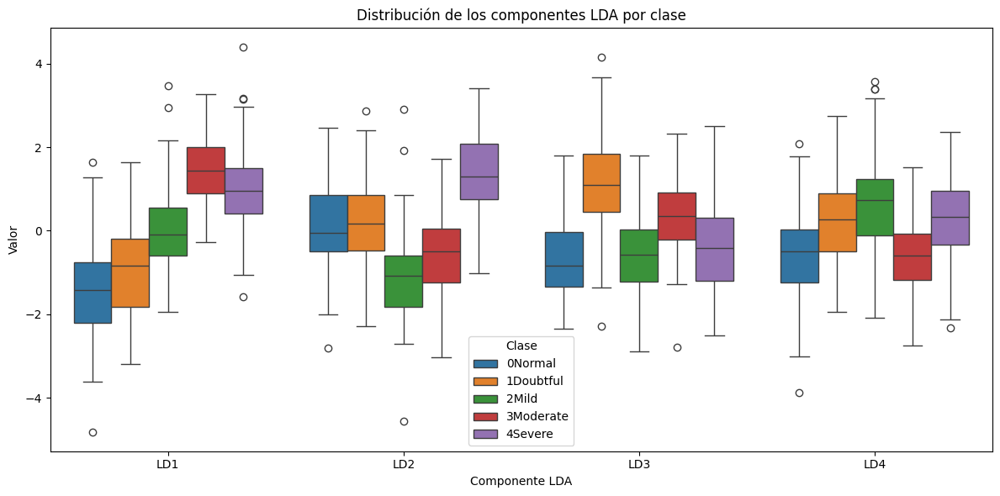

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Asumimos que tu DataFrame LDA se llama df_lda y tiene las columnas: LD1, LD2, LD3, LD4, label

# Convertir a formato largo para seaborn
df_lda_melt = df_lda.melt(id_vars='label', var_name='Componente LDA', value_name='Valor')

# Graficar boxplots
plt.figure(figsize=(12, 6))
sns.boxplot(data=df_lda_melt, x='Componente LDA', y='Valor', hue='label')
plt.title('Distribución de los componentes LDA por clase')
plt.legend(title='Clase')
plt.tight_layout()
plt.show()

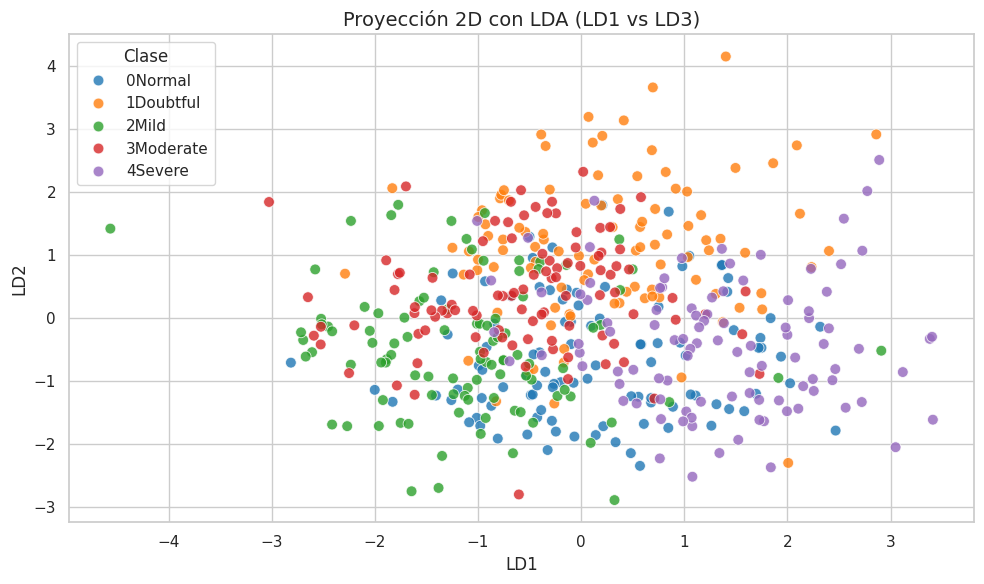

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Estilo de gráficos
sns.set(style="whitegrid", palette="muted")

# Tamaño del gráfico
plt.figure(figsize=(10, 6))

# Mapa de colores por clase
sns.scatterplot(
    x='LD2', y='LD3',
    hue='label',
    palette='tab10',  # Puedes cambiar a "Set1", "husl", etc. si prefieres
    data=df_lda,
    alpha=0.8,
    s=60
)

plt.title("Proyección 2D con LDA (LD1 vs LD3)", fontsize=14)
plt.xlabel("LD1")
plt.ylabel("LD2")
plt.legend(title="Clase")
plt.tight_layout()
plt.show()


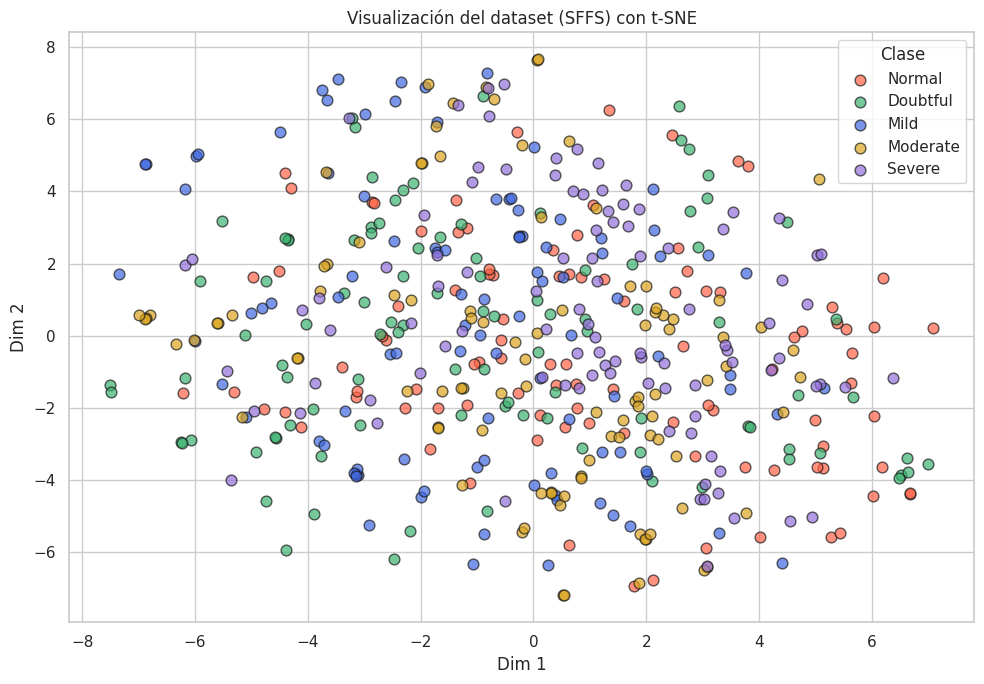

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# 1. Separar características y etiquetas
X_sffs = df_sffs.drop(columns=['label']).values
y_sffs = df_sffs['label'].values

# 2. Aplicar t-SNE
tsne = TSNE(n_components=2, perplexity=100, learning_rate=100, random_state=42)
X_tsne = tsne.fit_transform(X_sffs)

# 3. Visualización
plt.figure(figsize=(10, 7))
labels_unicos = sorted(np.unique(y_sffs))
colores = ['tomato', 'mediumseagreen', 'royalblue', 'goldenrod', 'mediumpurple']
nombres_clases = ['Normal', 'Doubtful', 'Mild', 'Moderate', 'Severe']

for label, color, name in zip(labels_unicos, colores, nombres_clases):
    plt.scatter(X_tsne[y_sffs == label, 0], X_tsne[y_sffs == label, 1],
                label=name, alpha=0.7, edgecolors='k', s=60, color=color)

plt.xlabel("Dim 1")
plt.ylabel("Dim 2")
plt.title("Visualización del dataset (SFFS) con t-SNE")
plt.legend(title="Clase")
plt.grid(True)
plt.tight_layout()
plt.show()


Se identificó que las clases adyacentes presentan un alto grado de similitud entre sí, lo que dificulta su diferenciación mediante métodos tradicionales de extracción y selección de características. Esta escasa variabilidad entre clases sugiere que enfoques basados en características manuales (como HOG, LBP y selección estadística) pueden no ser suficientes para lograr una clasificación precisa. En este tipo de casos, se recomienda el uso de técnicas más avanzadas como redes neuronales convolucionales (CNN), las cuales tienen la capacidad de aprender representaciones jerárquicas y no lineales directamente desde los datos, mejorando la discriminación entre clases con pocas diferencias.

## Prueba sin Sobel

In [ ]:
# Redimensionar las imágenes normalizadas a 300x160
imagenes_redimensionadas = {
    '0Normal': [],
    '1Doubtful': [],
    '2Mild': [],
    '3Moderate': [],
    '4Severe': []
}

for categoria in categories:
    for imagen in imagenes_normalizadas[categoria]:
        resized = cv2.resize(imagen, (300, 160))  # (ancho, alto)
        imagenes_redimensionadas[categoria].append(resized)


In [ ]:
from skimage.feature import hog, local_binary_pattern
import numpy as np
import pandas as pd

# Parámetros para LBP
radius = 2
n_points = 8 * radius
METHOD = 'ror'

X_features = []
y_labels = []

for categoria in categories:
    for img in imagenes_redimensionadas[categoria]:
        img = np.array(img, dtype=np.float32)

        # Asegurarse que esté en escala de grises 2D
        if img.ndim == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        elif img.ndim != 2:
            raise ValueError(f"Imagen inesperada: {img.shape}")

        # HOG
        hog_feat = hog(img,
                       orientations=9,
                       pixels_per_cell=(16, 16),
                       cells_per_block=(1, 1),
                       block_norm='L2-Hys',
                       visualize=False,
                       feature_vector=True)

        # LBP
        lbp = local_binary_pattern(img, n_points, radius, METHOD)
        hist, _ = np.histogram(lbp.ravel(),
                               bins=np.arange(0, n_points + 3),
                               range=(0, n_points + 2))
        hist = hist.astype("float")
        hist /= (hist.sum() + 1e-6)

        # Unir HOG y LBP
        combined = np.concatenate([hog_feat, hist])
        X_features.append(combined)
        y_labels.append(categoria)

# Convertir a DataFrame
X_df = pd.DataFrame(X_features)
y_df = pd.Series(y_labels, name='label')
df_total = pd.concat([X_df, y_df], axis=1)

# Mostrar información
print(f"Total de muestras: {len(df_total)}")
print(f"Dimensiones del vector de características: {X_df.shape[1]}")
df_total.head()


/usr/local/lib/python3.11/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


Total de muestras: 500
Dimensiones del vector de características: 1638


,0,1,2,3,4,5,6,7,8,9,...,1629,1630,1631,1632,1633,1634,1635,1636,1637,label
0,0.479992,0.254040,0.095549,0.000000,0.069037,0.000000,0.479992,0.479992,0.479992,0.593380,...,0.000595,0.0,0.001588,0.0,0.000794,0.0,0.253077,0.0,0.002580,0Normal
1,0.655455,0.007810,0.000000,0.000000,0.037286,0.000000,0.014937,0.372940,0.655455,0.575978,...,0.000732,0.0,0.001098,0.0,0.001464,0.0,0.235316,0.0,0.004026,0Normal
2,0.846328,0.012107,0.015697,0.002836,0.011119,0.000000,0.038721,0.010439,0.530655,0.689123,...,0.000390,0.0,0.001170,0.0,0.001560,0.0,0.202184,0.0,0.004679,0Normal
3,0.368019,0.055647,0.036866,0.000000,0.174322,0.046709,0.472672,0.549599,0.549599,0.442897,...,0.000000,0.0,0.000499,0.0,0.000748,0.0,0.281297,0.0,0.003242,0Normal
4,0.650173,0.000000,0.000000,0.000000,0.000000,0.000000,0.650173,0.000000,0.393128,0.649717,...,0.000380,0.0,0.001141,0.0,0.000761,0.0,0.227610,0.0,0.003423,0Normal


/usr/local/lib/python3.11/dist-packages/skimage/feature/texture.py:385: UserWarning: Applying `local_binary_pattern` to floating-point images may give unexpected results when small numerical differences between adjacent pixels are present. It is recommended to use this function with images of integer dtype.
  warnings.warn(


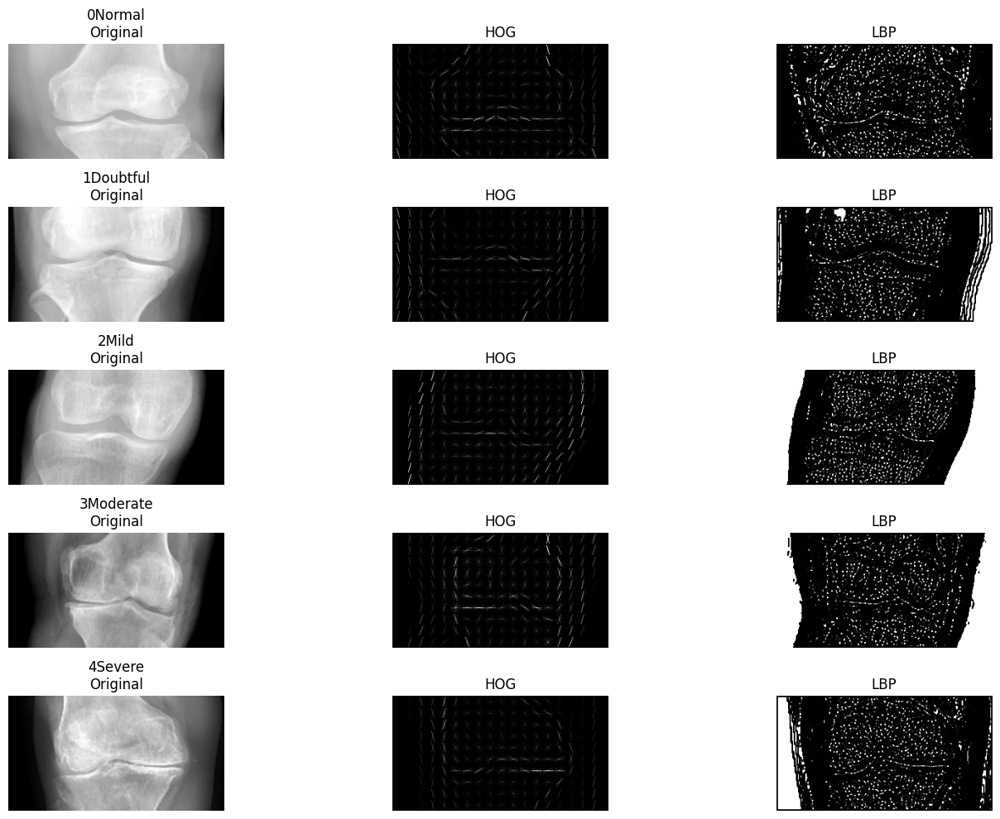

In [ ]:
import matplotlib.pyplot as plt
from skimage.feature import hog, local_binary_pattern
from skimage import exposure
import numpy as np
import cv2

# Parámetros LBP
radius = 2
n_points = 8 * radius
METHOD = 'ror'

plt.figure(figsize=(15, 10))

for i, categoria in enumerate(categories):
    # Usamos la primera imagen redimensionada de cada clase
    imagen = imagenes_redimensionadas[categoria][0]
    img_gray = imagen if imagen.ndim == 2 else cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

    # HOG con visualización
    hog_features, hog_image = hog(img_gray,
                                   orientations=9,
                                   pixels_per_cell=(16, 16),
                                   cells_per_block=(1, 1),
                                   block_norm='L2-Hys',
                                   visualize=True,
                                   feature_vector=True)

    hog_image = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    # LBP
    lbp = local_binary_pattern(img_gray, n_points, radius, METHOD)

    # Mostrar imágenes
    plt.subplot(len(categories), 3, i*3 + 1)
    plt.imshow(img_gray, cmap='gray')
    plt.title(f'{categoria}\nOriginal')
    plt.axis('off')

    plt.subplot(len(categories), 3, i*3 + 2)
    plt.imshow(hog_image, cmap='gray')
    plt.title('HOG')
    plt.axis('off')

    plt.subplot(len(categories), 3, i*3 + 3)
    plt.imshow(lbp, cmap='gray')
    plt.title('LBP')
    plt.axis('off')

plt.tight_layout()
plt.show()


Al comparar los vectores de características generados por HOG en imágenes preprocesadas con Sobel frente a las imágenes sin este tratamiento, se evidenció un aumento notable en la intensidad y riqueza de las descripciones generadas. Esto se traduce en vectores con mayor variabilidad y presencia de información estructural útil, lo cual puede beneficiar significativamente el rendimiento de clasificadores posteriores.

Por lo tanto, se concluye que aplicar una detección de bordes con Sobel antes de extraer características con HOG mejora la calidad de las representaciones, especialmente en contextos médicos donde los bordes (como el contorno de huesos o el estrechamiento del espacio articular) son determinantes para el diagnóstico.

## Entrega final

## Kruskall ➝ PCA ➝ SVM
Estrategia con PCA.

Escala los datos (obligatorio para PCA)

Aplica PCA

Visualiza cuánta varianza explican los componentes

Conserva los componentes que explican el 95% de la varianza

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd

# 1. Separar X e y
X = df_filtrado.drop(columns=['label'])
y = df_filtrado['label']

# 2. Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Aplicar PCA sin limitar componentes (para analizar varianza)
pca_full = PCA()
X_pca_full = pca_full.fit_transform(X_scaled)



# 5. Elegir componentes que expliquen el 95% de la varianza
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)

print(f"Se conservaron {X_pca.shape[1]} componentes principales")

# 6. Crear nuevo DataFrame con componentes + etiqueta
df_pca = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])
df_pca['label'] = y.values

print(df_pca.head())


Se conservaron 274 componentes principales
         PC1       PC2        PC3        PC4       PC5       PC6       PC7  \
0 -13.266209 -7.127767  -4.253007  -4.952980 -2.236195  3.786872  3.418611   
1  -0.951587 -5.815940  -9.027680  10.748133  3.632498 -1.262297  4.510749   
2   9.345292  6.114660 -10.540362   3.204452 -0.180940  0.625216 -6.132758   
3   5.050621 -2.481213   4.577495 -10.769572 -4.398215  1.340540 -3.789290   
4   1.696561 -5.941654 -13.290813   6.104691  1.273093 -6.571777 -3.542200   

         PC8       PC9      PC10  ...     PC266     PC267     PC268     PC269  \
0  -2.104218  9.919833 -1.180920  ... -0.413161 -2.133159 -0.004210  1.518190   
1  -1.104433  0.421322 -3.403743  ...  0.882645  0.581638  0.182211  0.442405   
2   1.006718  2.831483 -3.396872  ...  1.534982 -0.524234  0.913844  0.423653   
3 -10.382122  1.440228  7.444565  ... -0.167643  0.848596 -0.483971 -0.181359   
4  -1.905897  4.593482 -0.870888  ...  0.198190 -0.250178  0.697958  1.222609   

 

A estas 274 caracteristicas se le aplica SVM:


=== SVM con kernel='linear' y C=0.1 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.46      0.43      0.45        30
   1Doubtful       0.47      0.57      0.52        30
       2Mild       0.61      0.47      0.53        30
   3Moderate       0.58      0.60      0.59        30
     4Severe       0.53      0.57      0.55        30

    accuracy                           0.53       150
   macro avg       0.53      0.53      0.53       150
weighted avg       0.53      0.53      0.53       150



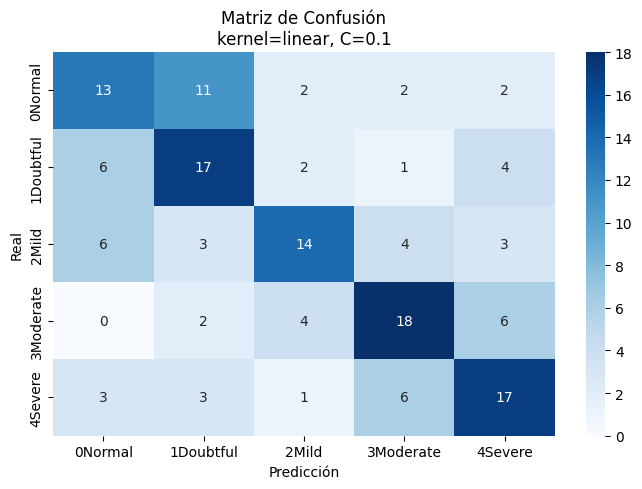


=== SVM con kernel='linear' y C=1 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.46      0.43      0.45        30
   1Doubtful       0.47      0.57      0.52        30
       2Mild       0.61      0.47      0.53        30
   3Moderate       0.58      0.60      0.59        30
     4Severe       0.53      0.57      0.55        30

    accuracy                           0.53       150
   macro avg       0.53      0.53      0.53       150
weighted avg       0.53      0.53      0.53       150



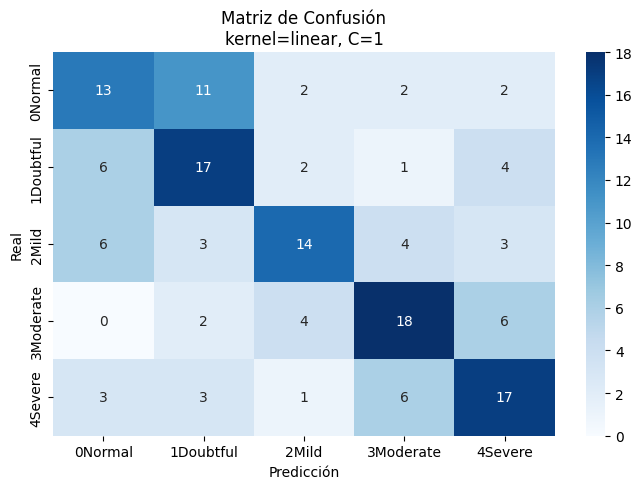


=== SVM con kernel='linear' y C=10 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.46      0.43      0.45        30
   1Doubtful       0.47      0.57      0.52        30
       2Mild       0.61      0.47      0.53        30
   3Moderate       0.58      0.60      0.59        30
     4Severe       0.53      0.57      0.55        30

    accuracy                           0.53       150
   macro avg       0.53      0.53      0.53       150
weighted avg       0.53      0.53      0.53       150



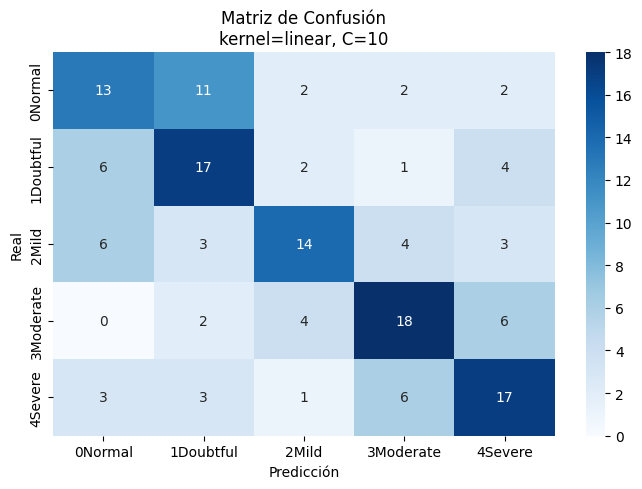


=== SVM con kernel='linear' y C=100 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.46      0.43      0.45        30
   1Doubtful       0.47      0.57      0.52        30
       2Mild       0.61      0.47      0.53        30
   3Moderate       0.58      0.60      0.59        30
     4Severe       0.53      0.57      0.55        30

    accuracy                           0.53       150
   macro avg       0.53      0.53      0.53       150
weighted avg       0.53      0.53      0.53       150



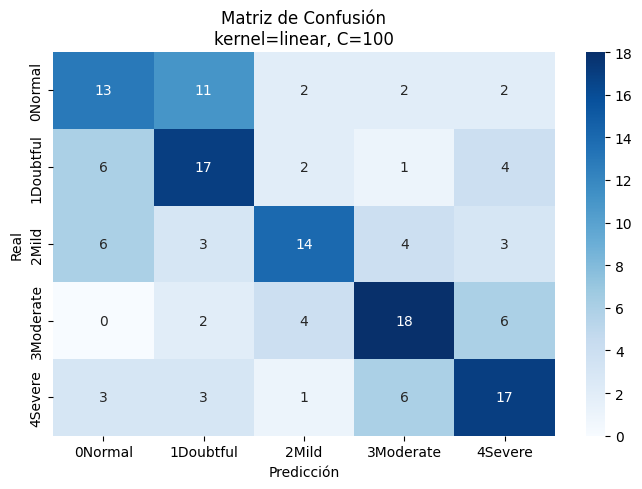

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Separar características y etiquetas
X_pca = df_pca.drop(columns=['label']).values
y_pca = df_pca['label'].values

# Dividir en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_pca, y_pca, test_size=0.3, random_state=42, stratify=y_pca)

# Lista de valores de C a probar
valores_C = [0.1, 1, 10, 100]

# Kernel que puedes modificar manualmente
kernel_usado = 'linear'  #  'linear', 'poly', 'sigmoid', etc.

# Probar cada valor de C
for C_val in valores_C:
    print(f"\n=== SVM con kernel='{kernel_usado}' y C={C_val} ===")

    clf = SVC(kernel=kernel_usado, C=C_val, gamma='scale')
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)

    print("Reporte de clasificación:\n")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=clf.classes_,
                yticklabels=clf.classes_)
    plt.title(f'Matriz de Confusión\nkernel={kernel_usado}, C={C_val}')
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.tight_layout()
    plt.show()



=== SVM con kernel='poly' y C=0.1 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.00      0.00      0.00        30
   1Doubtful       0.00      0.00      0.00        30
       2Mild       1.00      0.03      0.06        30
   3Moderate       0.21      0.73      0.32        30
     4Severe       0.36      0.50      0.42        30

    accuracy                           0.25       150
   macro avg       0.31      0.25      0.16       150
weighted avg       0.31      0.25      0.16       150



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


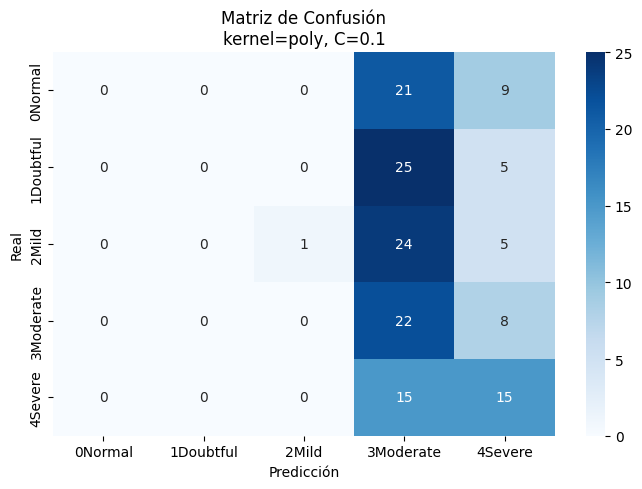


=== SVM con kernel='poly' y C=1 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.73      0.27      0.39        30
   1Doubtful       0.59      0.43      0.50        30
       2Mild       0.56      0.17      0.26        30
   3Moderate       0.29      0.70      0.41        30
     4Severe       0.37      0.43      0.40        30

    accuracy                           0.40       150
   macro avg       0.51      0.40      0.39       150
weighted avg       0.51      0.40      0.39       150



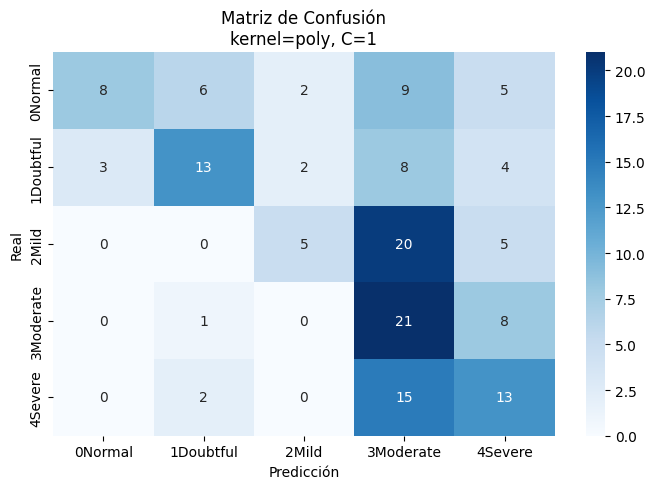


=== SVM con kernel='poly' y C=10 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.69      0.30      0.42        30
   1Doubtful       0.62      0.43      0.51        30
       2Mild       0.57      0.40      0.47        30
   3Moderate       0.41      0.70      0.52        30
     4Severe       0.48      0.70      0.57        30

    accuracy                           0.51       150
   macro avg       0.55      0.51      0.50       150
weighted avg       0.55      0.51      0.50       150



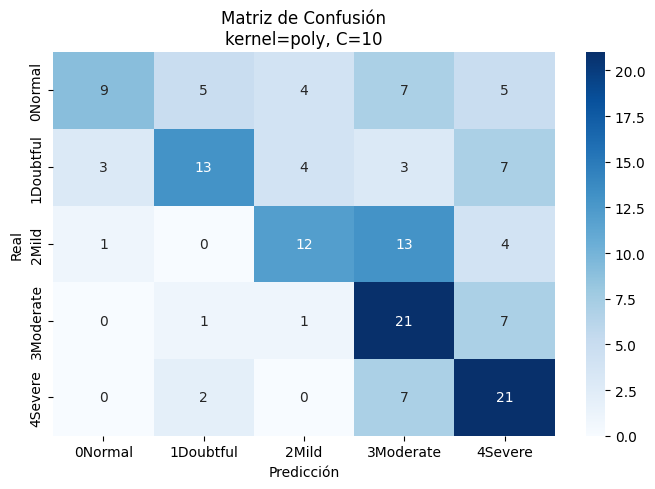


=== SVM con kernel='poly' y C=100 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.69      0.30      0.42        30
   1Doubtful       0.62      0.43      0.51        30
       2Mild       0.57      0.40      0.47        30
   3Moderate       0.41      0.70      0.52        30
     4Severe       0.48      0.70      0.57        30

    accuracy                           0.51       150
   macro avg       0.55      0.51      0.50       150
weighted avg       0.55      0.51      0.50       150



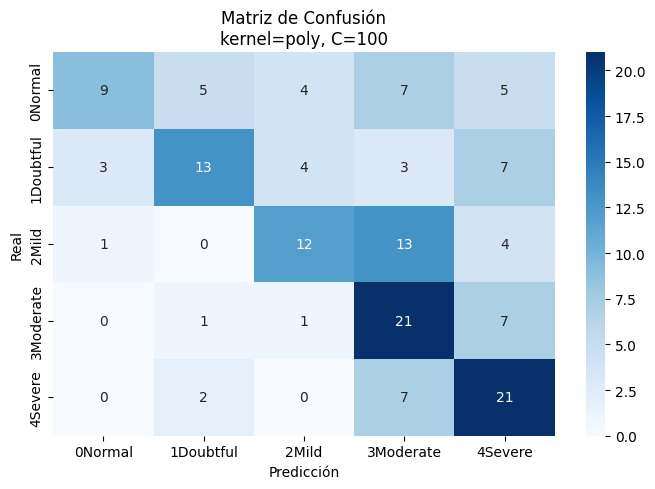

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Separar características y etiquetas
X_pca = df_pca.drop(columns=['label']).values
y_pca = df_pca['label'].values

# Dividir en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_pca, y_pca, test_size=0.3, random_state=42, stratify=y_pca)

# Lista de valores de C a probar
valores_C = [0.1, 1, 10, 100]

# Kernel que puedes modificar manualmente
kernel_usado = 'poly'  #  'linear', 'poly', 'sigmoid', etc.

# Probar cada valor de C
for C_val in valores_C:
    print(f"\n=== SVM con kernel='{kernel_usado}' y C={C_val} ===")

    clf = SVC(kernel=kernel_usado, C=C_val, gamma='scale')
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)

    print("Reporte de clasificación:\n")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=clf.classes_,
                yticklabels=clf.classes_)
    plt.title(f'Matriz de Confusión\nkernel={kernel_usado}, C={C_val}')
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.tight_layout()
    plt.show()



=== SVM con kernel='sigmoid' y C=0.1 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.46      0.43      0.45        30
   1Doubtful       0.47      0.47      0.47        30
       2Mild       0.54      0.23      0.33        30
   3Moderate       0.40      0.57      0.47        30
     4Severe       0.46      0.57      0.51        30

    accuracy                           0.45       150
   macro avg       0.47      0.45      0.44       150
weighted avg       0.47      0.45      0.44       150



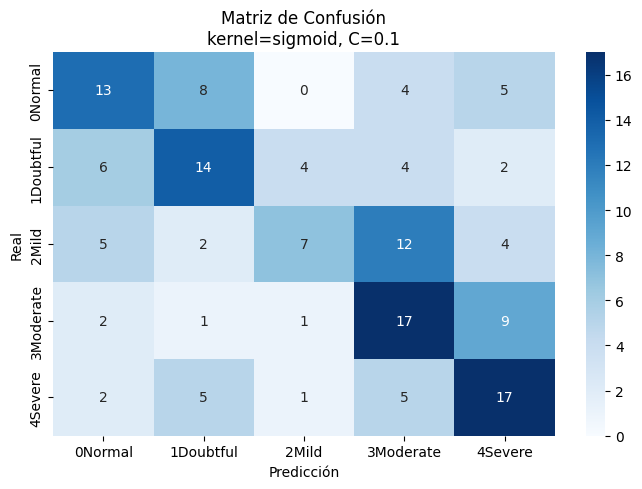


=== SVM con kernel='sigmoid' y C=1 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.56      0.47      0.51        30
   1Doubtful       0.55      0.57      0.56        30
       2Mild       0.42      0.37      0.39        30
   3Moderate       0.50      0.60      0.55        30
     4Severe       0.56      0.60      0.58        30

    accuracy                           0.52       150
   macro avg       0.52      0.52      0.52       150
weighted avg       0.52      0.52      0.52       150



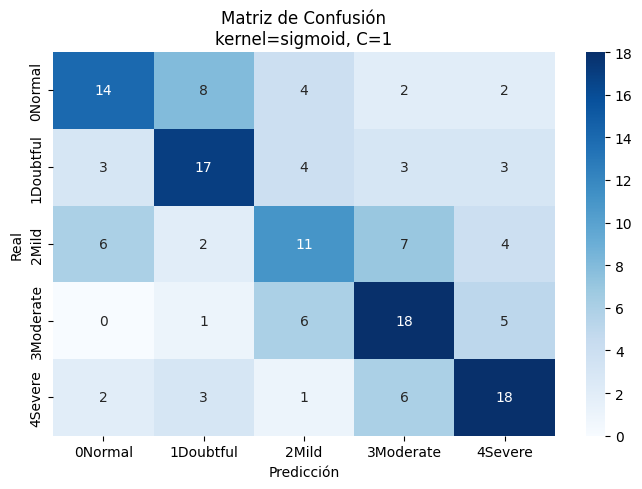


=== SVM con kernel='sigmoid' y C=10 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.42      0.43      0.43        30
   1Doubtful       0.46      0.53      0.49        30
       2Mild       0.42      0.37      0.39        30
   3Moderate       0.45      0.47      0.46        30
     4Severe       0.63      0.57      0.60        30

    accuracy                           0.47       150
   macro avg       0.48      0.47      0.47       150
weighted avg       0.48      0.47      0.47       150



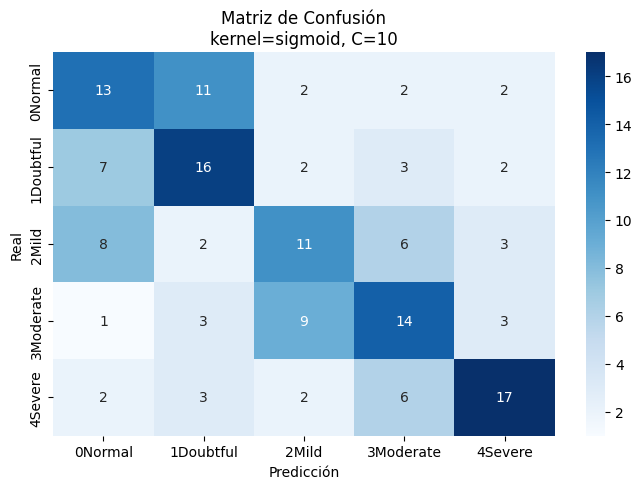


=== SVM con kernel='sigmoid' y C=100 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.46      0.37      0.41        30
   1Doubtful       0.35      0.53      0.42        30
       2Mild       0.50      0.40      0.44        30
   3Moderate       0.44      0.40      0.42        30
     4Severe       0.59      0.57      0.58        30

    accuracy                           0.45       150
   macro avg       0.47      0.45      0.45       150
weighted avg       0.47      0.45      0.45       150



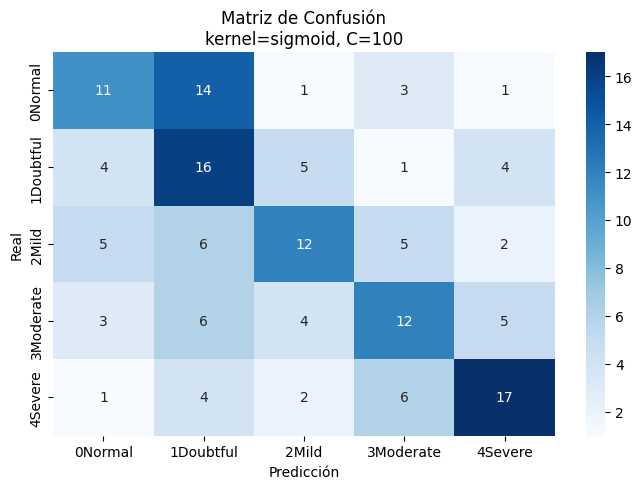

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Separar características y etiquetas
X_pca = df_pca.drop(columns=['label']).values
y_pca = df_pca['label'].values

# Dividir en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_pca, y_pca, test_size=0.3, random_state=42, stratify=y_pca)

# Lista de valores de C a probar
valores_C = [0.1, 1, 10, 100]

# Kernel que puedes modificar manualmente
kernel_usado = 'sigmoid'  #  'linear', 'poly', 'sigmoid'.

# Probar cada valor de C
for C_val in valores_C:
    print(f"\n=== SVM con kernel='{kernel_usado}' y C={C_val} ===")

    clf = SVC(kernel=kernel_usado, C=C_val, gamma='scale')
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)

    print("Reporte de clasificación:\n")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=clf.classes_,
                yticklabels=clf.classes_)
    plt.title(f'Matriz de Confusión\nkernel={kernel_usado}, C={C_val}')
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.tight_layout()
    plt.show()



=== SVM con kernel='rbf' y C=0.1 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.47      0.60      0.53        30
   1Doubtful       0.48      0.33      0.39        30
       2Mild       0.54      0.23      0.33        30
   3Moderate       0.45      0.63      0.53        30
     4Severe       0.39      0.47      0.42        30

    accuracy                           0.45       150
   macro avg       0.47      0.45      0.44       150
weighted avg       0.47      0.45      0.44       150



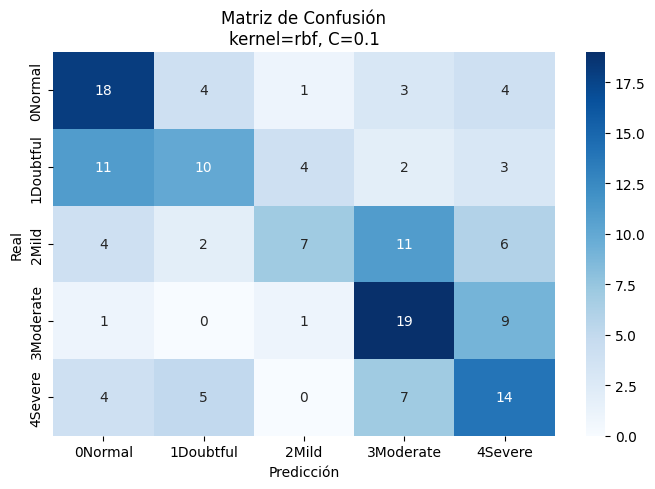


=== SVM con kernel='rbf' y C=1 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.54      0.50      0.52        30
   1Doubtful       0.50      0.57      0.53        30
       2Mild       0.48      0.40      0.44        30
   3Moderate       0.50      0.57      0.53        30
     4Severe       0.59      0.57      0.58        30

    accuracy                           0.52       150
   macro avg       0.52      0.52      0.52       150
weighted avg       0.52      0.52      0.52       150



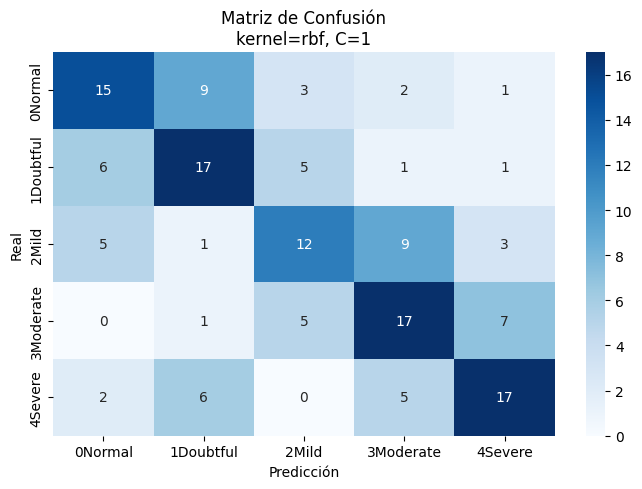


=== SVM con kernel='rbf' y C=10 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.53      0.53      0.53        30
   1Doubtful       0.56      0.60      0.58        30
       2Mild       0.54      0.47      0.50        30
   3Moderate       0.55      0.53      0.54        30
     4Severe       0.58      0.63      0.60        30

    accuracy                           0.55       150
   macro avg       0.55      0.55      0.55       150
weighted avg       0.55      0.55      0.55       150



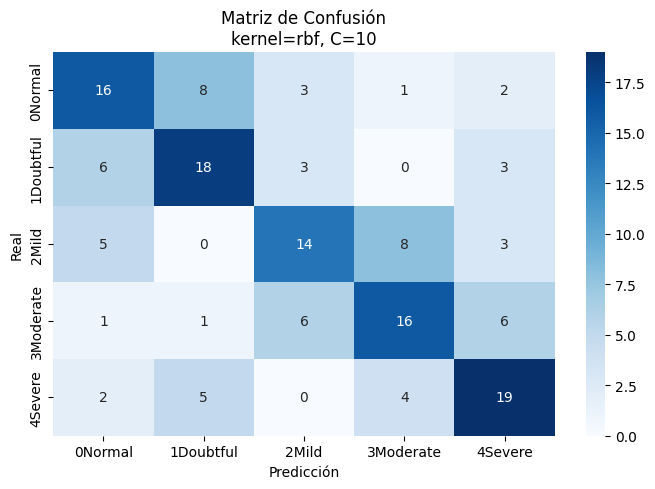


=== SVM con kernel='rbf' y C=100 ===
Reporte de clasificación:

              precision    recall  f1-score   support

     0Normal       0.53      0.53      0.53        30
   1Doubtful       0.56      0.60      0.58        30
       2Mild       0.54      0.47      0.50        30
   3Moderate       0.55      0.53      0.54        30
     4Severe       0.58      0.63      0.60        30

    accuracy                           0.55       150
   macro avg       0.55      0.55      0.55       150
weighted avg       0.55      0.55      0.55       150



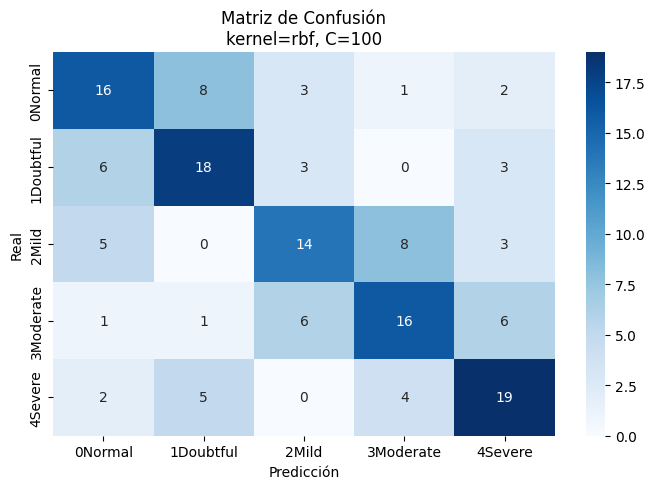

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Separar características y etiquetas
X_pca = df_pca.drop(columns=['label']).values
y_pca = df_pca['label'].values

# Dividir en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X_pca, y_pca, test_size=0.3, random_state=42, stratify=y_pca)

# Lista de valores de C a probar
valores_C = [0.1, 1, 10, 100]

# Kernel que puedes modificar manualmente
kernel_usado = 'rbf'  #  'linear', 'poly', 'sigmoid'.

# Probar cada valor de C
for C_val in valores_C:
    print(f"\n=== SVM con kernel='{kernel_usado}' y C={C_val} ===")

    clf = SVC(kernel=kernel_usado, C=C_val, gamma='scale')
    clf.fit(X_train, y_train)

    y_pred = clf.predict(X_test)

    print("Reporte de clasificación:\n")
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=clf.classes_,
                yticklabels=clf.classes_)
    plt.title(f'Matriz de Confusión\nkernel={kernel_usado}, C={C_val}')
    plt.xlabel('Predicción')
    plt.ylabel('Real')
    plt.tight_layout()
    plt.show()


## Con Stratified k-fold


🔍 Evaluando SVM con kernel='linear' y C=0.1

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.44      0.55      0.49        20
   1Doubtful       0.48      0.55      0.51        20
       2Mild       0.52      0.55      0.54        20
   3Moderate       0.68      0.65      0.67        20
     4Severe       0.83      0.50      0.62        20

    accuracy                           0.56       100
   macro avg       0.59      0.56      0.57       100
weighted avg       0.59      0.56      0.57       100



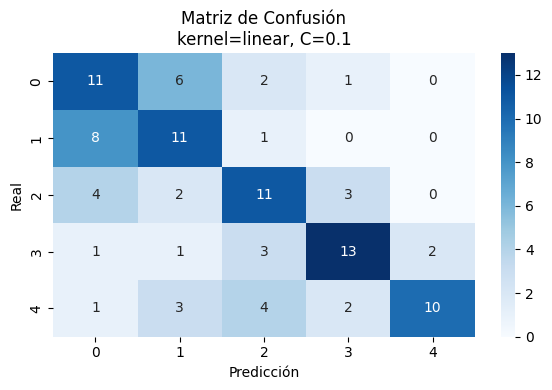

📊 Métricas promedio (5 folds):
Accuracy:  0.5360 ± 0.0174
Precision: 0.5482 ± 0.0235
Recall:    0.5360 ± 0.0174
F1-Score:  0.5359 ± 0.0199

🔍 Evaluando SVM con kernel='linear' y C=1

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.44      0.55      0.49        20
   1Doubtful       0.48      0.55      0.51        20
       2Mild       0.52      0.55      0.54        20
   3Moderate       0.68      0.65      0.67        20
     4Severe       0.83      0.50      0.62        20

    accuracy                           0.56       100
   macro avg       0.59      0.56      0.57       100
weighted avg       0.59      0.56      0.57       100



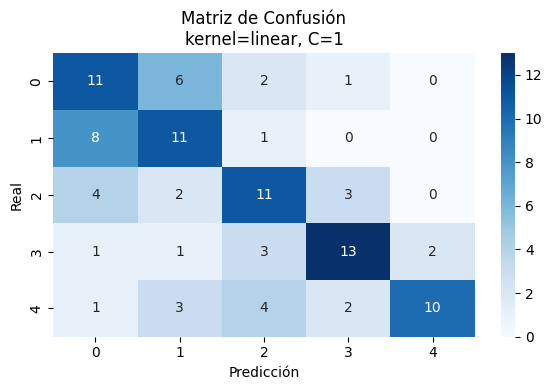

📊 Métricas promedio (5 folds):
Accuracy:  0.5360 ± 0.0174
Precision: 0.5482 ± 0.0235
Recall:    0.5360 ± 0.0174
F1-Score:  0.5359 ± 0.0199

🔍 Evaluando SVM con kernel='linear' y C=10

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.44      0.55      0.49        20
   1Doubtful       0.48      0.55      0.51        20
       2Mild       0.52      0.55      0.54        20
   3Moderate       0.68      0.65      0.67        20
     4Severe       0.83      0.50      0.62        20

    accuracy                           0.56       100
   macro avg       0.59      0.56      0.57       100
weighted avg       0.59      0.56      0.57       100



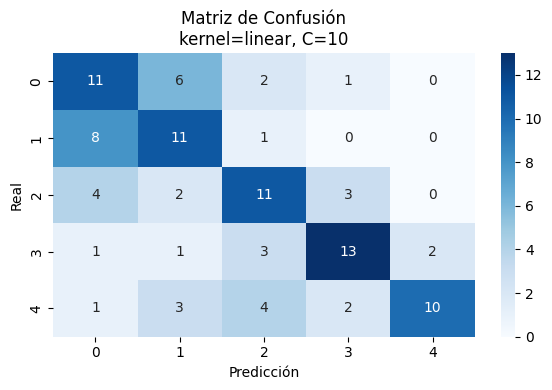

📊 Métricas promedio (5 folds):
Accuracy:  0.5360 ± 0.0174
Precision: 0.5482 ± 0.0235
Recall:    0.5360 ± 0.0174
F1-Score:  0.5359 ± 0.0199

🔍 Evaluando SVM con kernel='linear' y C=100

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.44      0.55      0.49        20
   1Doubtful       0.48      0.55      0.51        20
       2Mild       0.52      0.55      0.54        20
   3Moderate       0.68      0.65      0.67        20
     4Severe       0.83      0.50      0.62        20

    accuracy                           0.56       100
   macro avg       0.59      0.56      0.57       100
weighted avg       0.59      0.56      0.57       100



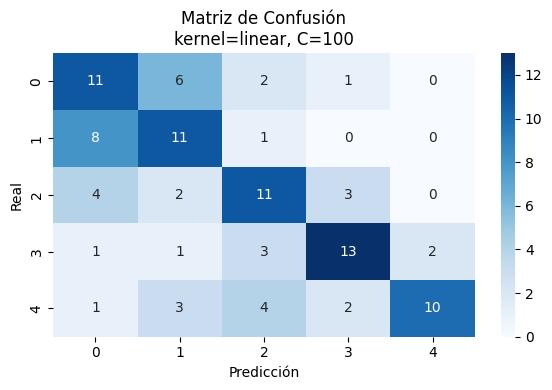

📊 Métricas promedio (5 folds):
Accuracy:  0.5360 ± 0.0174
Precision: 0.5482 ± 0.0235
Recall:    0.5360 ± 0.0174
F1-Score:  0.5359 ± 0.0199

🔍 Evaluando SVM con kernel='rbf' y C=0.1

✅ Mejor Fold: #3
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.50      0.50      0.50        20
   1Doubtful       0.54      0.65      0.59        20
       2Mild       0.57      0.40      0.47        20
   3Moderate       0.54      0.65      0.59        20
     4Severe       0.56      0.50      0.53        20

    accuracy                           0.54       100
   macro avg       0.54      0.54      0.54       100
weighted avg       0.54      0.54      0.54       100



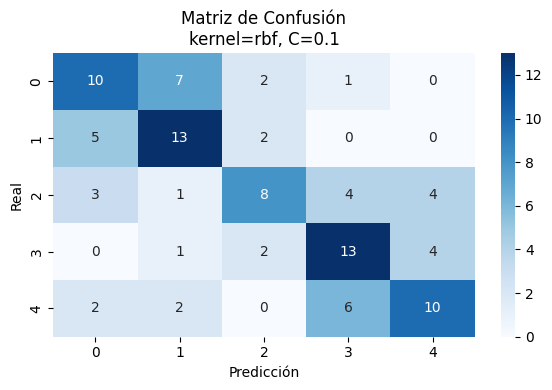

📊 Métricas promedio (5 folds):
Accuracy:  0.4900 ± 0.0395
Precision: 0.4901 ± 0.0401
Recall:    0.4900 ± 0.0395
F1-Score:  0.4801 ± 0.0386

🔍 Evaluando SVM con kernel='rbf' y C=1

✅ Mejor Fold: #3
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.62      0.65      0.63        20
   1Doubtful       0.57      0.60      0.59        20
       2Mild       0.56      0.45      0.50        20
   3Moderate       0.70      0.80      0.74        20
     4Severe       0.58      0.55      0.56        20

    accuracy                           0.61       100
   macro avg       0.61      0.61      0.61       100
weighted avg       0.61      0.61      0.61       100



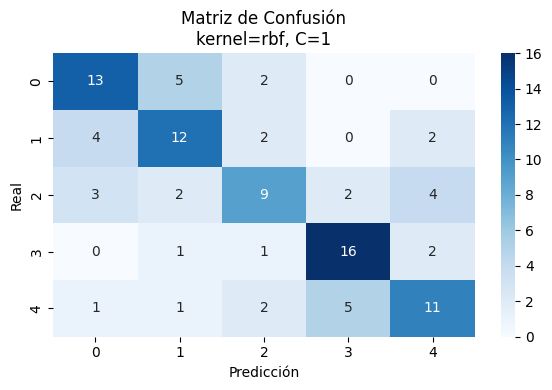

📊 Métricas promedio (5 folds):
Accuracy:  0.5620 ± 0.0366
Precision: 0.5692 ± 0.0395
Recall:    0.5620 ± 0.0366
F1-Score:  0.5629 ± 0.0369

🔍 Evaluando SVM con kernel='rbf' y C=10

✅ Mejor Fold: #3
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.65      0.65      0.65        20
   1Doubtful       0.70      0.70      0.70        20
       2Mild       0.50      0.45      0.47        20
   3Moderate       0.70      0.80      0.74        20
     4Severe       0.63      0.60      0.62        20

    accuracy                           0.64       100
   macro avg       0.64      0.64      0.64       100
weighted avg       0.64      0.64      0.64       100



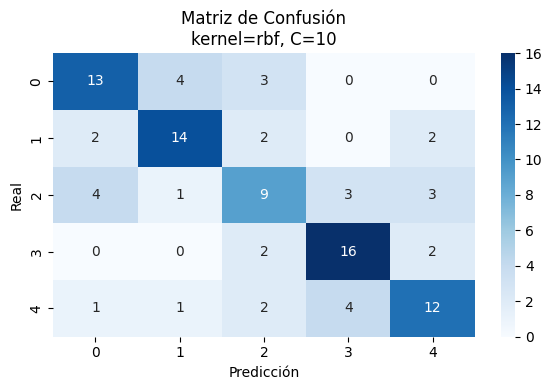

📊 Métricas promedio (5 folds):
Accuracy:  0.5800 ± 0.0456
Precision: 0.5829 ± 0.0472
Recall:    0.5800 ± 0.0456
F1-Score:  0.5785 ± 0.0469

🔍 Evaluando SVM con kernel='rbf' y C=100

✅ Mejor Fold: #3
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.65      0.65      0.65        20
   1Doubtful       0.70      0.70      0.70        20
       2Mild       0.50      0.45      0.47        20
   3Moderate       0.70      0.80      0.74        20
     4Severe       0.63      0.60      0.62        20

    accuracy                           0.64       100
   macro avg       0.64      0.64      0.64       100
weighted avg       0.64      0.64      0.64       100



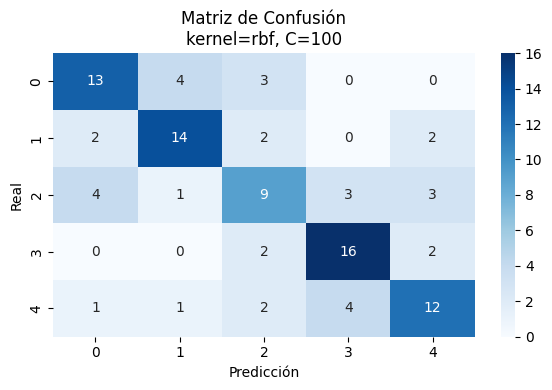

📊 Métricas promedio (5 folds):
Accuracy:  0.5800 ± 0.0456
Precision: 0.5839 ± 0.0463
Recall:    0.5800 ± 0.0456
F1-Score:  0.5787 ± 0.0468

🔍 Evaluando SVM con kernel='poly' y C=0.1

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       1.00      0.20      0.33        20
   1Doubtful       0.00      0.00      0.00        20
       2Mild       1.00      0.10      0.18        20
   3Moderate       0.27      0.95      0.42        20
     4Severe       0.54      0.65      0.59        20

    accuracy                           0.38       100
   macro avg       0.56      0.38      0.31       100
weighted avg       0.56      0.38      0.31       100



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


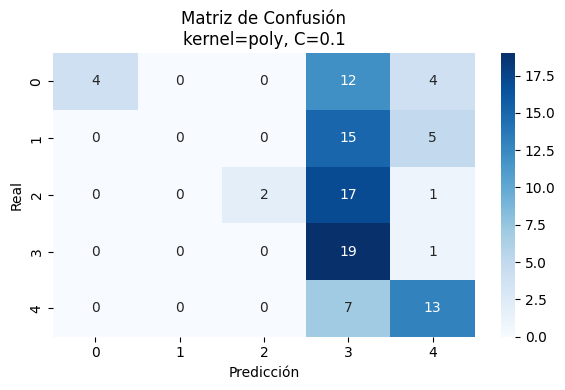

📊 Métricas promedio (5 folds):
Accuracy:  0.3040 ± 0.0492
Precision: 0.3780 ± 0.0932
Recall:    0.3040 ± 0.0492
F1-Score:  0.2088 ± 0.0531

🔍 Evaluando SVM con kernel='poly' y C=1

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.62      0.40      0.48        20
   1Doubtful       0.57      0.65      0.60        20
       2Mild       0.80      0.40      0.53        20
   3Moderate       0.56      0.90      0.69        20
     4Severe       0.64      0.70      0.67        20

    accuracy                           0.61       100
   macro avg       0.64      0.61      0.60       100
weighted avg       0.64      0.61      0.60       100



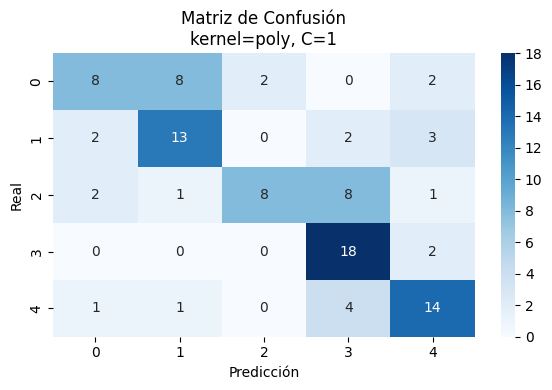

📊 Métricas promedio (5 folds):
Accuracy:  0.5040 ± 0.0568
Precision: 0.5843 ± 0.0415
Recall:    0.5040 ± 0.0568
F1-Score:  0.4952 ± 0.0522

🔍 Evaluando SVM con kernel='poly' y C=10

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.67      0.40      0.50        20
   1Doubtful       0.55      0.55      0.55        20
       2Mild       0.62      0.50      0.56        20
   3Moderate       0.58      0.90      0.71        20
     4Severe       0.67      0.70      0.68        20

    accuracy                           0.61       100
   macro avg       0.62      0.61      0.60       100
weighted avg       0.62      0.61      0.60       100



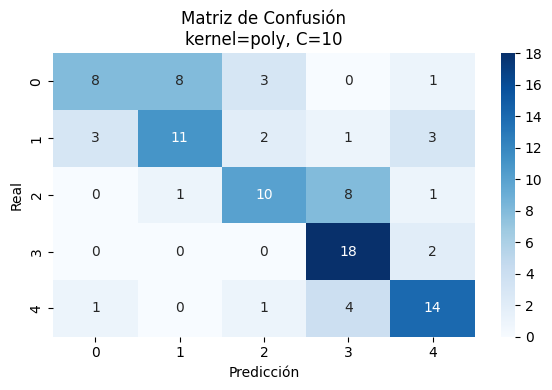

📊 Métricas promedio (5 folds):
Accuracy:  0.5260 ± 0.0496
Precision: 0.5821 ± 0.0249
Recall:    0.5260 ± 0.0496
F1-Score:  0.5138 ± 0.0478

🔍 Evaluando SVM con kernel='poly' y C=100

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.67      0.40      0.50        20
   1Doubtful       0.55      0.55      0.55        20
       2Mild       0.62      0.50      0.56        20
   3Moderate       0.58      0.90      0.71        20
     4Severe       0.67      0.70      0.68        20

    accuracy                           0.61       100
   macro avg       0.62      0.61      0.60       100
weighted avg       0.62      0.61      0.60       100



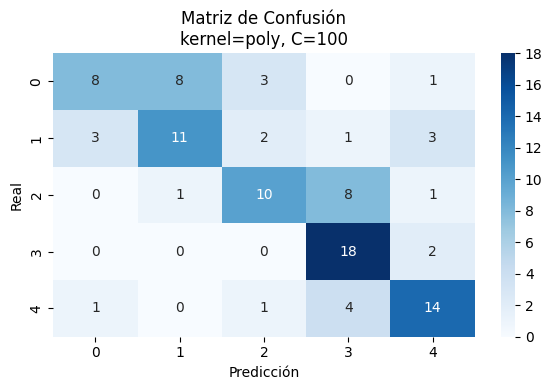

📊 Métricas promedio (5 folds):
Accuracy:  0.5260 ± 0.0496
Precision: 0.5821 ± 0.0249
Recall:    0.5260 ± 0.0496
F1-Score:  0.5138 ± 0.0478

🔍 Evaluando SVM con kernel='sigmoid' y C=0.1

✅ Mejor Fold: #4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.69      0.55      0.61        20
   1Doubtful       0.56      0.50      0.53        20
       2Mild       0.45      0.25      0.32        20
   3Moderate       0.41      0.65      0.50        20
     4Severe       0.48      0.55      0.51        20

    accuracy                           0.50       100
   macro avg       0.52      0.50      0.49       100
weighted avg       0.52      0.50      0.49       100



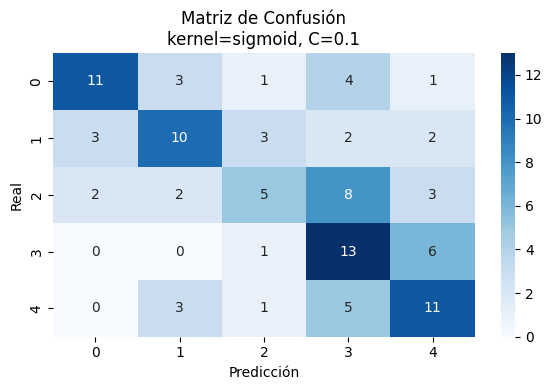

📊 Métricas promedio (5 folds):
Accuracy:  0.4560 ± 0.0326
Precision: 0.4570 ± 0.0392
Recall:    0.4560 ± 0.0326
F1-Score:  0.4488 ± 0.0353

🔍 Evaluando SVM con kernel='sigmoid' y C=1

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.44      0.60      0.51        20
   1Doubtful       0.50      0.55      0.52        20
       2Mild       0.50      0.25      0.33        20
   3Moderate       0.67      0.70      0.68        20
     4Severe       0.70      0.70      0.70        20

    accuracy                           0.56       100
   macro avg       0.56      0.56      0.55       100
weighted avg       0.56      0.56      0.55       100



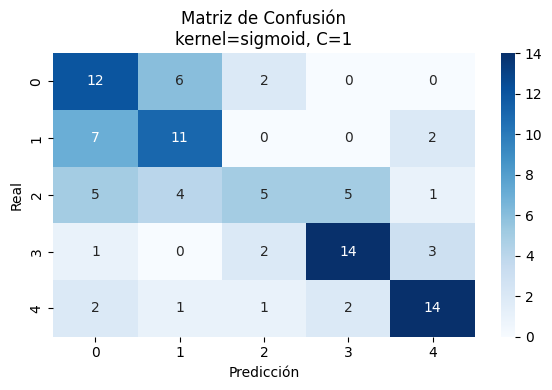

📊 Métricas promedio (5 folds):
Accuracy:  0.5160 ± 0.0265
Precision: 0.5157 ± 0.0293
Recall:    0.5160 ± 0.0265
F1-Score:  0.5117 ± 0.0251

🔍 Evaluando SVM con kernel='sigmoid' y C=10

✅ Mejor Fold: #5
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.67      0.70      0.68        20
   1Doubtful       0.52      0.60      0.56        20
       2Mild       0.53      0.45      0.49        20
   3Moderate       0.44      0.40      0.42        20
     4Severe       0.52      0.55      0.54        20

    accuracy                           0.54       100
   macro avg       0.54      0.54      0.54       100
weighted avg       0.54      0.54      0.54       100



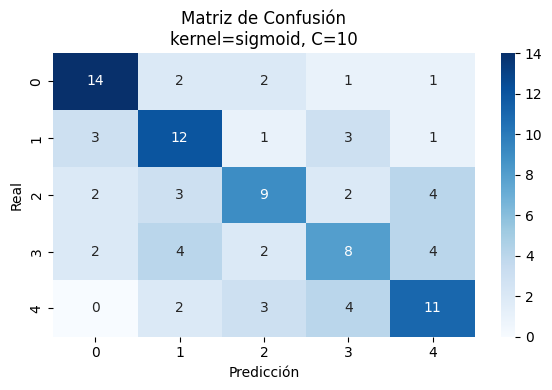

📊 Métricas promedio (5 folds):
Accuracy:  0.4960 ± 0.0294
Precision: 0.5104 ± 0.0253
Recall:    0.4960 ± 0.0294
F1-Score:  0.4977 ± 0.0282

🔍 Evaluando SVM con kernel='sigmoid' y C=100

✅ Mejor Fold: #5
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.42      0.55      0.48        20
   1Doubtful       0.48      0.60      0.53        20
       2Mild       0.47      0.40      0.43        20
   3Moderate       0.33      0.30      0.32        20
     4Severe       0.71      0.50      0.59        20

    accuracy                           0.47       100
   macro avg       0.48      0.47      0.47       100
weighted avg       0.48      0.47      0.47       100



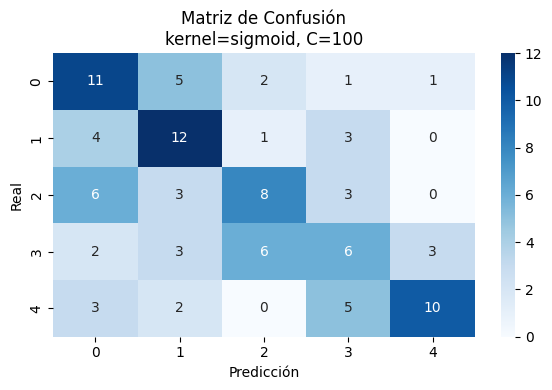

📊 Métricas promedio (5 folds):
Accuracy:  0.4200 ± 0.0482
Precision: 0.4427 ± 0.0540
Recall:    0.4200 ± 0.0482
F1-Score:  0.4214 ± 0.0478


In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Separar características y etiquetas
X = df_pca.drop(columns=['label']).values
y = df_pca['label'].values

# 2. Configurar validación cruzada estratificada
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 3. Valores a evaluar
valores_C = [0.1, 1, 10, 100]
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

# 4. Evaluar cada combinación
for kernel in kernels:
    for C_val in valores_C:
        print(f"\n🔍 Evaluando SVM con kernel='{kernel}' y C={C_val}")

        clf = SVC(kernel=kernel, C=C_val, gamma='scale')

        accuracies, precisions, recalls, f1_scores = [], [], [], []
        fold_predictions, fold_truths = [], []

        for fold, (train_idx, test_idx) in enumerate(skf.split(X, y)):
            X_train, X_test = X[train_idx], X[test_idx]
            y_train, y_test = y[train_idx], y[test_idx]

            clf.fit(X_train, y_train)
            y_pred = clf.predict(X_test)

            accuracies.append(accuracy_score(y_test, y_pred))
            precisions.append(precision_score(y_test, y_pred, average='weighted', zero_division=0))
            recalls.append(recall_score(y_test, y_pred, average='weighted'))
            f1_scores.append(f1_score(y_test, y_pred, average='weighted'))

            fold_predictions.append(y_pred)
            fold_truths.append(y_test)

        # Mejor fold (por accuracy)
        best_fold_idx = np.argmax(accuracies)
        best_pred = fold_predictions[best_fold_idx]
        best_true = fold_truths[best_fold_idx]

        print(f"\n✅ Mejor Fold: #{best_fold_idx + 1}")
        print("Reporte de clasificación:")
        print(classification_report(best_true, best_pred))

        cm = confusion_matrix(best_true, best_pred)
        plt.figure(figsize=(6, 4))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Matriz de Confusión\nkernel={kernel}, C={C_val}')
        plt.xlabel('Predicción')
        plt.ylabel('Real')
        plt.tight_layout()
        plt.show()

        # Promedio general
        print("📊 Métricas promedio (5 folds):")
        print(f"Accuracy:  {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
        print(f"Precision: {np.mean(precisions):.4f} ± {np.std(precisions):.4f}")
        print(f"Recall:    {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")
        print(f"F1-Score:  {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")




## SFFS ➝ SVM


🔍 Evaluando SVM con kernel='linear' y C=0.1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.42      0.47      0.44        30
   1Doubtful       0.39      0.43      0.41        30
       2Mild       0.37      0.37      0.37        30
   3Moderate       0.56      0.47      0.51        30
     4Severe       0.45      0.43      0.44        30

    accuracy                           0.43       150
   macro avg       0.44      0.43      0.43       150
weighted avg       0.44      0.43      0.43       150



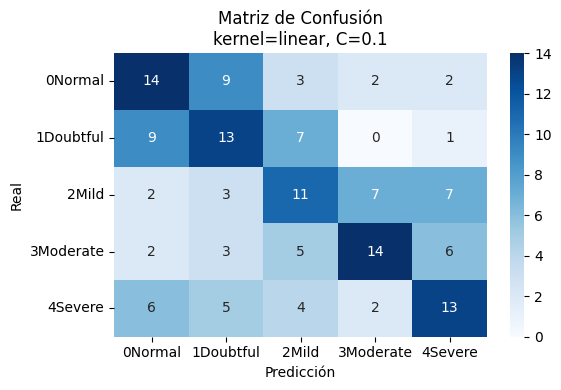


🔍 Evaluando SVM con kernel='linear' y C=1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.26      0.33      0.29        30
   1Doubtful       0.34      0.33      0.34        30
       2Mild       0.31      0.30      0.31        30
   3Moderate       0.48      0.40      0.44        30
     4Severe       0.34      0.33      0.34        30

    accuracy                           0.34       150
   macro avg       0.35      0.34      0.34       150
weighted avg       0.35      0.34      0.34       150



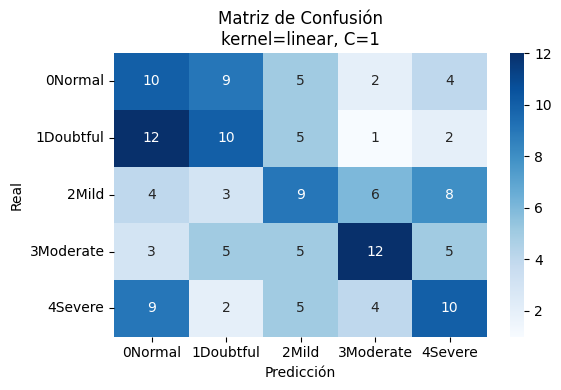


🔍 Evaluando SVM con kernel='linear' y C=10
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.29      0.37      0.32        30
   1Doubtful       0.37      0.33      0.35        30
       2Mild       0.30      0.30      0.30        30
   3Moderate       0.48      0.40      0.44        30
     4Severe       0.33      0.33      0.33        30

    accuracy                           0.35       150
   macro avg       0.35      0.35      0.35       150
weighted avg       0.35      0.35      0.35       150



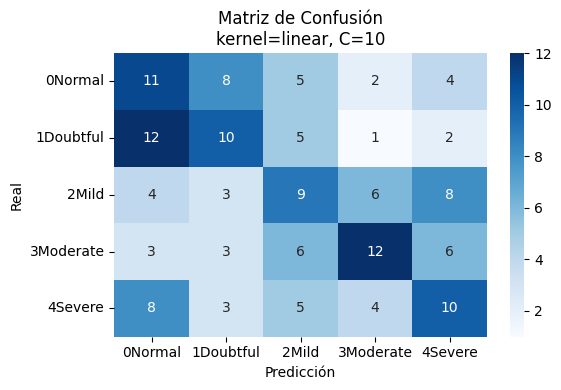


🔍 Evaluando SVM con kernel='linear' y C=100
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.29      0.37      0.32        30
   1Doubtful       0.37      0.33      0.35        30
       2Mild       0.30      0.30      0.30        30
   3Moderate       0.48      0.40      0.44        30
     4Severe       0.33      0.33      0.33        30

    accuracy                           0.35       150
   macro avg       0.35      0.35      0.35       150
weighted avg       0.35      0.35      0.35       150



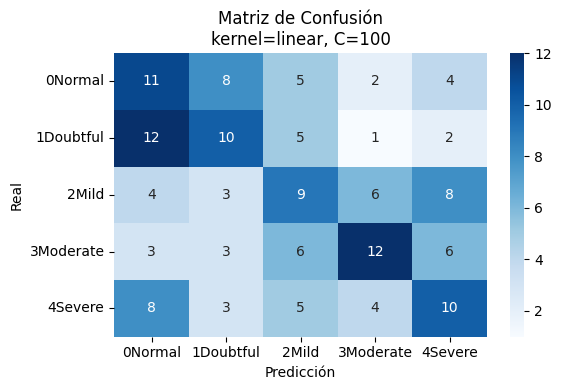


🔍 Evaluando SVM con kernel='rbf' y C=0.1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.40      0.57      0.47        30
   1Doubtful       0.38      0.43      0.41        30
       2Mild       0.21      0.10      0.14        30
   3Moderate       0.47      0.47      0.47        30
     4Severe       0.31      0.30      0.31        30

    accuracy                           0.37       150
   macro avg       0.35      0.37      0.36       150
weighted avg       0.35      0.37      0.36       150



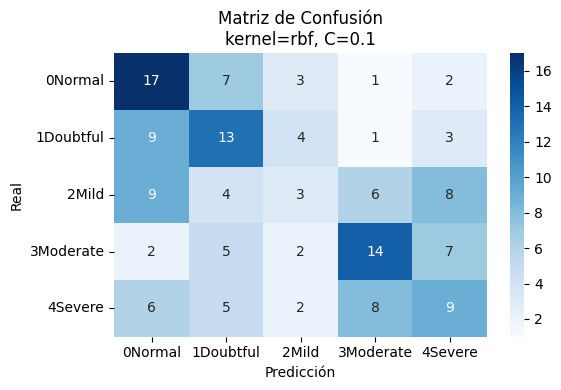


🔍 Evaluando SVM con kernel='rbf' y C=1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.48      0.50      0.49        30
   1Doubtful       0.42      0.47      0.44        30
       2Mild       0.35      0.20      0.26        30
   3Moderate       0.62      0.60      0.61        30
     4Severe       0.40      0.53      0.46        30

    accuracy                           0.46       150
   macro avg       0.46      0.46      0.45       150
weighted avg       0.46      0.46      0.45       150



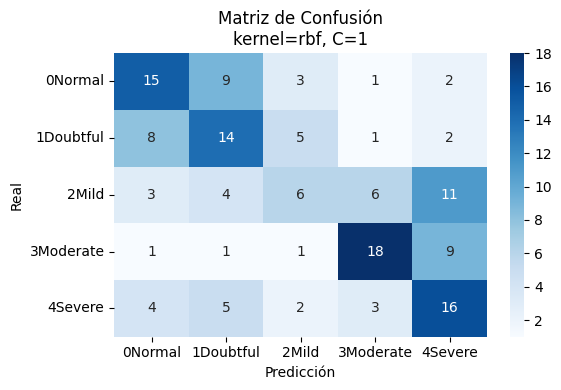


🔍 Evaluando SVM con kernel='rbf' y C=10
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.44      0.50      0.47        30
   1Doubtful       0.45      0.43      0.44        30
       2Mild       0.44      0.27      0.33        30
   3Moderate       0.58      0.60      0.59        30
     4Severe       0.45      0.57      0.50        30

    accuracy                           0.47       150
   macro avg       0.47      0.47      0.47       150
weighted avg       0.47      0.47      0.47       150



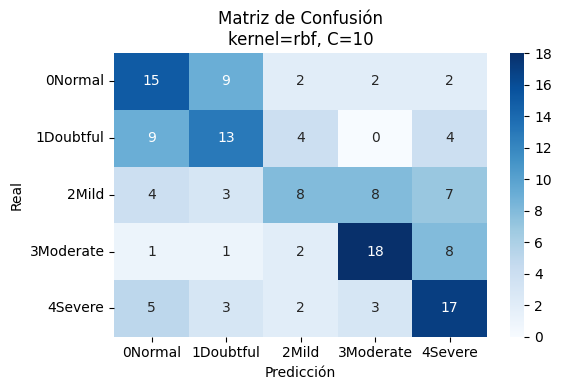


🔍 Evaluando SVM con kernel='rbf' y C=100
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.44      0.50      0.47        30
   1Doubtful       0.45      0.43      0.44        30
       2Mild       0.44      0.27      0.33        30
   3Moderate       0.58      0.60      0.59        30
     4Severe       0.45      0.57      0.50        30

    accuracy                           0.47       150
   macro avg       0.47      0.47      0.47       150
weighted avg       0.47      0.47      0.47       150



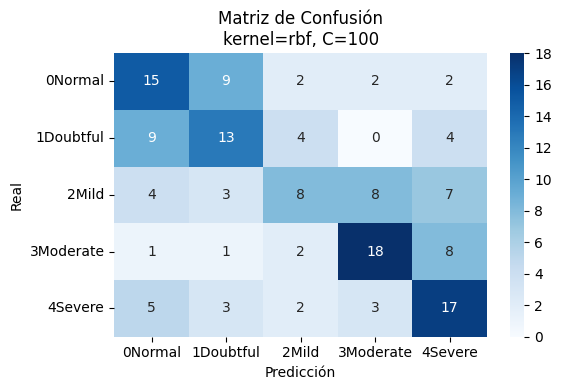


🔍 Evaluando SVM con kernel='poly' y C=0.1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.00      0.00      0.00        30
   1Doubtful       0.00      0.00      0.00        30
       2Mild       0.00      0.00      0.00        30
   3Moderate       0.67      0.13      0.22        30
     4Severe       0.20      0.97      0.33        30

    accuracy                           0.22       150
   macro avg       0.17      0.22      0.11       150
weighted avg       0.17      0.22      0.11       150



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


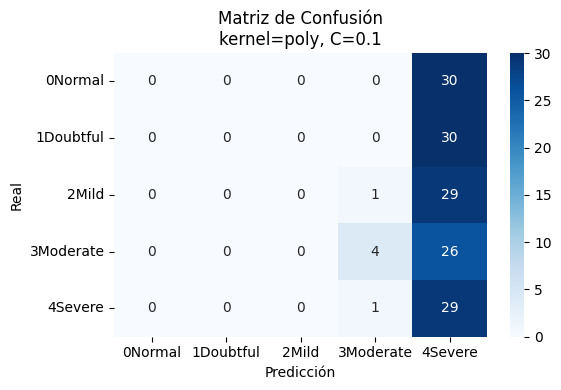


🔍 Evaluando SVM con kernel='poly' y C=1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.40      0.13      0.20        30
   1Doubtful       0.70      0.23      0.35        30
       2Mild       0.60      0.10      0.17        30
   3Moderate       0.75      0.30      0.43        30
     4Severe       0.24      0.90      0.38        30

    accuracy                           0.33       150
   macro avg       0.54      0.33      0.31       150
weighted avg       0.54      0.33      0.31       150



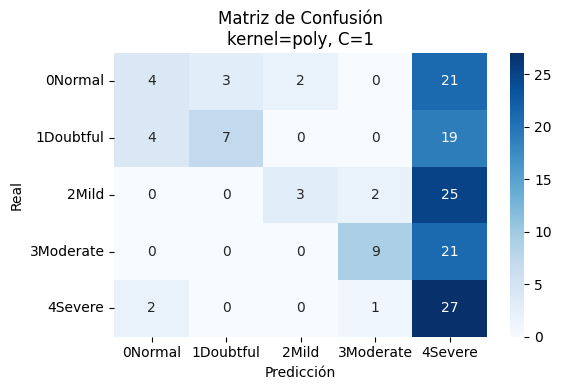


🔍 Evaluando SVM con kernel='poly' y C=10
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.47      0.23      0.31        30
   1Doubtful       0.65      0.37      0.47        30
       2Mild       0.44      0.13      0.21        30
   3Moderate       0.60      0.50      0.55        30
     4Severe       0.29      0.80      0.42        30

    accuracy                           0.41       150
   macro avg       0.49      0.41      0.39       150
weighted avg       0.49      0.41      0.39       150



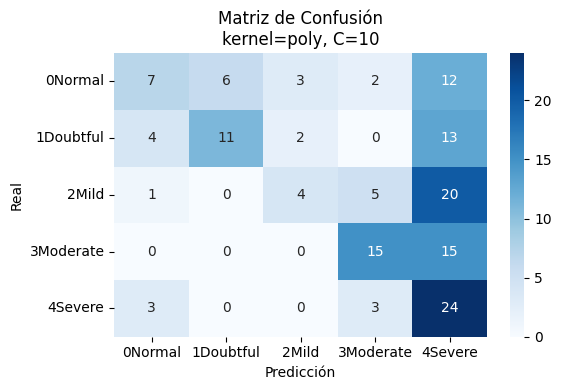


🔍 Evaluando SVM con kernel='poly' y C=100
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.47      0.23      0.31        30
   1Doubtful       0.65      0.37      0.47        30
       2Mild       0.40      0.13      0.20        30
   3Moderate       0.58      0.50      0.54        30
     4Severe       0.29      0.80      0.43        30

    accuracy                           0.41       150
   macro avg       0.48      0.41      0.39       150
weighted avg       0.48      0.41      0.39       150



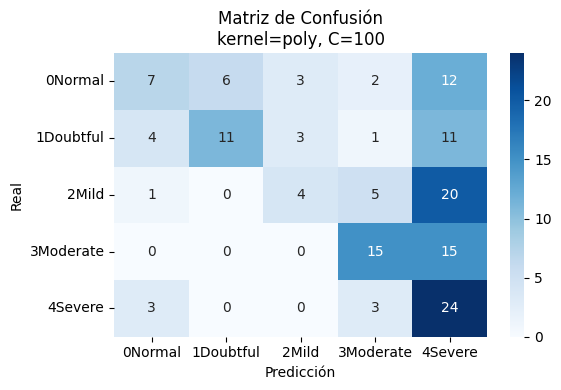


🔍 Evaluando SVM con kernel='sigmoid' y C=0.1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.35      0.50      0.41        30
   1Doubtful       0.44      0.47      0.45        30
       2Mild       0.38      0.40      0.39        30
   3Moderate       0.45      0.30      0.36        30
     4Severe       0.43      0.33      0.38        30

    accuracy                           0.40       150
   macro avg       0.41      0.40      0.40       150
weighted avg       0.41      0.40      0.40       150



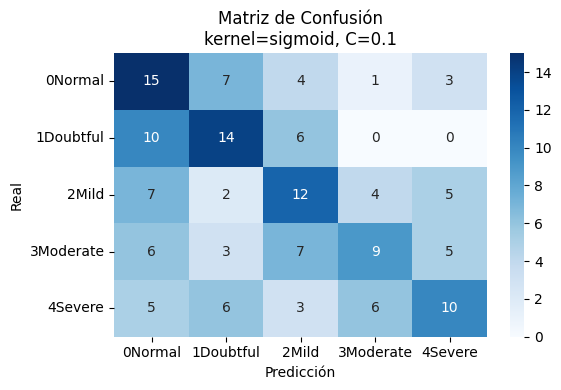


🔍 Evaluando SVM con kernel='sigmoid' y C=1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.41      0.37      0.39        30
   1Doubtful       0.44      0.50      0.47        30
       2Mild       0.29      0.30      0.30        30
   3Moderate       0.60      0.50      0.55        30
     4Severe       0.42      0.47      0.44        30

    accuracy                           0.43       150
   macro avg       0.43      0.43      0.43       150
weighted avg       0.43      0.43      0.43       150



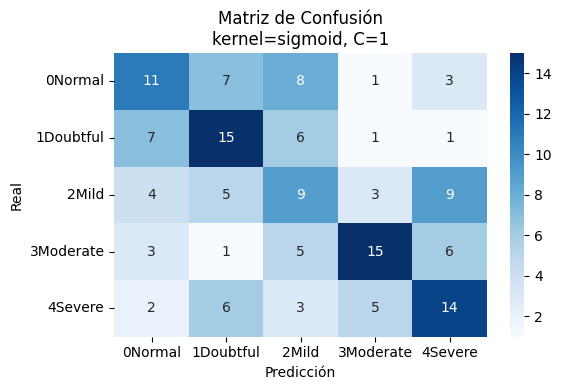


🔍 Evaluando SVM con kernel='sigmoid' y C=10
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.31      0.37      0.34        30
   1Doubtful       0.36      0.40      0.38        30
       2Mild       0.27      0.27      0.27        30
   3Moderate       0.46      0.37      0.41        30
     4Severe       0.32      0.30      0.31        30

    accuracy                           0.34       150
   macro avg       0.34      0.34      0.34       150
weighted avg       0.34      0.34      0.34       150



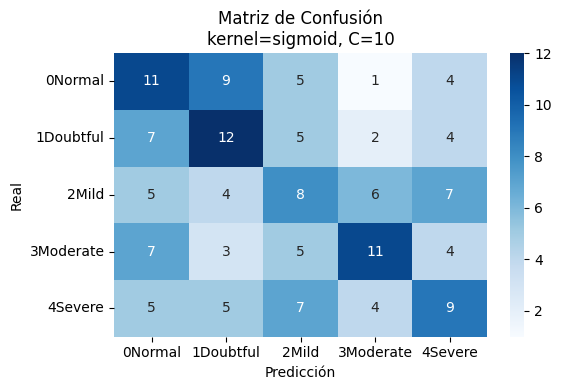


🔍 Evaluando SVM con kernel='sigmoid' y C=100
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.25      0.33      0.29        30
   1Doubtful       0.19      0.20      0.20        30
       2Mild       0.30      0.40      0.34        30
   3Moderate       0.43      0.20      0.27        30
     4Severe       0.36      0.30      0.33        30

    accuracy                           0.29       150
   macro avg       0.31      0.29      0.29       150
weighted avg       0.31      0.29      0.29       150



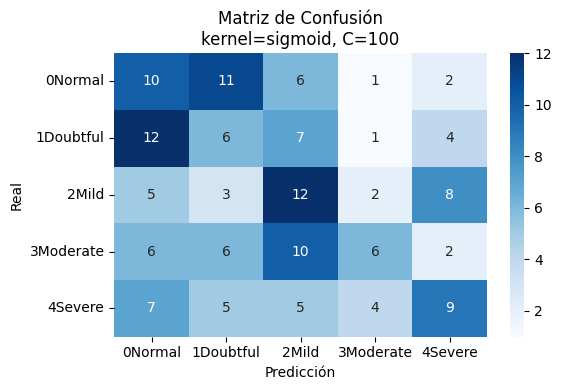

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Separar características y etiquetas
X = df_sffs.drop(columns=['label']).values
y = df_sffs['label'].values

# 2. Escalar
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. División entrenamiento/prueba
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, stratify=y, random_state=42)

# 4. Valores a probar
valores_C = [0.1, 1, 10, 100]
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

# 5. Evaluar todas las combinaciones
for kernel in kernels:
    for C_val in valores_C:
        print(f"\n🔍 Evaluando SVM con kernel='{kernel}' y C={C_val}")

        clf = SVC(kernel=kernel, C=C_val, gamma='scale')
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)

        # Reporte
        print("Reporte de clasificación:")
        print(classification_report(y_test, y_pred))

        # Matriz de confusión
        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(6, 4))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=clf.classes_,
                    yticklabels=clf.classes_)
        plt.title(f'Matriz de Confusión\nkernel={kernel}, C={C_val}')
        plt.xlabel('Predicción')
        plt.ylabel('Real')
        plt.tight_layout()
        plt.show()


## Con Stratified k-fold


🔍 Evaluando SVM con kernel='linear' y C=0.1

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.33      0.35      0.34        20
   1Doubtful       0.26      0.25      0.26        20
       2Mild       0.41      0.45      0.43        20
   3Moderate       0.65      0.75      0.70        20
     4Severe       0.60      0.45      0.51        20

    accuracy                           0.45       100
   macro avg       0.45      0.45      0.45       100
weighted avg       0.45      0.45      0.45       100



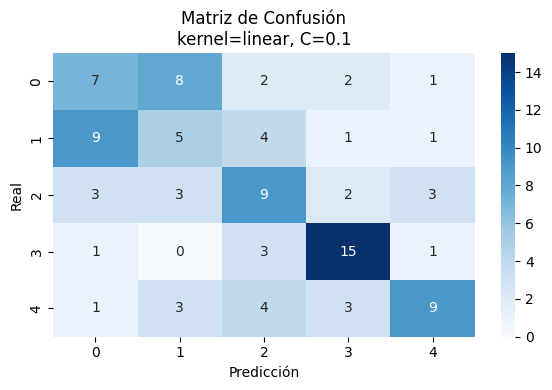

📊 Métricas promedio (5 folds):
Accuracy:  0.3840 ± 0.0476
Precision: 0.3919 ± 0.0436
Recall:    0.3840 ± 0.0476
F1-Score:  0.3837 ± 0.0459

🔍 Evaluando SVM con kernel='linear' y C=1

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.37      0.50      0.43        20
   1Doubtful       0.29      0.30      0.29        20
       2Mild       0.40      0.40      0.40        20
   3Moderate       0.57      0.60      0.59        20
     4Severe       0.55      0.30      0.39        20

    accuracy                           0.42       100
   macro avg       0.43      0.42      0.42       100
weighted avg       0.43      0.42      0.42       100



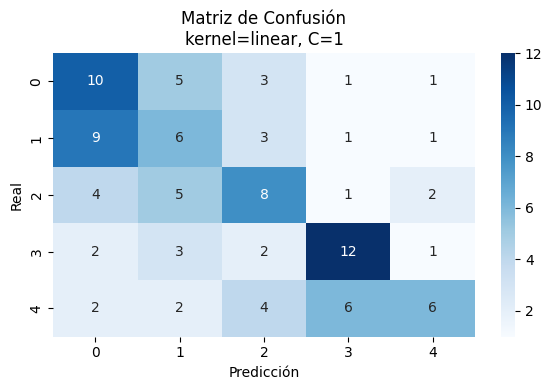

📊 Métricas promedio (5 folds):
Accuracy:  0.3580 ± 0.0371
Precision: 0.3639 ± 0.0404
Recall:    0.3580 ± 0.0371
F1-Score:  0.3541 ± 0.0391

🔍 Evaluando SVM con kernel='linear' y C=10

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.36      0.50      0.42        20
   1Doubtful       0.25      0.25      0.25        20
       2Mild       0.40      0.40      0.40        20
   3Moderate       0.57      0.60      0.59        20
     4Severe       0.55      0.30      0.39        20

    accuracy                           0.41       100
   macro avg       0.42      0.41      0.41       100
weighted avg       0.42      0.41      0.41       100



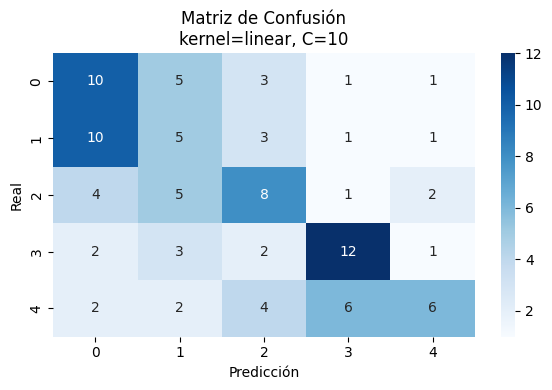

📊 Métricas promedio (5 folds):
Accuracy:  0.3700 ± 0.0316
Precision: 0.3762 ± 0.0397
Recall:    0.3700 ± 0.0316
F1-Score:  0.3652 ± 0.0368

🔍 Evaluando SVM con kernel='linear' y C=100

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.36      0.50      0.42        20
   1Doubtful       0.25      0.25      0.25        20
       2Mild       0.40      0.40      0.40        20
   3Moderate       0.57      0.60      0.59        20
     4Severe       0.55      0.30      0.39        20

    accuracy                           0.41       100
   macro avg       0.42      0.41      0.41       100
weighted avg       0.42      0.41      0.41       100



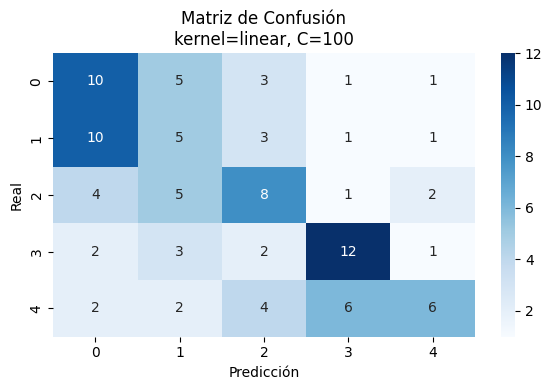

📊 Métricas promedio (5 folds):
Accuracy:  0.3700 ± 0.0316
Precision: 0.3762 ± 0.0397
Recall:    0.3700 ± 0.0316
F1-Score:  0.3652 ± 0.0368

🔍 Evaluando SVM con kernel='rbf' y C=0.1

✅ Mejor Fold: #4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.57      0.65      0.60        20
   1Doubtful       0.52      0.70      0.60        20
       2Mild       0.56      0.45      0.50        20
   3Moderate       0.38      0.40      0.39        20
     4Severe       0.46      0.30      0.36        20

    accuracy                           0.50       100
   macro avg       0.50      0.50      0.49       100
weighted avg       0.50      0.50      0.49       100



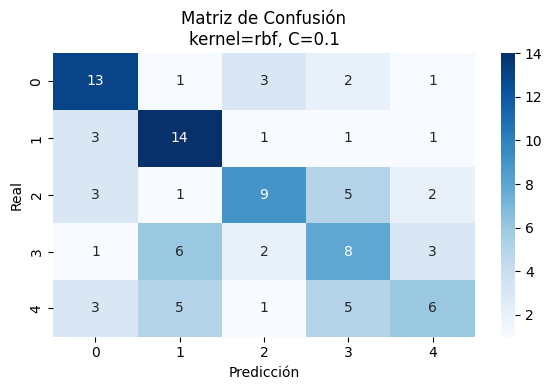

📊 Métricas promedio (5 folds):
Accuracy:  0.4380 ± 0.0492
Precision: 0.4544 ± 0.0637
Recall:    0.4380 ± 0.0492
F1-Score:  0.4346 ± 0.0481

🔍 Evaluando SVM con kernel='rbf' y C=1

✅ Mejor Fold: #4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.67      0.60      0.63        20
   1Doubtful       0.58      0.55      0.56        20
       2Mild       0.50      0.60      0.55        20
   3Moderate       0.63      0.60      0.62        20
     4Severe       0.50      0.50      0.50        20

    accuracy                           0.57       100
   macro avg       0.58      0.57      0.57       100
weighted avg       0.58      0.57      0.57       100



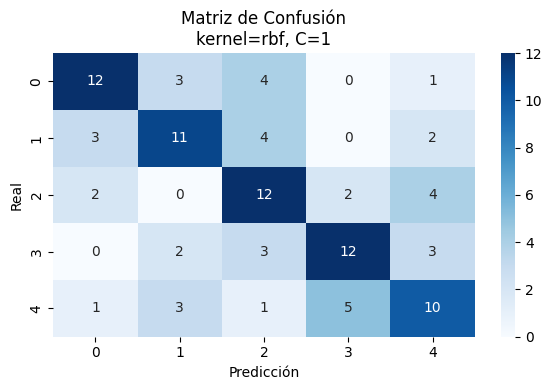

📊 Métricas promedio (5 folds):
Accuracy:  0.5020 ± 0.0560
Precision: 0.5088 ± 0.0639
Recall:    0.5020 ± 0.0560
F1-Score:  0.5016 ± 0.0593

🔍 Evaluando SVM con kernel='rbf' y C=10

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.43      0.50      0.47        20
   1Doubtful       0.45      0.50      0.48        20
       2Mild       0.58      0.55      0.56        20
   3Moderate       0.76      0.80      0.78        20
     4Severe       0.80      0.60      0.69        20

    accuracy                           0.59       100
   macro avg       0.61      0.59      0.59       100
weighted avg       0.61      0.59      0.59       100



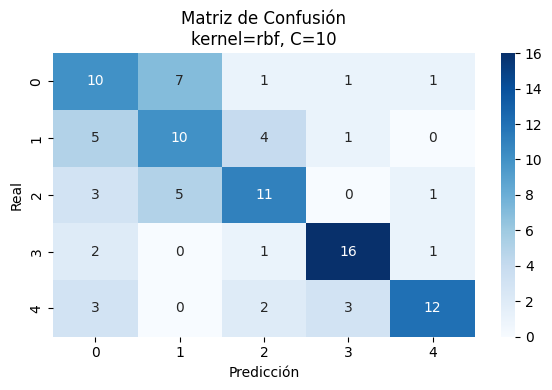

📊 Métricas promedio (5 folds):
Accuracy:  0.4880 ± 0.0643
Precision: 0.4899 ± 0.0668
Recall:    0.4880 ± 0.0643
F1-Score:  0.4838 ± 0.0652

🔍 Evaluando SVM con kernel='rbf' y C=100

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.43      0.50      0.47        20
   1Doubtful       0.45      0.50      0.48        20
       2Mild       0.58      0.55      0.56        20
   3Moderate       0.76      0.80      0.78        20
     4Severe       0.80      0.60      0.69        20

    accuracy                           0.59       100
   macro avg       0.61      0.59      0.59       100
weighted avg       0.61      0.59      0.59       100



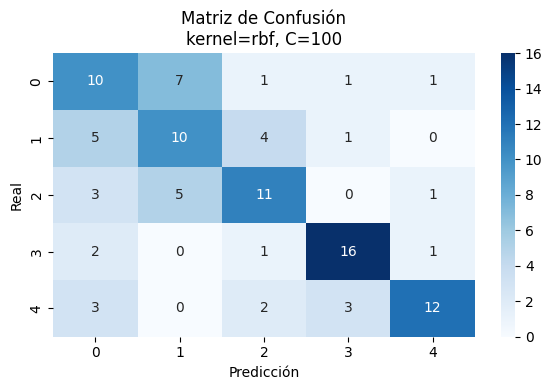

📊 Métricas promedio (5 folds):
Accuracy:  0.4880 ± 0.0643
Precision: 0.4899 ± 0.0668
Recall:    0.4880 ± 0.0643
F1-Score:  0.4838 ± 0.0652

🔍 Evaluando SVM con kernel='poly' y C=0.1

✅ Mejor Fold: #4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.67      0.10      0.17        20
   1Doubtful       1.00      0.05      0.10        20
       2Mild       1.00      0.05      0.10        20
   3Moderate       0.23      1.00      0.37        20
     4Severe       0.29      0.10      0.15        20

    accuracy                           0.26       100
   macro avg       0.64      0.26      0.18       100
weighted avg       0.64      0.26      0.18       100



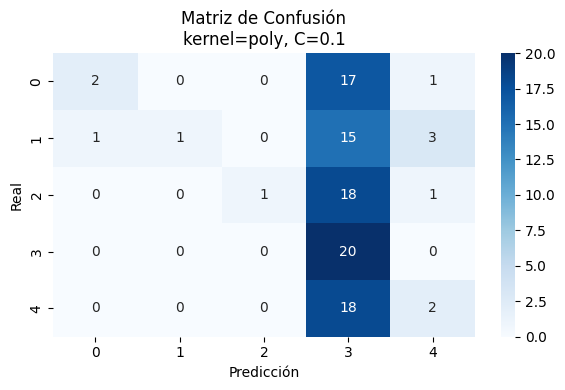

📊 Métricas promedio (5 folds):
Accuracy:  0.2280 ± 0.0194
Precision: 0.3933 ± 0.1825
Recall:    0.2280 ± 0.0194
F1-Score:  0.1224 ± 0.0328

🔍 Evaluando SVM con kernel='poly' y C=1

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.62      0.25      0.36        20
   1Doubtful       0.57      0.20      0.30        20
       2Mild       0.83      0.25      0.38        20
   3Moderate       0.88      0.35      0.50        20
     4Severe       0.25      0.90      0.40        20

    accuracy                           0.39       100
   macro avg       0.63      0.39      0.39       100
weighted avg       0.63      0.39      0.39       100



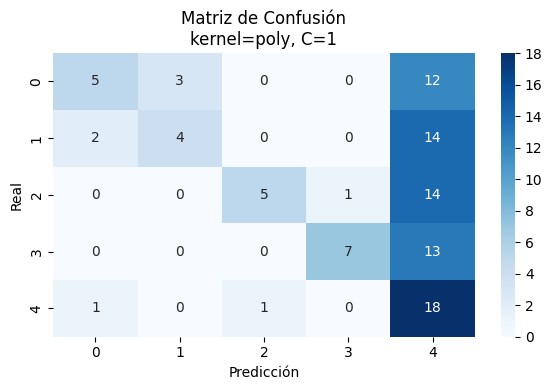

📊 Métricas promedio (5 folds):
Accuracy:  0.3360 ± 0.0280
Precision: 0.5710 ± 0.0847
Recall:    0.3360 ± 0.0280
F1-Score:  0.3075 ± 0.0408

🔍 Evaluando SVM con kernel='poly' y C=10

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.50      0.45      0.47        20
   1Doubtful       0.47      0.35      0.40        20
       2Mild       0.50      0.55      0.52        20
   3Moderate       0.54      0.75      0.62        20
     4Severe       0.76      0.65      0.70        20

    accuracy                           0.55       100
   macro avg       0.55      0.55      0.55       100
weighted avg       0.55      0.55      0.55       100



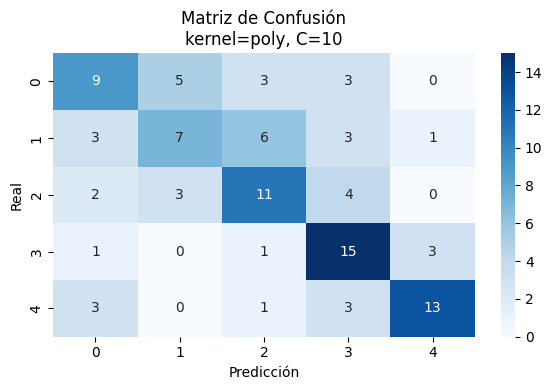

📊 Métricas promedio (5 folds):
Accuracy:  0.4480 ± 0.0531
Precision: 0.5021 ± 0.0348
Recall:    0.4480 ± 0.0531
F1-Score:  0.4385 ± 0.0545

🔍 Evaluando SVM con kernel='poly' y C=100

✅ Mejor Fold: #2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.47      0.45      0.46        20
   1Doubtful       0.50      0.35      0.41        20
       2Mild       0.42      0.55      0.48        20
   3Moderate       0.54      0.70      0.61        20
     4Severe       0.80      0.60      0.69        20

    accuracy                           0.53       100
   macro avg       0.55      0.53      0.53       100
weighted avg       0.55      0.53      0.53       100



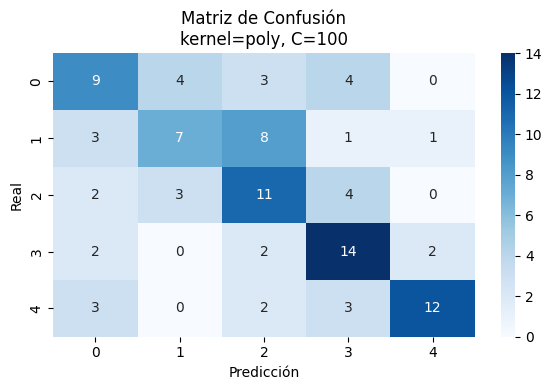

📊 Métricas promedio (5 folds):
Accuracy:  0.4640 ± 0.0383
Precision: 0.5105 ± 0.0234
Recall:    0.4640 ± 0.0383
F1-Score:  0.4544 ± 0.0414

🔍 Evaluando SVM con kernel='sigmoid' y C=0.1

✅ Mejor Fold: #4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.46      0.55      0.50        20
   1Doubtful       0.71      0.50      0.59        20
       2Mild       0.33      0.40      0.36        20
   3Moderate       0.45      0.45      0.45        20
     4Severe       0.50      0.45      0.47        20

    accuracy                           0.47       100
   macro avg       0.49      0.47      0.48       100
weighted avg       0.49      0.47      0.48       100



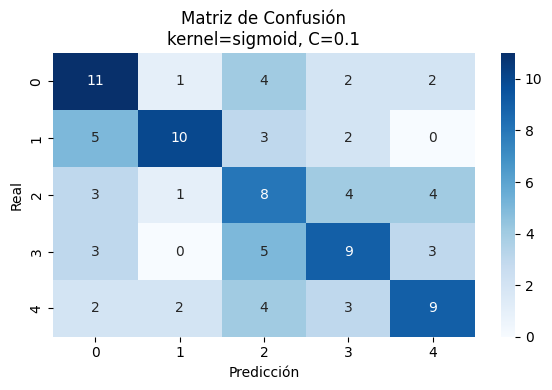

📊 Métricas promedio (5 folds):
Accuracy:  0.4000 ± 0.0639
Precision: 0.4305 ± 0.0493
Recall:    0.4000 ± 0.0639
F1-Score:  0.4034 ± 0.0610

🔍 Evaluando SVM con kernel='sigmoid' y C=1

✅ Mejor Fold: #4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.52      0.60      0.56        20
   1Doubtful       0.71      0.50      0.59        20
       2Mild       0.43      0.50      0.47        20
   3Moderate       0.68      0.75      0.71        20
     4Severe       0.50      0.45      0.47        20

    accuracy                           0.56       100
   macro avg       0.57      0.56      0.56       100
weighted avg       0.57      0.56      0.56       100



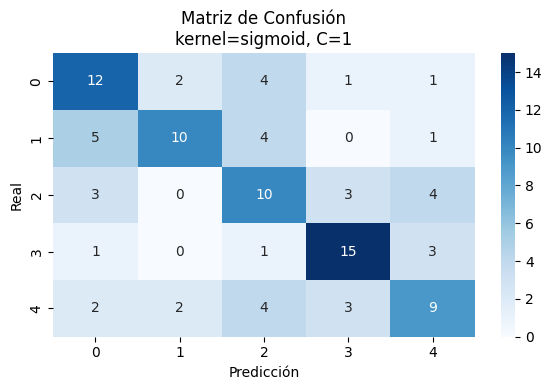

📊 Métricas promedio (5 folds):
Accuracy:  0.4600 ± 0.0583
Precision: 0.4780 ± 0.0642
Recall:    0.4600 ± 0.0583
F1-Score:  0.4633 ± 0.0589

🔍 Evaluando SVM con kernel='sigmoid' y C=10

✅ Mejor Fold: #4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.42      0.55      0.48        20
   1Doubtful       0.40      0.30      0.34        20
       2Mild       0.33      0.40      0.36        20
   3Moderate       0.63      0.60      0.62        20
     4Severe       0.44      0.35      0.39        20

    accuracy                           0.44       100
   macro avg       0.45      0.44      0.44       100
weighted avg       0.45      0.44      0.44       100



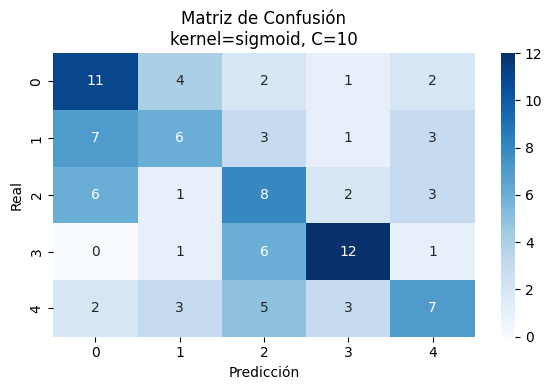

📊 Métricas promedio (5 folds):
Accuracy:  0.3660 ± 0.0436
Precision: 0.3729 ± 0.0429
Recall:    0.3660 ± 0.0436
F1-Score:  0.3630 ± 0.0442

🔍 Evaluando SVM con kernel='sigmoid' y C=100

✅ Mejor Fold: #4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.33      0.45      0.38        20
   1Doubtful       0.21      0.20      0.21        20
       2Mild       0.34      0.50      0.41        20
   3Moderate       0.92      0.55      0.69        20
     4Severe       0.38      0.25      0.30        20

    accuracy                           0.39       100
   macro avg       0.44      0.39      0.40       100
weighted avg       0.44      0.39      0.40       100



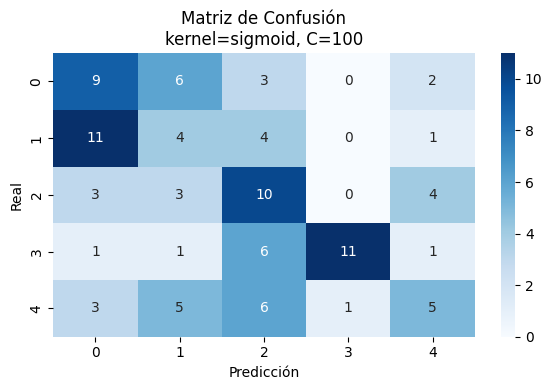

📊 Métricas promedio (5 folds):
Accuracy:  0.3500 ± 0.0346
Precision: 0.3756 ± 0.0443
Recall:    0.3500 ± 0.0346
F1-Score:  0.3510 ± 0.0377


In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Separar características y etiquetas
X = df_sffs.drop(columns=['label']).values
y = df_sffs['label'].values

# 2. Escalar características
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Configurar validación cruzada estratificada
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 4. Valores a probar
valores_C = [0.1, 1, 10, 100]
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

# 5. Evaluar todas las combinaciones
for kernel in kernels:
    for C_val in valores_C:
        print(f"\n🔍 Evaluando SVM con kernel='{kernel}' y C={C_val}")

        clf = SVC(kernel=kernel, C=C_val, gamma='scale')

        accuracies, precisions, recalls, f1_scores = [], [], [], []
        fold_predictions, fold_truths = [], []

        for fold, (train_idx, test_idx) in enumerate(skf.split(X_scaled, y)):
            X_train, X_test = X_scaled[train_idx], X_scaled[test_idx]
            y_train, y_test = y[train_idx], y[test_idx]

            clf.fit(X_train, y_train)
            y_pred = clf.predict(X_test)

            accuracies.append(accuracy_score(y_test, y_pred))
            precisions.append(precision_score(y_test, y_pred, average='weighted', zero_division=0))
            recalls.append(recall_score(y_test, y_pred, average='weighted'))
            f1_scores.append(f1_score(y_test, y_pred, average='weighted'))

            fold_predictions.append(y_pred)
            fold_truths.append(y_test)

        # Mejor fold (por accuracy)
        best_fold_idx = np.argmax(accuracies)
        best_pred = fold_predictions[best_fold_idx]
        best_true = fold_truths[best_fold_idx]

        print(f"\n✅ Mejor Fold: #{best_fold_idx + 1}")
        print("Reporte de clasificación:")
        print(classification_report(best_true, best_pred))

        cm = confusion_matrix(best_true, best_pred)
        plt.figure(figsize=(6, 4))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Matriz de Confusión\nkernel={kernel}, C={C_val}')
        plt.xlabel('Predicción')
        plt.ylabel('Real')
        plt.tight_layout()
        plt.show()

        # Promedio general
        print("📊 Métricas promedio (5 folds):")
        print(f"Accuracy:  {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
        print(f"Precision: {np.mean(precisions):.4f} ± {np.std(precisions):.4f}")
        print(f"Recall:    {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")
        print(f"F1-Score:  {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")


## SFFS ➝ LDA ➝ SVM


 Evaluando SVM con kernel='linear' y C=0.1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.50      0.40      0.44        20
   1Doubtful       0.76      0.80      0.78        20
       2Mild       0.61      0.70      0.65        20
   3Moderate       0.65      0.75      0.70        20
     4Severe       0.71      0.60      0.65        20

    accuracy                           0.65       100
   macro avg       0.65      0.65      0.64       100
weighted avg       0.65      0.65      0.64       100



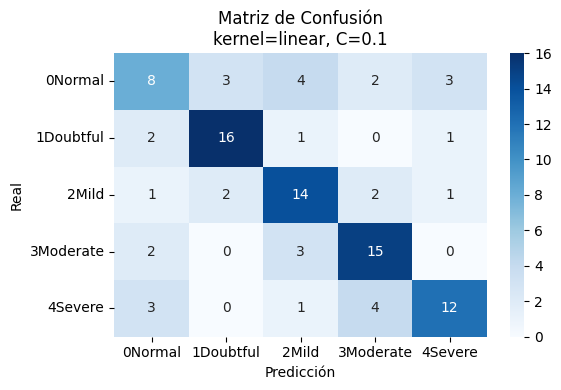


 Evaluando SVM con kernel='linear' y C=1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.47      0.40      0.43        20
   1Doubtful       0.73      0.80      0.76        20
       2Mild       0.57      0.65      0.60        20
   3Moderate       0.71      0.75      0.73        20
     4Severe       0.71      0.60      0.65        20

    accuracy                           0.64       100
   macro avg       0.64      0.64      0.64       100
weighted avg       0.64      0.64      0.64       100



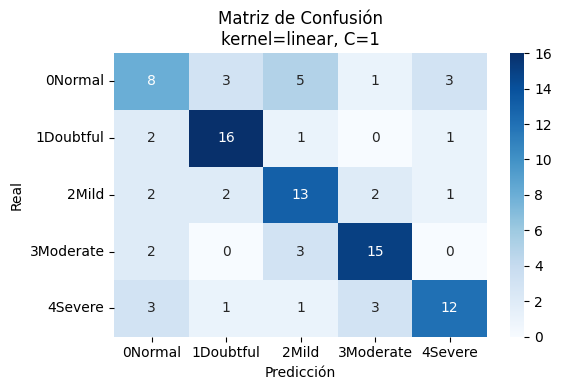


 Evaluando SVM con kernel='linear' y C=10
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.47      0.40      0.43        20
   1Doubtful       0.73      0.80      0.76        20
       2Mild       0.59      0.65      0.62        20
   3Moderate       0.71      0.75      0.73        20
     4Severe       0.67      0.60      0.63        20

    accuracy                           0.64       100
   macro avg       0.63      0.64      0.64       100
weighted avg       0.63      0.64      0.64       100



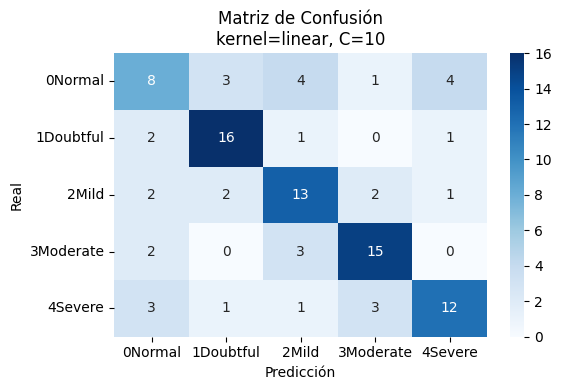


 Evaluando SVM con kernel='linear' y C=100
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.47      0.40      0.43        20
   1Doubtful       0.73      0.80      0.76        20
       2Mild       0.59      0.65      0.62        20
   3Moderate       0.71      0.75      0.73        20
     4Severe       0.67      0.60      0.63        20

    accuracy                           0.64       100
   macro avg       0.63      0.64      0.64       100
weighted avg       0.63      0.64      0.64       100



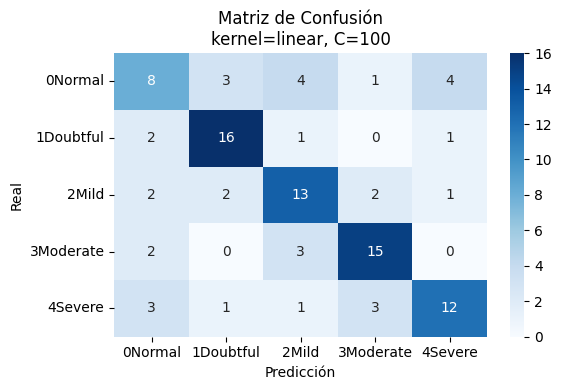


 Evaluando SVM con kernel='rbf' y C=0.1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.44      0.40      0.42        20
   1Doubtful       0.76      0.80      0.78        20
       2Mild       0.62      0.65      0.63        20
   3Moderate       0.67      0.70      0.68        20
     4Severe       0.68      0.65      0.67        20

    accuracy                           0.64       100
   macro avg       0.64      0.64      0.64       100
weighted avg       0.64      0.64      0.64       100



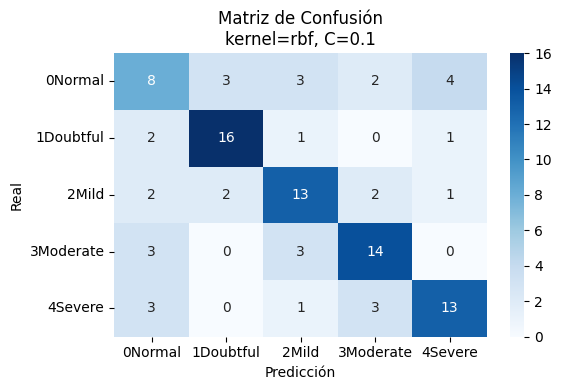


 Evaluando SVM con kernel='rbf' y C=1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.53      0.50      0.51        20
   1Doubtful       0.76      0.80      0.78        20
       2Mild       0.59      0.65      0.62        20
   3Moderate       0.68      0.75      0.71        20
     4Severe       0.75      0.60      0.67        20

    accuracy                           0.66       100
   macro avg       0.66      0.66      0.66       100
weighted avg       0.66      0.66      0.66       100



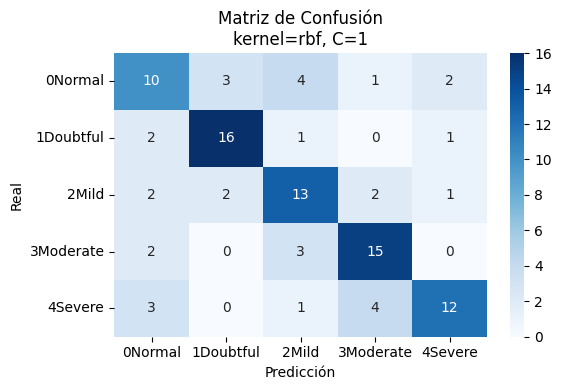


 Evaluando SVM con kernel='rbf' y C=10
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.48      0.55      0.51        20
   1Doubtful       0.79      0.75      0.77        20
       2Mild       0.63      0.60      0.62        20
   3Moderate       0.67      0.70      0.68        20
     4Severe       0.78      0.70      0.74        20

    accuracy                           0.66       100
   macro avg       0.67      0.66      0.66       100
weighted avg       0.67      0.66      0.66       100



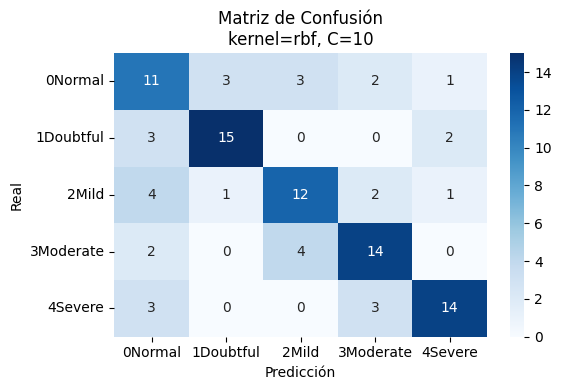


 Evaluando SVM con kernel='rbf' y C=100
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.48      0.65      0.55        20
   1Doubtful       0.75      0.60      0.67        20
       2Mild       0.63      0.60      0.62        20
   3Moderate       0.64      0.70      0.67        20
     4Severe       0.81      0.65      0.72        20

    accuracy                           0.64       100
   macro avg       0.66      0.64      0.64       100
weighted avg       0.66      0.64      0.64       100



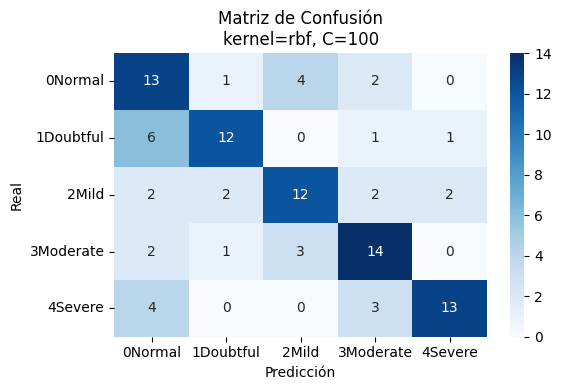


 Evaluando SVM con kernel='poly' y C=0.1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.56      0.50      0.53        20
   1Doubtful       0.94      0.75      0.83        20
       2Mild       0.45      0.85      0.59        20
   3Moderate       0.69      0.45      0.55        20
     4Severe       0.80      0.60      0.69        20

    accuracy                           0.63       100
   macro avg       0.69      0.63      0.64       100
weighted avg       0.69      0.63      0.64       100



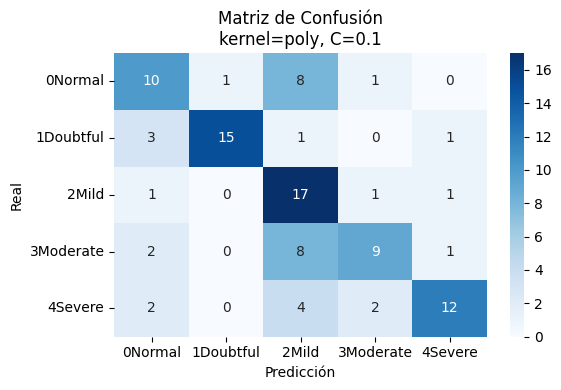


 Evaluando SVM con kernel='poly' y C=1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.56      0.45      0.50        20
   1Doubtful       0.79      0.75      0.77        20
       2Mild       0.52      0.85      0.64        20
   3Moderate       0.71      0.60      0.65        20
     4Severe       0.87      0.65      0.74        20

    accuracy                           0.66       100
   macro avg       0.69      0.66      0.66       100
weighted avg       0.69      0.66      0.66       100



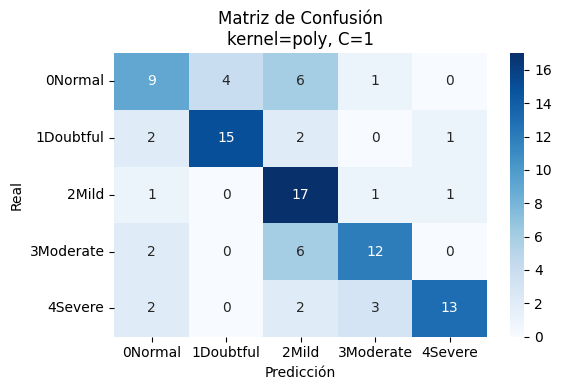


 Evaluando SVM con kernel='poly' y C=10
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.44      0.40      0.42        20
   1Doubtful       0.73      0.80      0.76        20
       2Mild       0.54      0.75      0.62        20
   3Moderate       0.75      0.60      0.67        20
     4Severe       0.81      0.65      0.72        20

    accuracy                           0.64       100
   macro avg       0.65      0.64      0.64       100
weighted avg       0.65      0.64      0.64       100



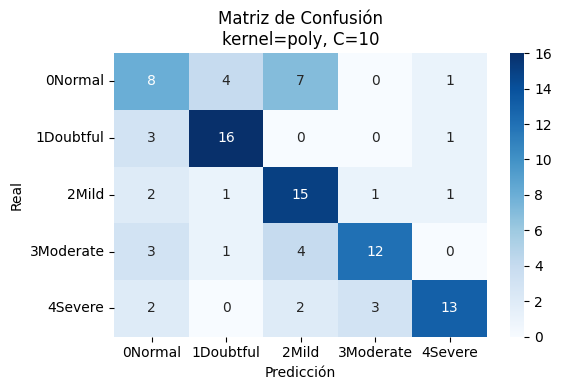


 Evaluando SVM con kernel='poly' y C=100
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.53      0.50      0.51        20
   1Doubtful       0.71      0.75      0.73        20
       2Mild       0.52      0.70      0.60        20
   3Moderate       0.61      0.55      0.58        20
     4Severe       0.87      0.65      0.74        20

    accuracy                           0.63       100
   macro avg       0.65      0.63      0.63       100
weighted avg       0.65      0.63      0.63       100



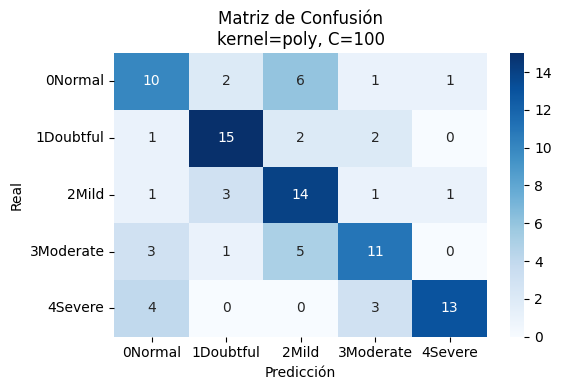


 Evaluando SVM con kernel='sigmoid' y C=0.1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.47      0.40      0.43        20
   1Doubtful       0.76      0.80      0.78        20
       2Mild       0.67      0.70      0.68        20
   3Moderate       0.67      0.70      0.68        20
     4Severe       0.65      0.65      0.65        20

    accuracy                           0.65       100
   macro avg       0.64      0.65      0.65       100
weighted avg       0.64      0.65      0.65       100



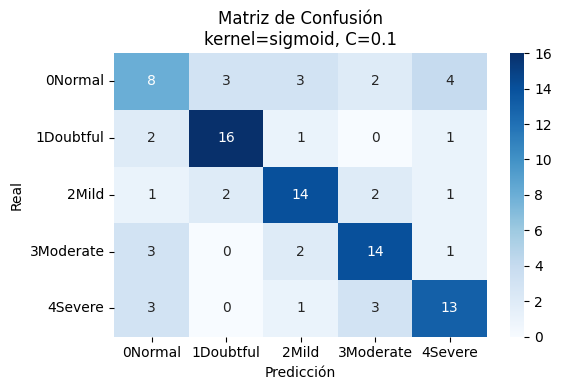


 Evaluando SVM con kernel='sigmoid' y C=1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.46      0.30      0.36        20
   1Doubtful       0.67      0.90      0.77        20
       2Mild       0.61      0.70      0.65        20
   3Moderate       0.68      0.65      0.67        20
     4Severe       0.67      0.60      0.63        20

    accuracy                           0.63       100
   macro avg       0.62      0.63      0.62       100
weighted avg       0.62      0.63      0.62       100



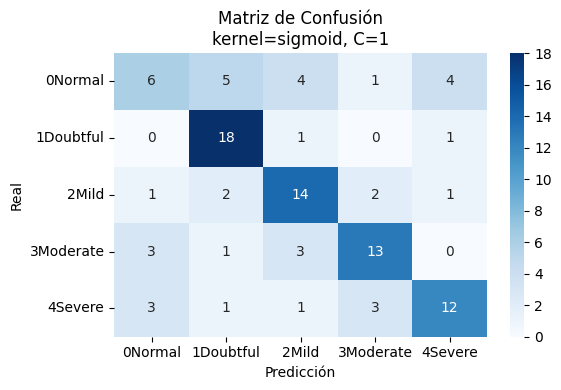


 Evaluando SVM con kernel='sigmoid' y C=10
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.50      0.30      0.38        20
   1Doubtful       0.62      0.75      0.68        20
       2Mild       0.50      0.65      0.57        20
   3Moderate       0.58      0.70      0.64        20
     4Severe       0.71      0.50      0.59        20

    accuracy                           0.58       100
   macro avg       0.58      0.58      0.57       100
weighted avg       0.58      0.58      0.57       100



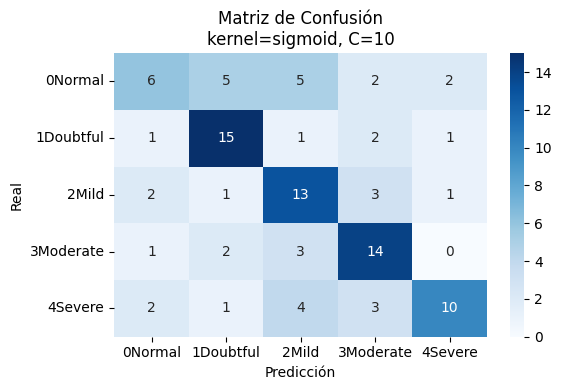


 Evaluando SVM con kernel='sigmoid' y C=100
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.33      0.40      0.36        20
   1Doubtful       0.65      0.85      0.74        20
       2Mild       0.43      0.45      0.44        20
   3Moderate       0.67      0.60      0.63        20
     4Severe       0.73      0.40      0.52        20

    accuracy                           0.54       100
   macro avg       0.56      0.54      0.54       100
weighted avg       0.56      0.54      0.54       100



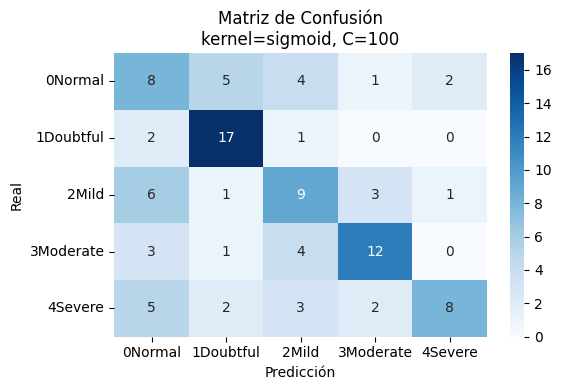

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Separar características y etiquetas desde df_lda
X = df_lda.drop(columns=['label']).values
y = df_lda['label'].values



# 2. División entrenamiento/prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# 3. Valores a probar
valores_C = [0.1, 1, 10, 100]
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

# 4. Evaluar todas las combinaciones
for kernel in kernels:
    for C_val in valores_C:
        print(f"\n Evaluando SVM con kernel='{kernel}' y C={C_val}")

        clf = SVC(kernel=kernel, C=C_val, gamma='scale')
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)

        # Reporte
        print("Reporte de clasificación:")
        print(classification_report(y_test, y_pred))

        # Matriz de confusión
        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(6, 4))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=clf.classes_,
                    yticklabels=clf.classes_)
        plt.title(f'Matriz de Confusión\nkernel={kernel}, C={C_val}')
        plt.xlabel('Predicción')
        plt.ylabel('Real')
        plt.tight_layout()
        plt.show()


## Cambiamos la estrategia de split de datos por Stratified K-fold


🔍 SVM con kernel='linear' y C=0.1

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.67      0.60      0.63        20
   1Doubtful       0.75      0.60      0.67        20
       2Mild       0.67      0.80      0.73        20
   3Moderate       0.86      0.90      0.88        20
     4Severe       0.86      0.90      0.88        20

    accuracy                           0.76       100
   macro avg       0.76      0.76      0.76       100
weighted avg       0.76      0.76      0.76       100



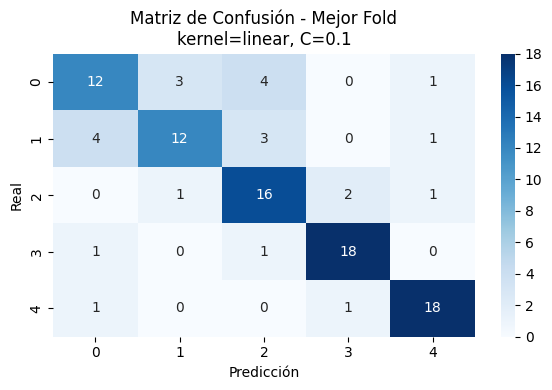

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6880 ± 0.0397
Precision: 0.6917 ± 0.0378
Recall:    0.6880 ± 0.0397
F1-Score:  0.6858 ± 0.0384

🔍 SVM con kernel='linear' y C=1

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.70      0.70      0.70        20
   1Doubtful       0.76      0.65      0.70        20
       2Mild       0.73      0.80      0.76        20
   3Moderate       0.86      0.90      0.88        20
     4Severe       0.90      0.90      0.90        20

    accuracy                           0.79       100
   macro avg       0.79      0.79      0.79       100
weighted avg       0.79      0.79      0.79       100



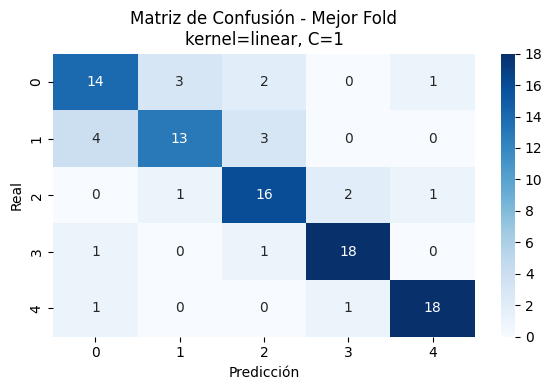

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6860 ± 0.0531
Precision: 0.6905 ± 0.0508
Recall:    0.6860 ± 0.0531
F1-Score:  0.6848 ± 0.0528

🔍 SVM con kernel='linear' y C=10

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.70      0.70      0.70        20
   1Doubtful       0.76      0.65      0.70        20
       2Mild       0.73      0.80      0.76        20
   3Moderate       0.86      0.90      0.88        20
     4Severe       0.90      0.90      0.90        20

    accuracy                           0.79       100
   macro avg       0.79      0.79      0.79       100
weighted avg       0.79      0.79      0.79       100



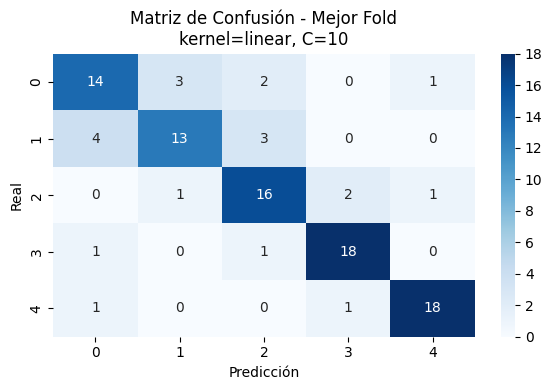

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6880 ± 0.0527
Precision: 0.6936 ± 0.0498
Recall:    0.6880 ± 0.0527
F1-Score:  0.6872 ± 0.0522

🔍 SVM con kernel='linear' y C=100

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.70      0.70      0.70        20
   1Doubtful       0.76      0.65      0.70        20
       2Mild       0.73      0.80      0.76        20
   3Moderate       0.86      0.90      0.88        20
     4Severe       0.90      0.90      0.90        20

    accuracy                           0.79       100
   macro avg       0.79      0.79      0.79       100
weighted avg       0.79      0.79      0.79       100



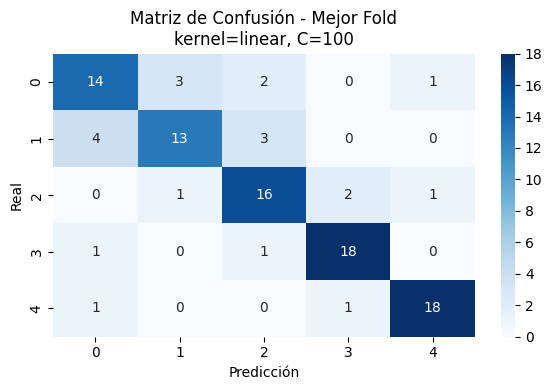

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6860 ± 0.0546
Precision: 0.6911 ± 0.0523
Recall:    0.6860 ± 0.0546
F1-Score:  0.6850 ± 0.0543

🔍 SVM con kernel='rbf' y C=0.1

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.65      0.65      0.65        20
   1Doubtful       0.75      0.60      0.67        20
       2Mild       0.73      0.80      0.76        20
   3Moderate       0.86      0.90      0.88        20
     4Severe       0.86      0.90      0.88        20

    accuracy                           0.77       100
   macro avg       0.77      0.77      0.77       100
weighted avg       0.77      0.77      0.77       100



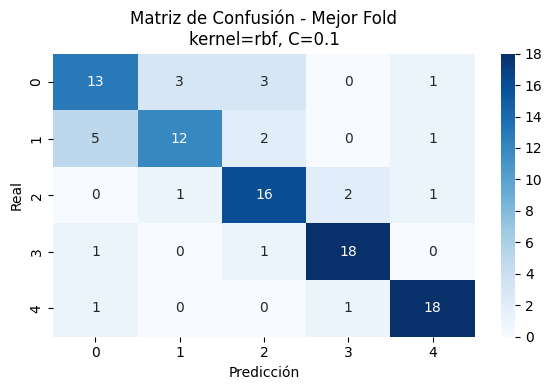

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6860 ± 0.0476
Precision: 0.6885 ± 0.0455
Recall:    0.6860 ± 0.0476
F1-Score:  0.6840 ± 0.0467

🔍 SVM con kernel='rbf' y C=1

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.62      0.65      0.63        20
   1Doubtful       0.71      0.60      0.65        20
       2Mild       0.75      0.75      0.75        20
   3Moderate       0.86      0.90      0.88        20
     4Severe       0.86      0.90      0.88        20

    accuracy                           0.76       100
   macro avg       0.76      0.76      0.76       100
weighted avg       0.76      0.76      0.76       100



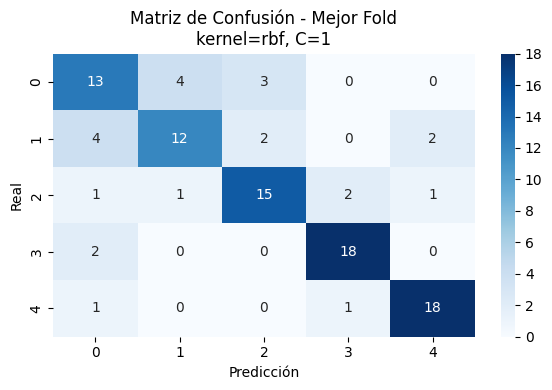

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6820 ± 0.0515
Precision: 0.6835 ± 0.0520
Recall:    0.6820 ± 0.0515
F1-Score:  0.6795 ± 0.0525

🔍 SVM con kernel='rbf' y C=10

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.57      0.65      0.60        20
   1Doubtful       0.65      0.55      0.59        20
       2Mild       0.74      0.70      0.72        20
   3Moderate       0.85      0.85      0.85        20
     4Severe       0.86      0.90      0.88        20

    accuracy                           0.73       100
   macro avg       0.73      0.73      0.73       100
weighted avg       0.73      0.73      0.73       100



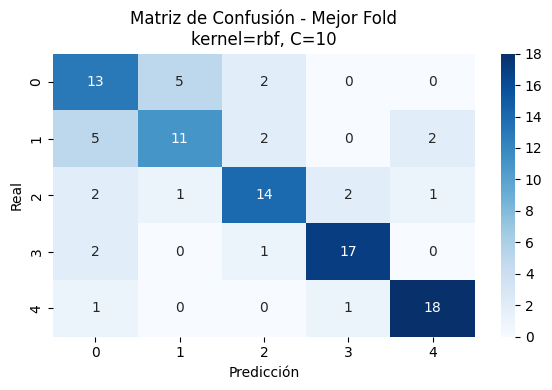

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6800 ± 0.0405
Precision: 0.6827 ± 0.0434
Recall:    0.6800 ± 0.0405
F1-Score:  0.6788 ± 0.0417

🔍 SVM con kernel='rbf' y C=100

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.44      0.80      0.57        20
   1Doubtful       0.71      0.50      0.59        20
       2Mild       0.77      0.50      0.61        20
   3Moderate       0.84      0.80      0.82        20
     4Severe       0.78      0.70      0.74        20

    accuracy                           0.66       100
   macro avg       0.71      0.66      0.66       100
weighted avg       0.71      0.66      0.66       100



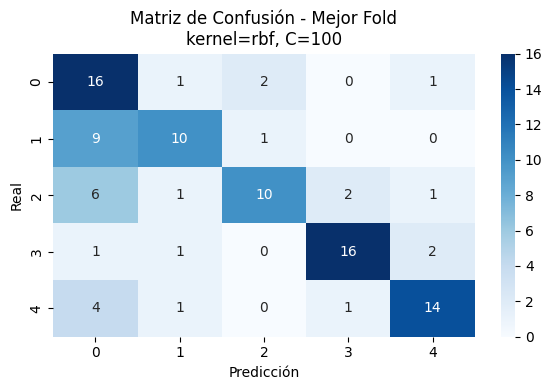

📊 Métricas promedio en los 5 folds:
Accuracy: 0.5700 ± 0.0477
Precision: 0.5819 ± 0.0661
Recall:    0.5700 ± 0.0477
F1-Score:  0.5697 ± 0.0503

🔍 SVM con kernel='poly' y C=0.1

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.57      0.85      0.68        20
   1Doubtful       1.00      0.55      0.71        20
       2Mild       0.62      0.80      0.70        20
   3Moderate       0.89      0.80      0.84        20
     4Severe       0.93      0.70      0.80        20

    accuracy                           0.74       100
   macro avg       0.80      0.74      0.75       100
weighted avg       0.80      0.74      0.75       100



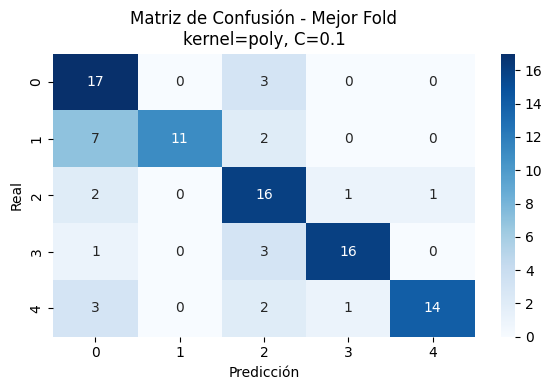

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6440 ± 0.0578
Precision: 0.7078 ± 0.0467
Recall:    0.6440 ± 0.0578
F1-Score:  0.6469 ± 0.0572

🔍 SVM con kernel='poly' y C=1

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.57      0.65      0.60        20
   1Doubtful       0.80      0.60      0.69        20
       2Mild       0.58      0.70      0.64        20
   3Moderate       0.81      0.85      0.83        20
     4Severe       0.94      0.80      0.86        20

    accuracy                           0.72       100
   macro avg       0.74      0.72      0.72       100
weighted avg       0.74      0.72      0.72       100



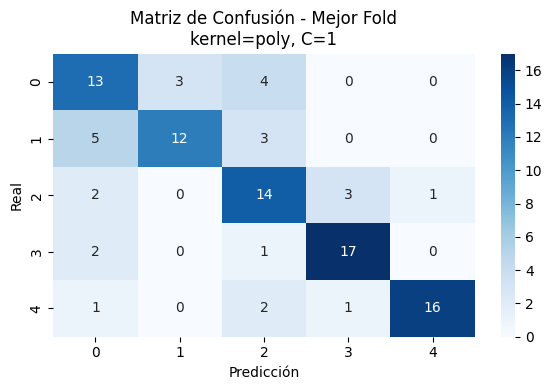

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6540 ± 0.0418
Precision: 0.6858 ± 0.0335
Recall:    0.6540 ± 0.0418
F1-Score:  0.6549 ± 0.0407

🔍 SVM con kernel='poly' y C=10

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.55      0.55      0.55        20
   1Doubtful       0.76      0.65      0.70        20
       2Mild       0.52      0.70      0.60        20
   3Moderate       0.85      0.85      0.85        20
     4Severe       0.94      0.75      0.83        20

    accuracy                           0.70       100
   macro avg       0.72      0.70      0.71       100
weighted avg       0.72      0.70      0.71       100



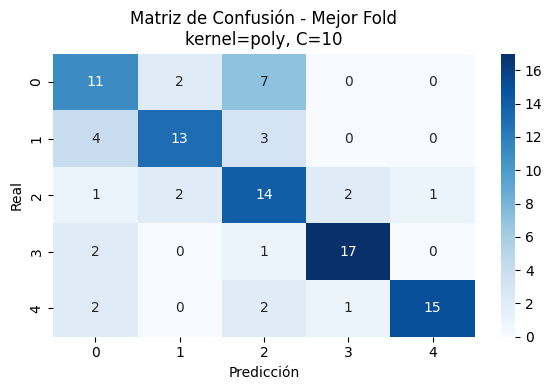

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6540 ± 0.0307
Precision: 0.6762 ± 0.0274
Recall:    0.6540 ± 0.0307
F1-Score:  0.6559 ± 0.0326

🔍 SVM con kernel='poly' y C=100

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.58      0.75      0.65        20
   1Doubtful       0.80      0.60      0.69        20
       2Mild       0.64      0.70      0.67        20
   3Moderate       0.80      0.80      0.80        20
     4Severe       0.94      0.80      0.86        20

    accuracy                           0.73       100
   macro avg       0.75      0.73      0.73       100
weighted avg       0.75      0.73      0.73       100



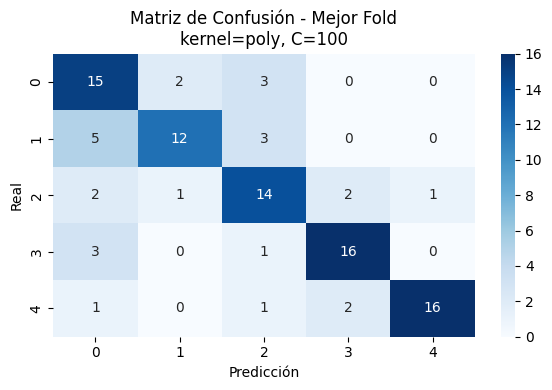

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6020 ± 0.0685
Precision: 0.6193 ± 0.0701
Recall:    0.6020 ± 0.0685
F1-Score:  0.6051 ± 0.0690

🔍 SVM con kernel='sigmoid' y C=0.1

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.62      0.65      0.63        20
   1Doubtful       0.76      0.65      0.70        20
       2Mild       0.75      0.75      0.75        20
   3Moderate       0.85      0.85      0.85        20
     4Severe       0.82      0.90      0.86        20

    accuracy                           0.76       100
   macro avg       0.76      0.76      0.76       100
weighted avg       0.76      0.76      0.76       100



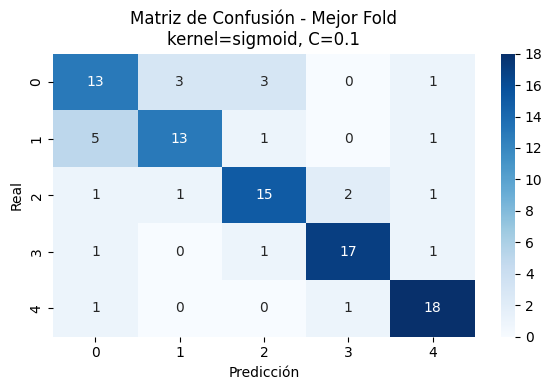

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6860 ± 0.0383
Precision: 0.6921 ± 0.0359
Recall:    0.6860 ± 0.0383
F1-Score:  0.6854 ± 0.0378

🔍 SVM con kernel='sigmoid' y C=1

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.52      0.60      0.56        20
   1Doubtful       0.64      0.70      0.67        20
       2Mild       0.71      0.60      0.65        20
   3Moderate       0.77      0.85      0.81        20
     4Severe       0.81      0.65      0.72        20

    accuracy                           0.68       100
   macro avg       0.69      0.68      0.68       100
weighted avg       0.69      0.68      0.68       100



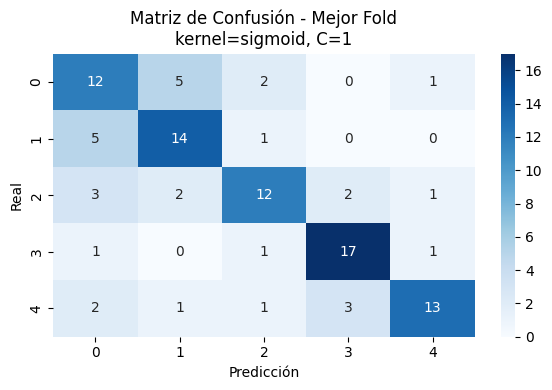

📊 Métricas promedio en los 5 folds:
Accuracy: 0.6460 ± 0.0265
Precision: 0.6538 ± 0.0287
Recall:    0.6460 ± 0.0265
F1-Score:  0.6455 ± 0.0264

🔍 SVM con kernel='sigmoid' y C=10

✅ Reporte del mejor fold (Fold #2):
              precision    recall  f1-score   support

     0Normal       0.42      0.50      0.45        20
   1Doubtful       0.53      0.50      0.51        20
       2Mild       0.57      0.65      0.60        20
   3Moderate       0.79      0.75      0.77        20
     4Severe       0.87      0.65      0.74        20

    accuracy                           0.61       100
   macro avg       0.63      0.61      0.62       100
weighted avg       0.63      0.61      0.62       100



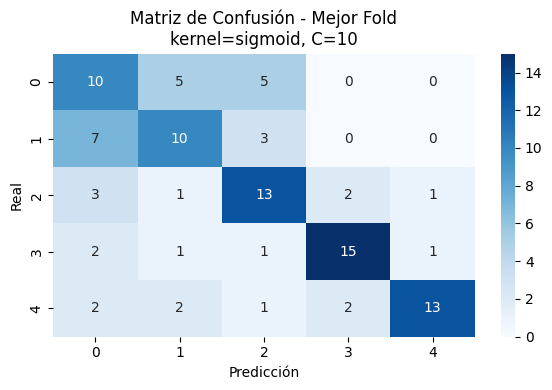

📊 Métricas promedio en los 5 folds:
Accuracy: 0.5700 ± 0.0329
Precision: 0.6000 ± 0.0308
Recall:    0.5700 ± 0.0329
F1-Score:  0.5725 ± 0.0323

🔍 SVM con kernel='sigmoid' y C=100

✅ Reporte del mejor fold (Fold #4):
              precision    recall  f1-score   support

     0Normal       0.44      0.60      0.51        20
   1Doubtful       0.73      0.55      0.63        20
       2Mild       0.50      0.75      0.60        20
   3Moderate       0.82      0.70      0.76        20
     4Severe       0.73      0.40      0.52        20

    accuracy                           0.60       100
   macro avg       0.65      0.60      0.60       100
weighted avg       0.65      0.60      0.60       100



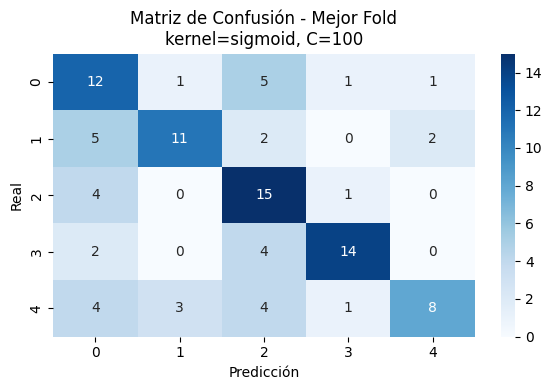

📊 Métricas promedio en los 5 folds:
Accuracy: 0.5680 ± 0.0248
Precision: 0.5966 ± 0.0320
Recall:    0.5680 ± 0.0248
F1-Score:  0.5680 ± 0.0255


In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Separar características y etiquetas desde tu DataFrame (por ejemplo df_lda)
X = df_lda.drop(columns=['label']).values
y = df_lda['label'].values

# 2. Configurar Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 3. Valores a probar
valores_C = [0.1, 1, 10, 100]
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

# 4. Evaluar combinaciones
for kernel in kernels:
    for C_val in valores_C:
        print(f"\n🔍 SVM con kernel='{kernel}' y C={C_val}")

        clf = SVC(kernel=kernel, C=C_val, gamma='scale')

        accuracies = []
        precisions = []
        recalls = []
        f1_scores = []
        fold_predictions = []
        fold_truths = []
        fold_indices = []

        # Ejecutar los 5 folds
        for fold, (train_index, test_index) in enumerate(skf.split(X, y)):
            X_train, X_test = X[train_index], X[test_index]
            y_train, y_test = y[train_index], y[test_index]

            # Normalizar
            scaler = StandardScaler()
            X_train_scaled = scaler.fit_transform(X_train)
            X_test_scaled = scaler.transform(X_test)

            # Entrenar
            clf.fit(X_train_scaled, y_train)
            y_pred = clf.predict(X_test_scaled)

            # Guardar métricas
            acc = accuracy_score(y_test, y_pred)
            prec = precision_score(y_test, y_pred, average='weighted', zero_division=0)
            rec = recall_score(y_test, y_pred, average='weighted')
            f1 = f1_score(y_test, y_pred, average='weighted')

            accuracies.append(acc)
            precisions.append(prec)
            recalls.append(rec)
            f1_scores.append(f1)
            fold_predictions.append(y_pred)
            fold_truths.append(y_test)
            fold_indices.append(fold)

        # Encontrar el mejor fold por accuracy
        best_fold_idx = np.argmax(accuracies)
        best_pred = fold_predictions[best_fold_idx]
        best_true = fold_truths[best_fold_idx]

        # Reporte y matriz de confusión del mejor fold
        print(f"\n✅ Reporte del mejor fold (Fold #{fold_indices[best_fold_idx] + 1}):")
        print(classification_report(best_true, best_pred))
        cm = confusion_matrix(best_true, best_pred)
        plt.figure(figsize=(6, 4))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Matriz de Confusión - Mejor Fold\nkernel={kernel}, C={C_val}')
        plt.xlabel('Predicción')
        plt.ylabel('Real')
        plt.tight_layout()
        plt.show()

        # Promedio y desviación de todas las métricas
        print("📊 Métricas promedio en los 5 folds:")
        print(f"Accuracy: {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
        print(f"Precision: {np.mean(precisions):.4f} ± {np.std(precisions):.4f}")
        print(f"Recall:    {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")
        print(f"F1-Score:  {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")



## SFFS ➝ PCA ➝ SVM
Para probar la diferencia entre LDA y PCA

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 1. Separar características y etiquetas
X = df_sffs.drop(columns=['label']).values
y = df_sffs['label'].values

# 2. Escalado (PCA requiere que los datos estén estandarizados)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Aplicar PCA
n_components = 10  # Puedes ajustar este número según lo que quieras conservar
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)

# 4. Crear nuevo DataFrame con componentes principales + etiqueta
columns_pca = [f'PC{i+1}' for i in range(X_pca.shape[1])]
df_pca = pd.DataFrame(X_pca, columns=columns_pca)
df_pca['label'] = y

# 5. Mostrar información del nuevo conjunto
print(f"Dimensiones del conjunto original (tras SFFS): {X.shape}")
print(f"Dimensiones después de PCA: {X_pca.shape}")
print("\nVarianza explicada por cada componente:")
for i, var in enumerate(pca.explained_variance_ratio_):
    print(f"PC{i+1}: {var:.4f}")




Dimensiones del conjunto original (tras SFFS): (500, 100)
Dimensiones después de PCA: (500, 10)

Varianza explicada por cada componente:
PC1: 0.1030
PC2: 0.0634
PC3: 0.0557
PC4: 0.0468
PC5: 0.0383
PC6: 0.0311
PC7: 0.0297
PC8: 0.0264
PC9: 0.0226
PC10: 0.0219



 Evaluando SVM con kernel='linear' y C=0.1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.39      0.43      0.41        30
   1Doubtful       0.55      0.40      0.46        30
       2Mild       0.38      0.40      0.39        30
   3Moderate       0.46      0.43      0.45        30
     4Severe       0.34      0.40      0.37        30

    accuracy                           0.41       150
   macro avg       0.42      0.41      0.42       150
weighted avg       0.42      0.41      0.42       150



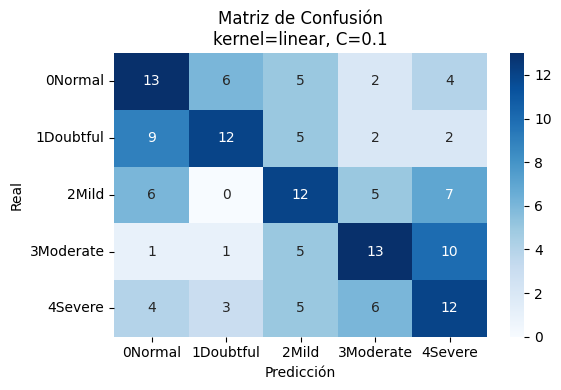


 Evaluando SVM con kernel='linear' y C=1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.41      0.43      0.42        30
   1Doubtful       0.57      0.43      0.49        30
       2Mild       0.33      0.37      0.35        30
   3Moderate       0.44      0.50      0.47        30
     4Severe       0.25      0.23      0.24        30

    accuracy                           0.39       150
   macro avg       0.40      0.39      0.39       150
weighted avg       0.40      0.39      0.39       150



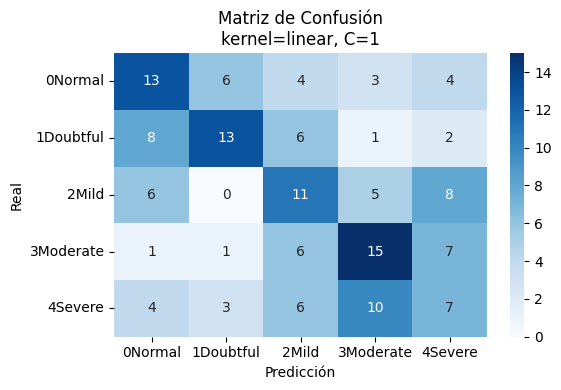


 Evaluando SVM con kernel='linear' y C=10
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.39      0.40      0.39        30
   1Doubtful       0.57      0.43      0.49        30
       2Mild       0.32      0.37      0.34        30
   3Moderate       0.44      0.50      0.47        30
     4Severe       0.25      0.23      0.24        30

    accuracy                           0.39       150
   macro avg       0.39      0.39      0.39       150
weighted avg       0.39      0.39      0.39       150



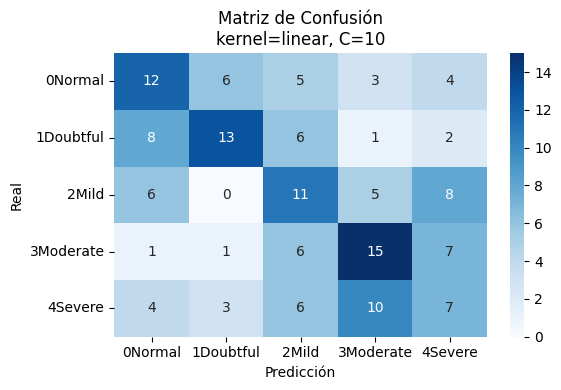


 Evaluando SVM con kernel='linear' y C=100
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.39      0.40      0.39        30
   1Doubtful       0.57      0.43      0.49        30
       2Mild       0.32      0.37      0.34        30
   3Moderate       0.44      0.50      0.47        30
     4Severe       0.25      0.23      0.24        30

    accuracy                           0.39       150
   macro avg       0.39      0.39      0.39       150
weighted avg       0.39      0.39      0.39       150



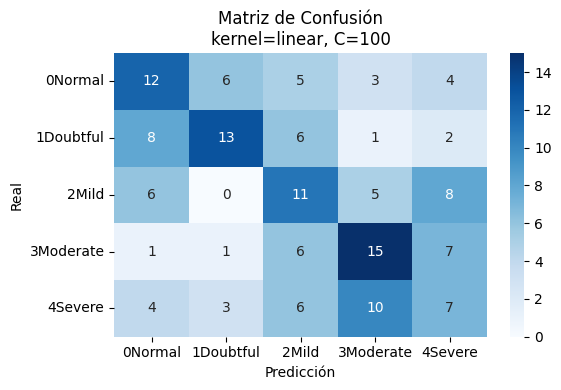


 Evaluando SVM con kernel='rbf' y C=0.1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.42      0.60      0.49        30
   1Doubtful       0.50      0.37      0.42        30
       2Mild       0.37      0.23      0.29        30
   3Moderate       0.36      0.43      0.39        30
     4Severe       0.30      0.30      0.30        30

    accuracy                           0.39       150
   macro avg       0.39      0.39      0.38       150
weighted avg       0.39      0.39      0.38       150



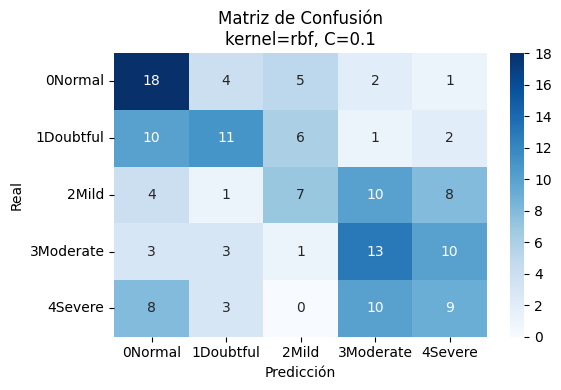


 Evaluando SVM con kernel='rbf' y C=1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.42      0.50      0.45        30
   1Doubtful       0.58      0.50      0.54        30
       2Mild       0.24      0.17      0.20        30
   3Moderate       0.39      0.37      0.38        30
     4Severe       0.36      0.47      0.41        30

    accuracy                           0.40       150
   macro avg       0.40      0.40      0.39       150
weighted avg       0.40      0.40      0.39       150



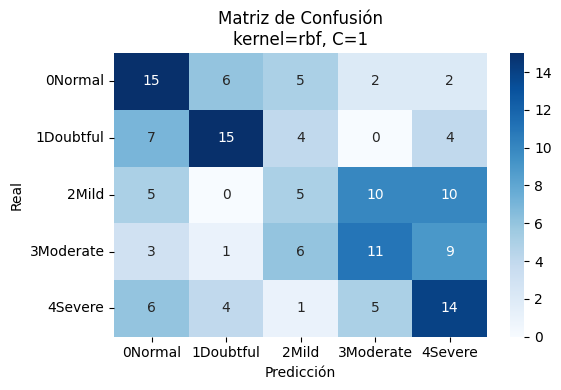


 Evaluando SVM con kernel='rbf' y C=10
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.44      0.53      0.48        30
   1Doubtful       0.56      0.50      0.53        30
       2Mild       0.24      0.23      0.24        30
   3Moderate       0.42      0.50      0.45        30
     4Severe       0.55      0.40      0.46        30

    accuracy                           0.43       150
   macro avg       0.44      0.43      0.43       150
weighted avg       0.44      0.43      0.43       150



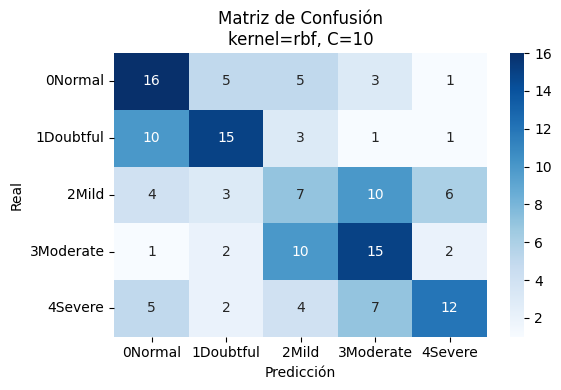


 Evaluando SVM con kernel='rbf' y C=100
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.44      0.47      0.45        30
   1Doubtful       0.53      0.57      0.55        30
       2Mild       0.25      0.23      0.24        30
   3Moderate       0.49      0.57      0.52        30
     4Severe       0.52      0.40      0.45        30

    accuracy                           0.45       150
   macro avg       0.45      0.45      0.44       150
weighted avg       0.45      0.45      0.44       150



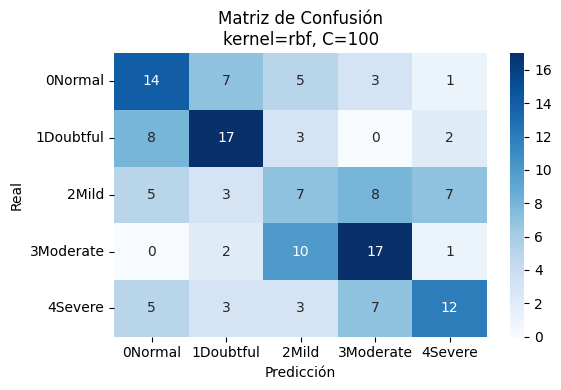


 Evaluando SVM con kernel='poly' y C=0.1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.54      0.23      0.33        30
   1Doubtful       0.71      0.50      0.59        30
       2Mild       0.00      0.00      0.00        30
   3Moderate       0.60      0.10      0.17        30
     4Severe       0.24      0.87      0.37        30

    accuracy                           0.34       150
   macro avg       0.42      0.34      0.29       150
weighted avg       0.42      0.34      0.29       150



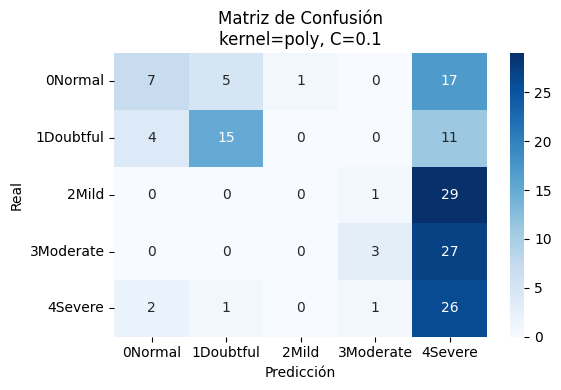


 Evaluando SVM con kernel='poly' y C=1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.35      0.27      0.30        30
   1Doubtful       0.68      0.43      0.53        30
       2Mild       0.21      0.10      0.14        30
   3Moderate       0.38      0.33      0.36        30
     4Severe       0.32      0.73      0.45        30

    accuracy                           0.37       150
   macro avg       0.39      0.37      0.35       150
weighted avg       0.39      0.37      0.35       150



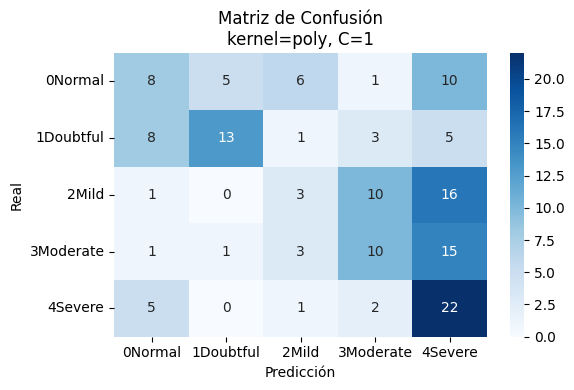


 Evaluando SVM con kernel='poly' y C=10
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.38      0.40      0.39        30
   1Doubtful       0.46      0.37      0.41        30
       2Mild       0.19      0.10      0.13        30
   3Moderate       0.38      0.33      0.36        30
     4Severe       0.37      0.63      0.46        30

    accuracy                           0.37       150
   macro avg       0.35      0.37      0.35       150
weighted avg       0.35      0.37      0.35       150



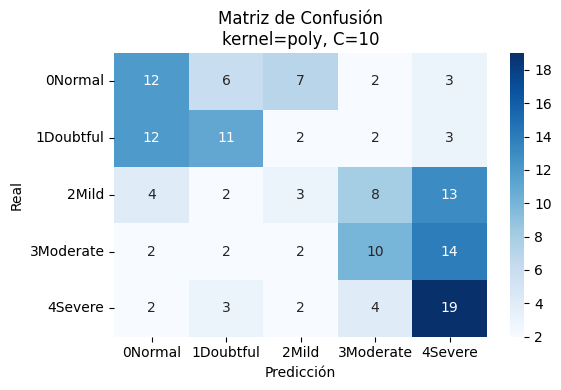


 Evaluando SVM con kernel='poly' y C=100
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.39      0.47      0.42        30
   1Doubtful       0.50      0.30      0.38        30
       2Mild       0.25      0.20      0.22        30
   3Moderate       0.38      0.50      0.43        30
     4Severe       0.41      0.43      0.42        30

    accuracy                           0.38       150
   macro avg       0.38      0.38      0.37       150
weighted avg       0.38      0.38      0.37       150



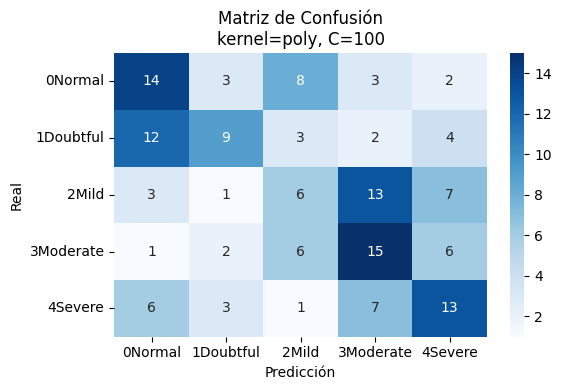


 Evaluando SVM con kernel='sigmoid' y C=0.1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.38      0.50      0.43        30
   1Doubtful       0.55      0.40      0.46        30
       2Mild       0.29      0.33      0.31        30
   3Moderate       0.48      0.40      0.44        30
     4Severe       0.38      0.37      0.37        30

    accuracy                           0.40       150
   macro avg       0.41      0.40      0.40       150
weighted avg       0.41      0.40      0.40       150



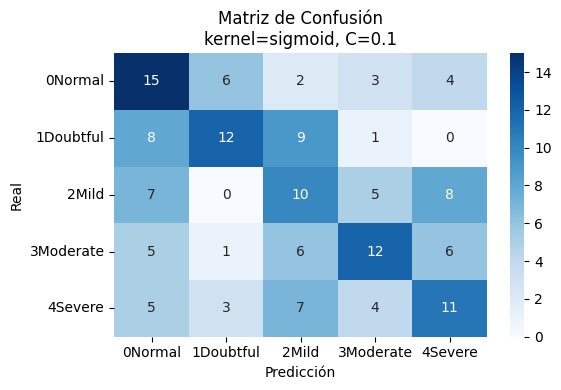


 Evaluando SVM con kernel='sigmoid' y C=1
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.34      0.40      0.37        30
   1Doubtful       0.60      0.40      0.48        30
       2Mild       0.31      0.37      0.34        30
   3Moderate       0.41      0.40      0.41        30
     4Severe       0.42      0.43      0.43        30

    accuracy                           0.40       150
   macro avg       0.42      0.40      0.40       150
weighted avg       0.42      0.40      0.40       150



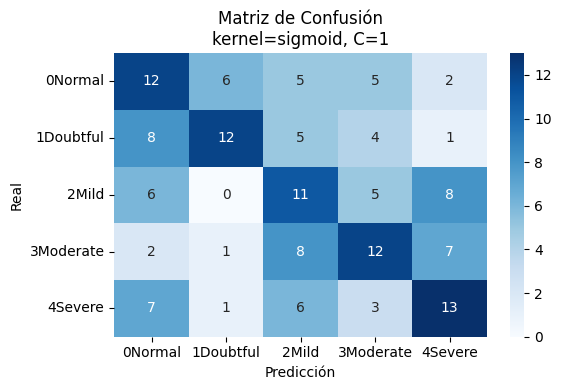


 Evaluando SVM con kernel='sigmoid' y C=10
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.24      0.23      0.24        30
   1Doubtful       0.29      0.23      0.26        30
       2Mild       0.23      0.37      0.28        30
   3Moderate       0.35      0.27      0.30        30
     4Severe       0.27      0.23      0.25        30

    accuracy                           0.27       150
   macro avg       0.28      0.27      0.27       150
weighted avg       0.28      0.27      0.27       150



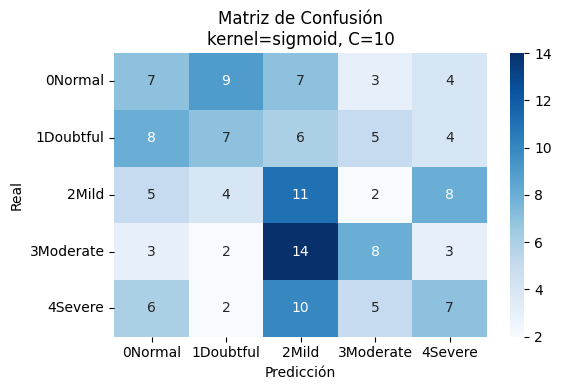


 Evaluando SVM con kernel='sigmoid' y C=100
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.17      0.17      0.17        30
   1Doubtful       0.25      0.20      0.22        30
       2Mild       0.25      0.43      0.31        30
   3Moderate       0.33      0.23      0.27        30
     4Severe       0.30      0.23      0.26        30

    accuracy                           0.25       150
   macro avg       0.26      0.25      0.25       150
weighted avg       0.26      0.25      0.25       150



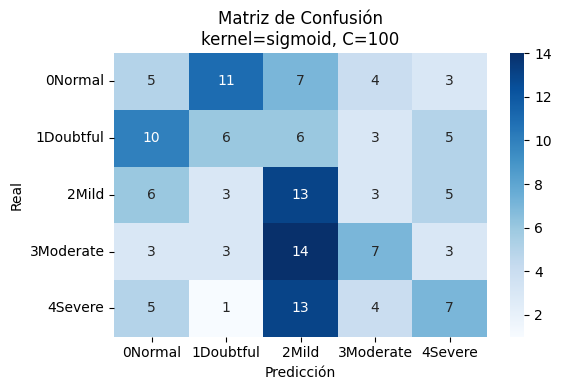

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Separar características y etiquetas desde df_pca
X = df_pca.drop(columns=['label']).values
y = df_pca['label'].values

# 2. División entrenamiento / prueba
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, stratify=y, random_state=42
)

# 3. Valores a probar
valores_C = [0.1, 1, 10, 100]
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

# 4. Evaluar todas las combinaciones
for kernel in kernels:
    for C_val in valores_C:
        print(f"\n Evaluando SVM con kernel='{kernel}' y C={C_val}")

        clf = SVC(kernel=kernel, C=C_val, gamma='scale')  # gamma='scale' es adecuado por defecto
        clf.fit(X_train, y_train)
        y_pred = clf.predict(X_test)

        # Reporte
        print("Reporte de clasificación:")
        print(classification_report(y_test, y_pred))

        # Matriz de confusión
        cm = confusion_matrix(y_test, y_pred)
        plt.figure(figsize=(6, 4))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=clf.classes_,
                    yticklabels=clf.classes_)
        plt.title(f'Matriz de Confusión\nkernel={kernel}, C={C_val}')
        plt.xlabel('Predicción')
        plt.ylabel('Real')
        plt.tight_layout()
        plt.show()


## Con Stratified K-fold


🔍 Evaluando SVM con kernel='linear' y C=0.1

✅ Mejor Fold: 4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.61      0.55      0.58        20
   1Doubtful       0.53      0.45      0.49        20
       2Mild       0.33      0.30      0.32        20
   3Moderate       0.43      0.65      0.52        20
     4Severe       0.47      0.40      0.43        20

    accuracy                           0.47       100
   macro avg       0.48      0.47      0.47       100
weighted avg       0.48      0.47      0.47       100



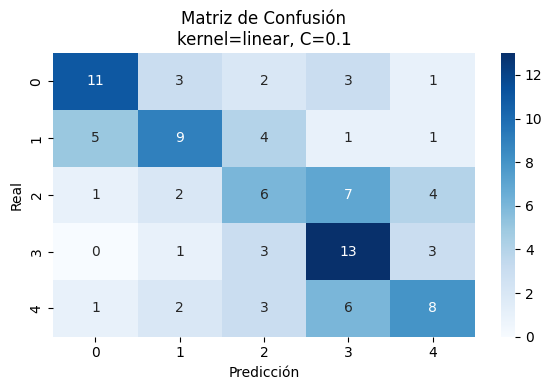

📊 Métricas promedio (5 folds):
Accuracy:  0.3840 ± 0.0463
Precision: 0.3989 ± 0.0428
Recall:    0.3840 ± 0.0463
F1-Score:  0.3851 ± 0.0442

🔍 Evaluando SVM con kernel='linear' y C=1

✅ Mejor Fold: 4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.55      0.55      0.55        20
   1Doubtful       0.56      0.45      0.50        20
       2Mild       0.32      0.30      0.31        20
   3Moderate       0.45      0.70      0.55        20
     4Severe       0.50      0.35      0.41        20

    accuracy                           0.47       100
   macro avg       0.48      0.47      0.46       100
weighted avg       0.48      0.47      0.46       100



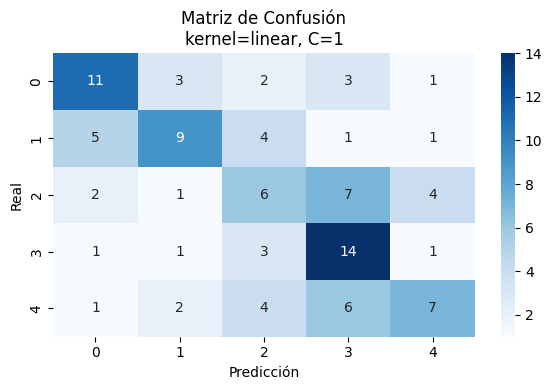

📊 Métricas promedio (5 folds):
Accuracy:  0.3760 ± 0.0488
Precision: 0.3908 ± 0.0457
Recall:    0.3760 ± 0.0488
F1-Score:  0.3773 ± 0.0460

🔍 Evaluando SVM con kernel='linear' y C=10

✅ Mejor Fold: 4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.55      0.55      0.55        20
   1Doubtful       0.56      0.45      0.50        20
       2Mild       0.30      0.30      0.30        20
   3Moderate       0.47      0.75      0.58        20
     4Severe       0.42      0.25      0.31        20

    accuracy                           0.46       100
   macro avg       0.46      0.46      0.45       100
weighted avg       0.46      0.46      0.45       100



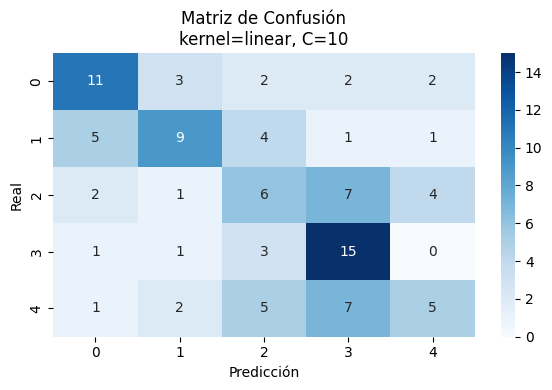

📊 Métricas promedio (5 folds):
Accuracy:  0.3740 ± 0.0436
Precision: 0.3871 ± 0.0379
Recall:    0.3740 ± 0.0436
F1-Score:  0.3742 ± 0.0380

🔍 Evaluando SVM con kernel='linear' y C=100

✅ Mejor Fold: 4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.55      0.55      0.55        20
   1Doubtful       0.56      0.45      0.50        20
       2Mild       0.30      0.30      0.30        20
   3Moderate       0.47      0.75      0.58        20
     4Severe       0.42      0.25      0.31        20

    accuracy                           0.46       100
   macro avg       0.46      0.46      0.45       100
weighted avg       0.46      0.46      0.45       100



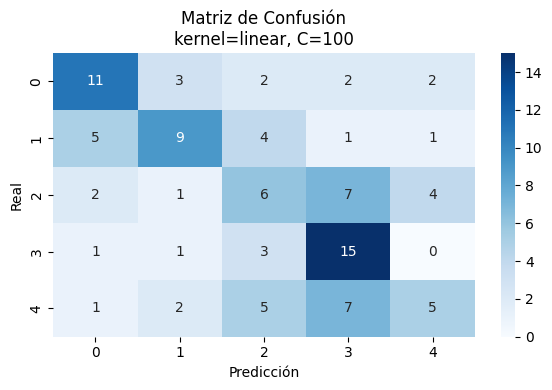

📊 Métricas promedio (5 folds):
Accuracy:  0.3720 ± 0.0449
Precision: 0.3856 ± 0.0386
Recall:    0.3720 ± 0.0449
F1-Score:  0.3723 ± 0.0390

🔍 Evaluando SVM con kernel='rbf' y C=0.1

✅ Mejor Fold: 4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.50      0.60      0.55        20
   1Doubtful       0.61      0.55      0.58        20
       2Mild       0.40      0.30      0.34        20
   3Moderate       0.37      0.50      0.43        20
     4Severe       0.31      0.25      0.28        20

    accuracy                           0.44       100
   macro avg       0.44      0.44      0.43       100
weighted avg       0.44      0.44      0.43       100



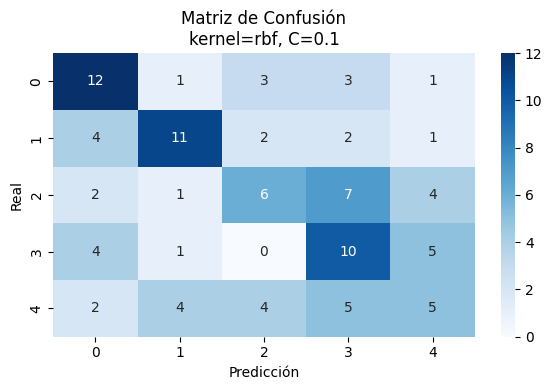

📊 Métricas promedio (5 folds):
Accuracy:  0.4020 ± 0.0256
Precision: 0.4111 ± 0.0210
Recall:    0.4020 ± 0.0256
F1-Score:  0.4010 ± 0.0230

🔍 Evaluando SVM con kernel='rbf' y C=1

✅ Mejor Fold: 2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.32      0.45      0.38        20
   1Doubtful       0.42      0.50      0.45        20
       2Mild       0.55      0.30      0.39        20
   3Moderate       0.58      0.55      0.56        20
     4Severe       0.56      0.50      0.53        20

    accuracy                           0.46       100
   macro avg       0.48      0.46      0.46       100
weighted avg       0.48      0.46      0.46       100



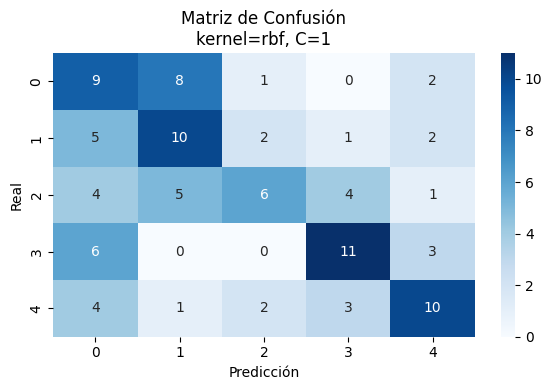

📊 Métricas promedio (5 folds):
Accuracy:  0.4340 ± 0.0150
Precision: 0.4417 ± 0.0226
Recall:    0.4340 ± 0.0150
F1-Score:  0.4302 ± 0.0182

🔍 Evaluando SVM con kernel='rbf' y C=10

✅ Mejor Fold: 2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.31      0.50      0.38        20
   1Doubtful       0.40      0.50      0.44        20
       2Mild       0.46      0.30      0.36        20
   3Moderate       0.79      0.55      0.65        20
     4Severe       0.75      0.60      0.67        20

    accuracy                           0.49       100
   macro avg       0.54      0.49      0.50       100
weighted avg       0.54      0.49      0.50       100



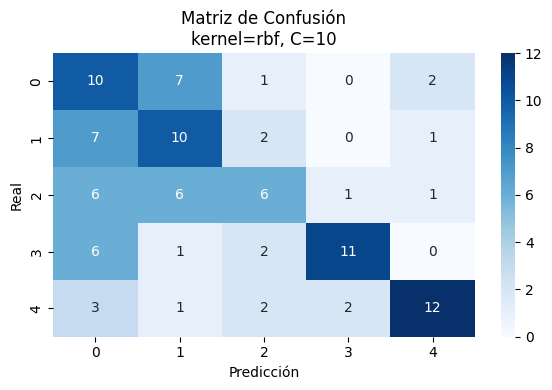

📊 Métricas promedio (5 folds):
Accuracy:  0.4160 ± 0.0427
Precision: 0.4265 ± 0.0625
Recall:    0.4160 ± 0.0427
F1-Score:  0.4144 ± 0.0484

🔍 Evaluando SVM con kernel='rbf' y C=100

✅ Mejor Fold: 3
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.48      0.50      0.49        20
   1Doubtful       0.50      0.65      0.57        20
       2Mild       0.35      0.30      0.32        20
   3Moderate       0.46      0.60      0.52        20
     4Severe       0.60      0.30      0.40        20

    accuracy                           0.47       100
   macro avg       0.48      0.47      0.46       100
weighted avg       0.48      0.47      0.46       100



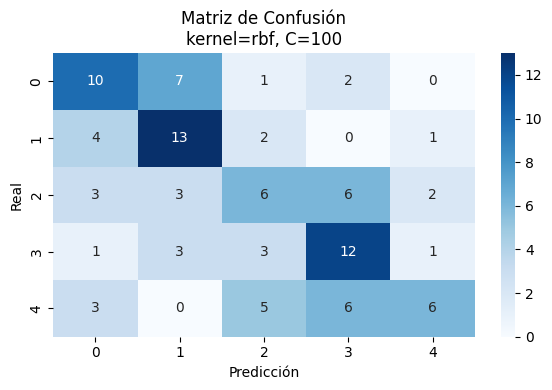

📊 Métricas promedio (5 folds):
Accuracy:  0.3940 ± 0.0524
Precision: 0.4051 ± 0.0540
Recall:    0.3940 ± 0.0524
F1-Score:  0.3940 ± 0.0501

🔍 Evaluando SVM con kernel='poly' y C=0.1

✅ Mejor Fold: 4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.80      0.20      0.32        20
   1Doubtful       0.86      0.60      0.71        20
       2Mild       1.00      0.05      0.10        20
   3Moderate       0.62      0.25      0.36        20
     4Severe       0.26      0.95      0.41        20

    accuracy                           0.41       100
   macro avg       0.71      0.41      0.38       100
weighted avg       0.71      0.41      0.38       100



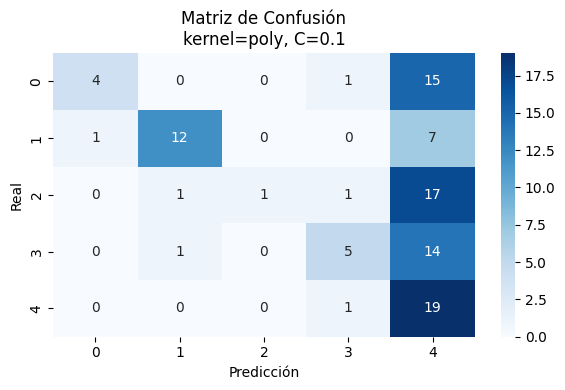

📊 Métricas promedio (5 folds):
Accuracy:  0.3180 ± 0.0591
Precision: 0.4888 ± 0.1774
Recall:    0.3180 ± 0.0591
F1-Score:  0.2700 ± 0.0727

🔍 Evaluando SVM con kernel='poly' y C=1

✅ Mejor Fold: 2
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.33      0.30      0.32        20
   1Doubtful       0.38      0.30      0.33        20
       2Mild       0.59      0.50      0.54        20
   3Moderate       0.70      0.35      0.47        20
     4Severe       0.41      0.80      0.54        20

    accuracy                           0.45       100
   macro avg       0.48      0.45      0.44       100
weighted avg       0.48      0.45      0.44       100



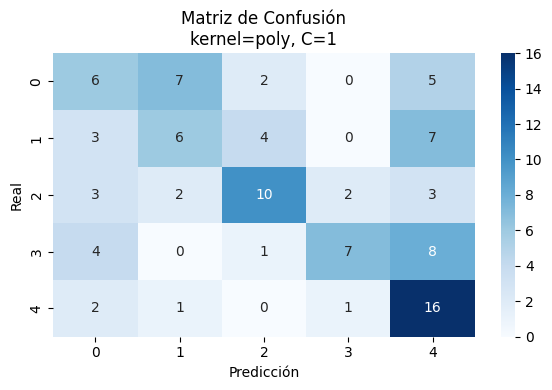

📊 Métricas promedio (5 folds):
Accuracy:  0.3840 ± 0.0398
Precision: 0.4422 ± 0.0468
Recall:    0.3840 ± 0.0398
F1-Score:  0.3696 ± 0.0469

🔍 Evaluando SVM con kernel='poly' y C=10

✅ Mejor Fold: 3
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.44      0.35      0.39        20
   1Doubtful       0.64      0.45      0.53        20
       2Mild       0.27      0.15      0.19        20
   3Moderate       0.40      0.60      0.48        20
     4Severe       0.34      0.50      0.41        20

    accuracy                           0.41       100
   macro avg       0.42      0.41      0.40       100
weighted avg       0.42      0.41      0.40       100



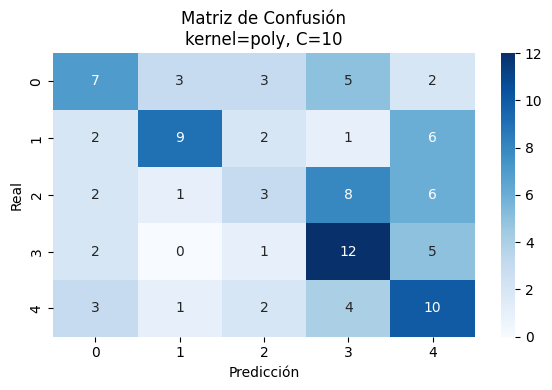

📊 Métricas promedio (5 folds):
Accuracy:  0.3660 ± 0.0301
Precision: 0.3746 ± 0.0346
Recall:    0.3660 ± 0.0301
F1-Score:  0.3615 ± 0.0303

🔍 Evaluando SVM con kernel='poly' y C=100

✅ Mejor Fold: 3
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.40      0.40      0.40        20
   1Doubtful       0.48      0.55      0.51        20
       2Mild       0.38      0.25      0.30        20
   3Moderate       0.42      0.65      0.51        20
     4Severe       0.31      0.20      0.24        20

    accuracy                           0.41       100
   macro avg       0.40      0.41      0.39       100
weighted avg       0.40      0.41      0.39       100



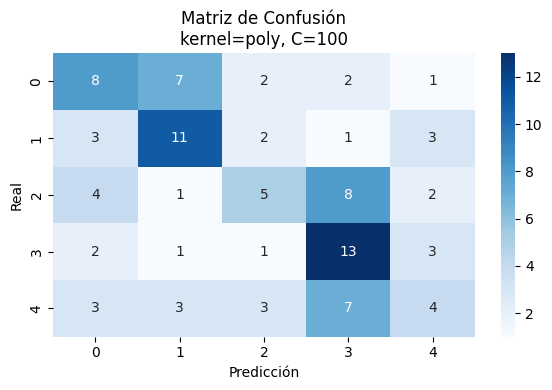

📊 Métricas promedio (5 folds):
Accuracy:  0.3380 ± 0.0435
Precision: 0.3372 ± 0.0384
Recall:    0.3380 ± 0.0435
F1-Score:  0.3328 ± 0.0387

🔍 Evaluando SVM con kernel='sigmoid' y C=0.1

✅ Mejor Fold: 4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.48      0.50      0.49        20
   1Doubtful       0.73      0.40      0.52        20
       2Mild       0.35      0.45      0.39        20
   3Moderate       0.57      0.65      0.60        20
     4Severe       0.42      0.40      0.41        20

    accuracy                           0.48       100
   macro avg       0.51      0.48      0.48       100
weighted avg       0.51      0.48      0.48       100



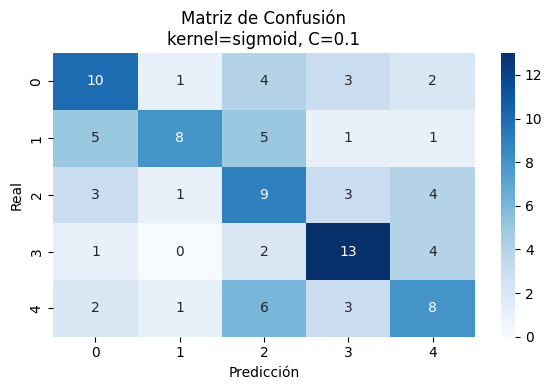

📊 Métricas promedio (5 folds):
Accuracy:  0.3720 ± 0.0591
Precision: 0.4097 ± 0.0505
Recall:    0.3720 ± 0.0591
F1-Score:  0.3730 ± 0.0579

🔍 Evaluando SVM con kernel='sigmoid' y C=1

✅ Mejor Fold: 4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.46      0.55      0.50        20
   1Doubtful       0.64      0.45      0.53        20
       2Mild       0.40      0.40      0.40        20
   3Moderate       0.45      0.50      0.48        20
     4Severe       0.40      0.40      0.40        20

    accuracy                           0.46       100
   macro avg       0.47      0.46      0.46       100
weighted avg       0.47      0.46      0.46       100



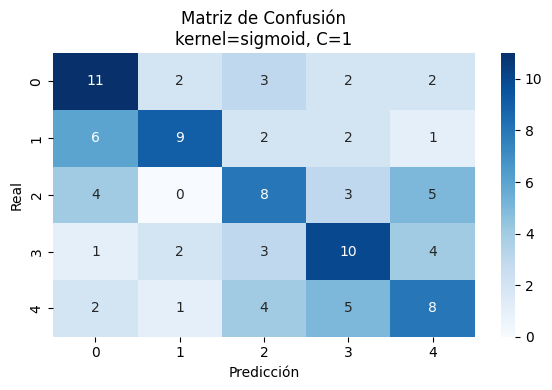

📊 Métricas promedio (5 folds):
Accuracy:  0.3440 ± 0.0816
Precision: 0.3609 ± 0.0728
Recall:    0.3440 ± 0.0816
F1-Score:  0.3462 ± 0.0788

🔍 Evaluando SVM con kernel='sigmoid' y C=10

✅ Mejor Fold: 4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.38      0.50      0.43        20
   1Doubtful       0.46      0.30      0.36        20
       2Mild       0.22      0.25      0.23        20
   3Moderate       0.29      0.30      0.29        20
     4Severe       0.24      0.20      0.22        20

    accuracy                           0.31       100
   macro avg       0.32      0.31      0.31       100
weighted avg       0.32      0.31      0.31       100



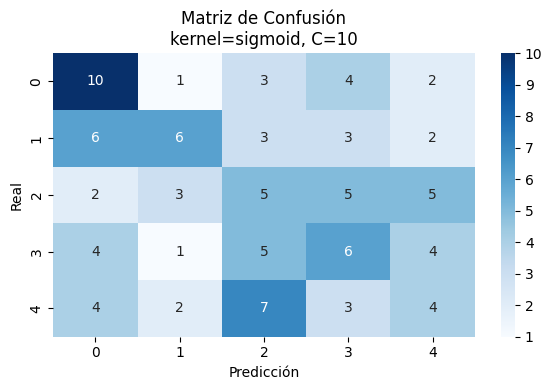

📊 Métricas promedio (5 folds):
Accuracy:  0.2640 ± 0.0496
Precision: 0.2777 ± 0.0426
Recall:    0.2640 ± 0.0496
F1-Score:  0.2618 ± 0.0474

🔍 Evaluando SVM con kernel='sigmoid' y C=100

✅ Mejor Fold: 4
Reporte de clasificación:
              precision    recall  f1-score   support

     0Normal       0.31      0.50      0.38        20
   1Doubtful       0.40      0.20      0.27        20
       2Mild       0.28      0.35      0.31        20
   3Moderate       0.41      0.35      0.38        20
     4Severe       0.25      0.20      0.22        20

    accuracy                           0.32       100
   macro avg       0.33      0.32      0.31       100
weighted avg       0.33      0.32      0.31       100



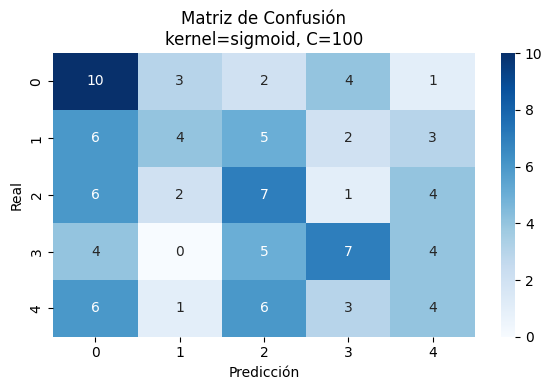

📊 Métricas promedio (5 folds):
Accuracy:  0.2540 ± 0.0568
Precision: 0.2605 ± 0.0506
Recall:    0.2540 ± 0.0568
F1-Score:  0.2466 ± 0.0532


In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Separar características y etiquetas desde df_pca
X = df_pca.drop(columns=['label']).values
y = df_pca['label'].values

# 2. Configurar Stratified K-Fold
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 3. Valores a probar
valores_C = [0.1, 1, 10, 100]
kernels = ['linear', 'rbf', 'poly', 'sigmoid']

# 4. Evaluar combinaciones
for kernel in kernels:
    for C_val in valores_C:
        print(f"\n🔍 Evaluando SVM con kernel='{kernel}' y C={C_val}")

        clf = SVC(kernel=kernel, C=C_val, gamma='scale')

        accuracies, precisions, recalls, f1_scores = [], [], [], []
        fold_predictions, fold_truths = [], []

        for fold_idx, (train_idx, test_idx) in enumerate(skf.split(X, y)):
            X_train, X_test = X[train_idx], X[test_idx]
            y_train, y_test = y[train_idx], y[test_idx]

            clf.fit(X_train, y_train)
            y_pred = clf.predict(X_test)

            accuracies.append(accuracy_score(y_test, y_pred))
            precisions.append(precision_score(y_test, y_pred, average='weighted', zero_division=0))
            recalls.append(recall_score(y_test, y_pred, average='weighted'))
            f1_scores.append(f1_score(y_test, y_pred, average='weighted'))

            fold_predictions.append(y_pred)
            fold_truths.append(y_test)

        # Mejor fold
        best_fold = np.argmax(accuracies)
        print(f"\n✅ Mejor Fold: {best_fold + 1}")
        print("Reporte de clasificación:")
        print(classification_report(fold_truths[best_fold], fold_predictions[best_fold]))

        cm = confusion_matrix(fold_truths[best_fold], fold_predictions[best_fold])
        plt.figure(figsize=(6, 4))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
        plt.title(f'Matriz de Confusión\nkernel={kernel}, C={C_val}')
        plt.xlabel('Predicción')
        plt.ylabel('Real')
        plt.tight_layout()
        plt.show()

        # Métricas promedio
        print("📊 Métricas promedio (5 folds):")
        print(f"Accuracy:  {np.mean(accuracies):.4f} ± {np.std(accuracies):.4f}")
        print(f"Precision: {np.mean(precisions):.4f} ± {np.std(precisions):.4f}")
        print(f"Recall:    {np.mean(recalls):.4f} ± {np.std(recalls):.4f}")
        print(f"F1-Score:  {np.mean(f1_scores):.4f} ± {np.std(f1_scores):.4f}")


# Resultados

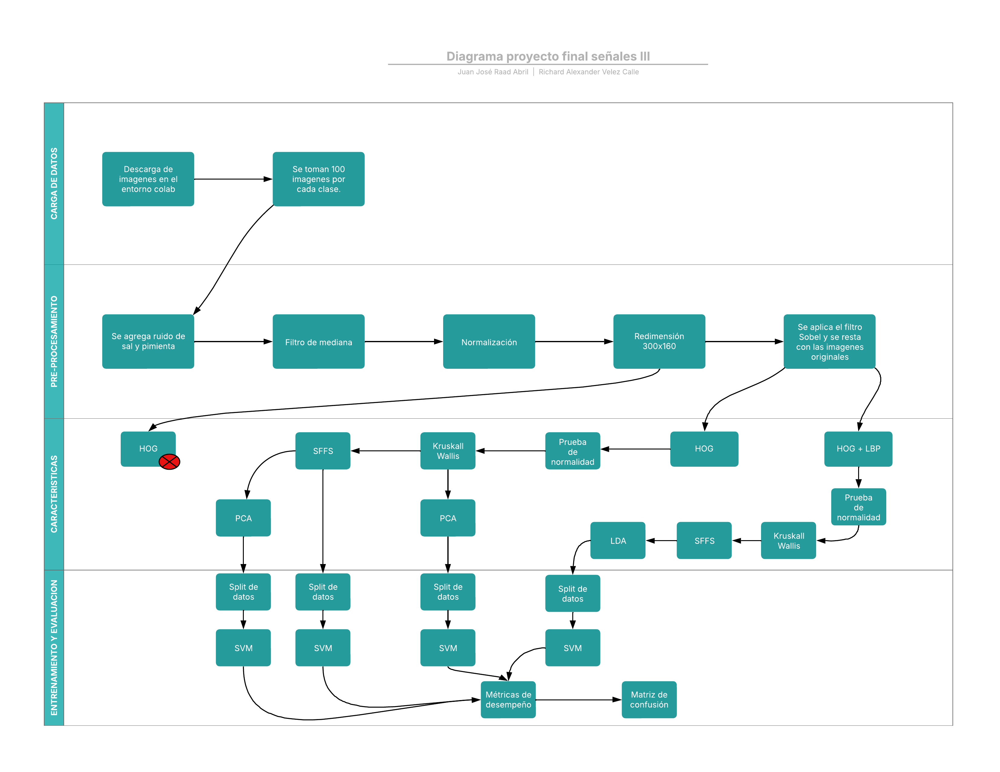

## HOG ➝ Kruskall ➝ PCA ➝ SVM

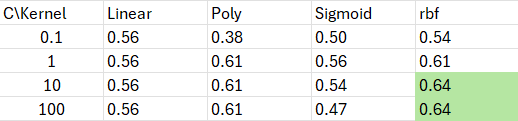

Para este caso, se observa que el kernel gaussiano es el ideal para este caso, dando una exactitud del 64% con dos valores C diferentes.

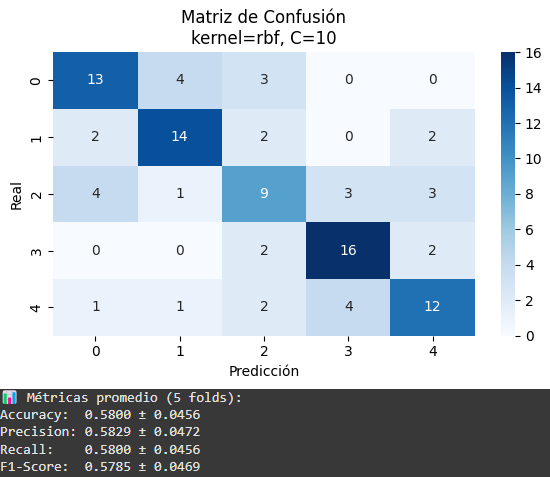

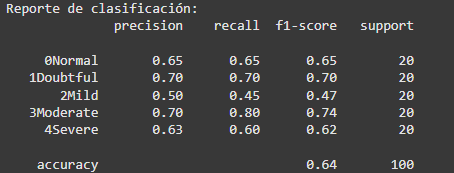

## HOG ➝ Kruskall ➝ SFFS ➝ SVM

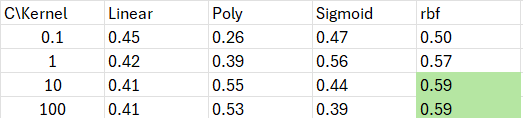

Para este caso, el kernel gaussiano vuelve hacer la mejor opcion con los mismos valores de C.

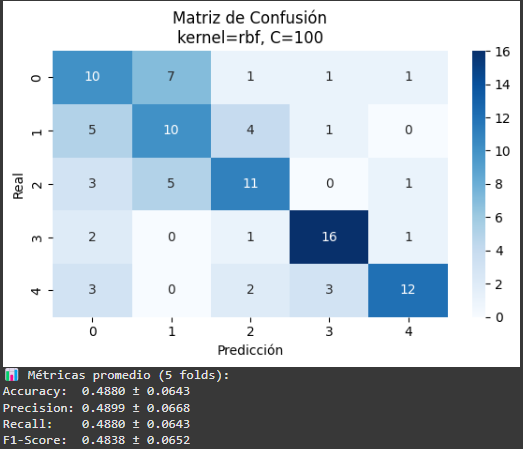

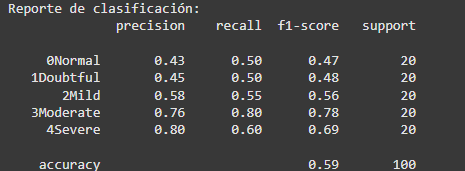

## HOG ➝ Kruskall ➝ SFFS ➝ PCA ➝ SVM

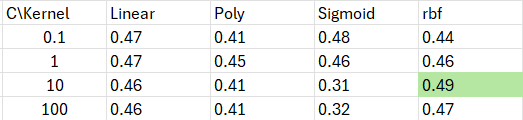

Vuelve el kernel gaussiano a ser mejor que el resto de configuraciones, aunque esta vez por muy poca diferencia

Además se puede destacar el bajo rendimiento en general de este método

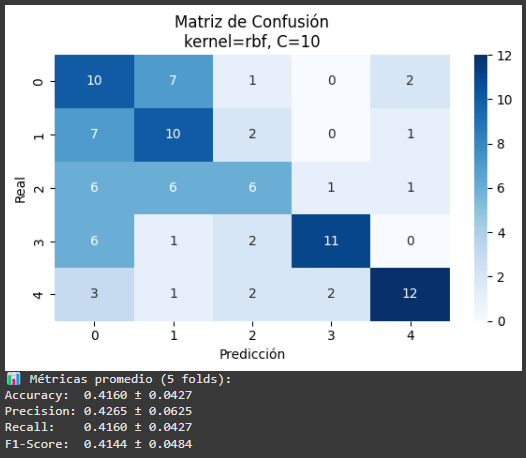

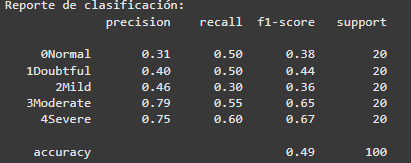

## HOG + LBP ➝ Kruskall ➝ SFFS ➝ LDA ➝ SVM

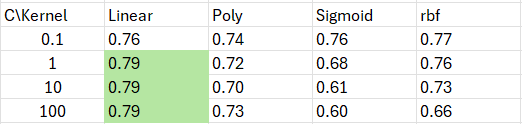

Para este caso vemos que el kernel lineal tiene 3 valores de C con valores de exactitud muy altas, siendo el mejor de todos los resultados realizados.

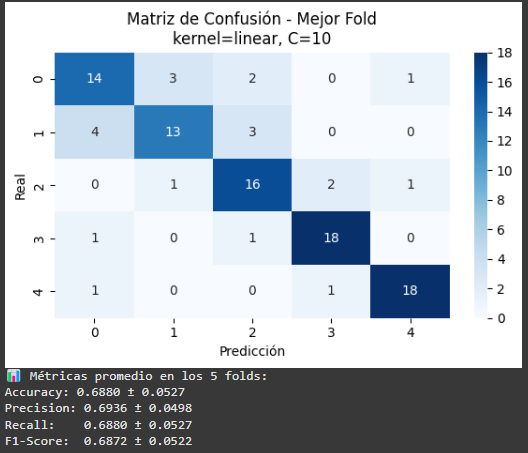

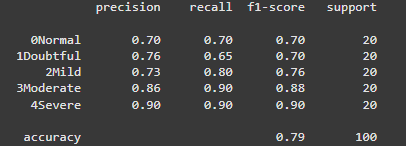

## Conclusiones

- Se aplicó la prueba de Kolmogorov-Smirnov para verificar si las características extraídas seguían una distribución normal en cada clase. Este análisis permitió determinar si era adecuado aplicar técnicas estadísticas paramétricas o si se debía optar por enfoques no paramétricos durante la fase de modelado.

- La aplicación del test de Kruskal-Wallis permitió una reducción significativa del número de características originales, al identificar aquellas variables con diferencias estadísticamente significativas entre grupos. Esto contribuyó a eliminar información redundante o irrelevante y a simplificar el conjunto de datos sin pérdida sustancial de información discriminativa.

- Los descriptores HOG y LBP demostraron ser herramientas efectivas para la extracción de características relevantes de imágenes. HOG capturó información estructural basada en los bordes y contornos predominantes, mientras que LBP permitió representar patrones locales de textura. La combinación de ambos enfoques ofreció una representación robusta de las imágenes.

- La utilización del algoritmo SFFS como método de selección de características permitió optimizar aún más el subconjunto de variables seleccionadas, logrando un equilibrio entre desempeño y complejidad. Su capacidad de agregar y retirar características de forma dinámica facilitó una búsqueda más exhaustiva del conjunto óptimo.

- Ventaja del Stratified K-Fold
En todos los casos analizados, el uso de validación cruzada estratificada (Stratified K-Fold) mejoró la estabilidad de las métricas obtenidas. Este enfoque permite una evaluación más realista del rendimiento del modelo al mantener la proporción de clases en cada fold, lo que es especialmente importante en problemas con clases desbalanceadas o múltiples niveles de una condición (como ocurre con la osteoartritis).

- Desempeño de los kernels en SVM
Aunque el kernel gaussiano (RBF) fue el que mejor rendimiento ofreció en la mayoría de rutas evaluadas, la ruta ganadora logró su mejor resultado usando el kernel lineal, lo que indica que, después de un adecuado procesamiento y selección de características, las clases podrían ser separables linealmente en el nuevo espacio reducido por LDA.

- Importancia del preprocesamiento
El proceso de preprocesamiento de las imágenes jugó un rol fundamental en la calidad de los resultados. Los pasos que marcaron diferencia fueron:

Normalización de intensidades (0 a 1) para asegurar consistencia en el rango de píxeles.

Redimensionamiento a tamaños uniformes para facilitar la extracción de características.

Aplicación del operador Sobel para resaltar bordes importantes en las radiografías.

Resta entre la imagen original y la imagen con Sobel, lo que ayudó a resaltar estructuras óseas clave y mejorar la discriminación de características por HOG.

- Sintonización de parámetros clave
Finalmente, se comprobó que ajustar cuidadosamente los parámetros de extracción de características, como:

Número de orientaciones y tamaño de celda en HOG

Número de puntos y radio en LBP

Valores de C y tipo de kernel en SVM

puede tener un impacto significativo en el rendimiento final del sistema. La optimización de estos hiperparámetros fue esencial para alcanzar el mejor resultado.